# Projet 6 : Classifiez automatiquement des biens de consommation

## Import librairies

In [1]:
pip install pingouin

     |████████████████████████████████| 225kB 7.5MB/s 
  Created wheel for pingouin: filename=pingouin-0.3.9-cp36-none-any.whl size=223375 sha256=203b1adbbee2a25d64321c2fb245c63bb2173b9e71faceb9c2d968e41ac919ce
  Stored in directory: /root/.cache/pip/wheels/6c/d7/26/a23b9ed74061adc5cf8f5e016bbe2902a8ebf63b6471047dbc
  Created wheel for outdated: filename=outdated-0.2.0-cp36-none-any.whl size=4961 sha256=615b174f3440fbd2507f222a3a2f96e0126145e047af532fdfe6979a8484a321
  Stored in directory: /root/.cache/pip/wheels/fd/7c/ef/814f514d31197310872b5abf353feb8fef9d67ee658e1e7e39
  Created wheel for littleutils: filename=littleutils-0.2.2-cp36-none-any.whl size=7051 sha256=d5e7e5e6b034f9e9df545270ec860b9fc1e04d56a35ab7c063d5f0bedb8c2ebd
  Stored in directory: /root/.cache/pip/wheels/53/16/9f/ac67d15c40243754fd73f620e1b9b6dedc20492ecc19a2bae1
Successfully built pingouin outdated littleutils


In [1]:
# Import librairies and modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib.patheffects as PathEffects
import matplotlib.cm as cm
import seaborn as sns
import math as m
import pickle
import re
import nltk
import cv2
import glob
import pathlib
%matplotlib inline


from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize
from sklearn.feature_extraction import text 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
from scipy.linalg import svdvals 
from collections import Counter
from wordcloud import WordCloud
from PIL import Image
from keras.preprocessing import image
from keras.applications.resnet50 import ResNet50
from keras.applications.resnet50 import preprocess_input

from google.colab import files
from google.colab import drive 

import pingouin as pg

In [2]:
# Mount drive in colab
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Exploration

## Fichier Texte

In [ ]:
df_flipkart = pd.read_csv('/content/gdrive/My Drive/Colab Notebooks/Projet 6/flipkart_com-ecommerce_sample_1050.csv')

In [ ]:
df_flipkart.sample(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
982,bdcc7e18ffed5390cd3107030992ffa6,2016-04-01 10:31:02 +0000,http://www.flipkart.com/rishan-printed-baby-bo...,Rishan Printed Baby Boy's V-neck T-Shirt,"[""Baby Care >> Infant Wear >> Baby Boys' Cloth...",TSHECNFS9HYANZZP,299.0,159.0,bdcc7e18ffed5390cd3107030992ffa6.jpg,False,Specifications of Rishan Printed Baby Boy's V-...,No rating available,No rating available,Rishan,"{""product_specification""=>[{""key""=>""Sleeve"", ""..."
67,707b160df4c4dece6cde52b222ce624b,2016-04-19 05:00:32 +0000,http://www.flipkart.com/prime-printed-4-seater...,Prime Printed 4 Seater Table Cover,"[""Home Furnishing >> Kitchen & Dining Linen >>...",TCVEHSMFAGATW2FZ,1000.0,499.0,707b160df4c4dece6cde52b222ce624b.jpg,False,Key Features of Prime Printed 4 Seater Table C...,No rating available,No rating available,Prime,"{""product_specification""=>[{""key""=>""Number of ..."
455,3b0f02b3acf1825f8bbc1fb3b860dbb8,2015-12-03 21:49:05 +0000,http://www.flipkart.com/milton-school-750-ml-w...,Milton School 750 ml Water Bottle,"[""Kitchen & Dining >> Containers & Bottles >> ...",WBTDMEZTDSZGZEDJ,184.0,175.0,3b0f02b3acf1825f8bbc1fb3b860dbb8.jpg,False,Flipkart.com: Buy Milton School 750 ml Water B...,5,5,NaN,"{""product_specification""=>[{""key""=>""Series"", ""..."
838,e426290a8f57e82680275bb91df91ad1,2015-12-29 05:07:38 +0000,http://www.flipkart.com/techone-flexible-se122...,Techone+ Flexible SE122103-GREEN USB Led Light,"[""Computers >> Laptop Accessories >> USB Gadge...",USGEDDUFGZ6TVAZU,699.0,449.0,e426290a8f57e82680275bb91df91ad1.jpg,False,Techone+ Flexible SE122103-GREEN USB Led Light...,No rating available,No rating available,Techone+,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
686,911a6efe69bde398fbbddcb0b4bb466f,2015-12-31 09:19:31 +0000,http://www.flipkart.com/keya-seth-umbrella-pro...,Keya Seth Umbrella Protex Heat Proof Sunscreen...,"[""Beauty and Personal Care >> Body and Skin Ca...",SNRECF6UH7GERGGU,399.0,399.0,911a6efe69bde398fbbddcb0b4bb466f.jpg,False,Flipkart.com: Buy Keya Seth Umbrella Protex He...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Quantity"",..."


### Information Générales sur le Data Set Initial

In [ ]:
# Dimensions of the table 
print(df_flipkart.shape)
# Informations
print(df_flipkart.info())
# List columns
print(list(df_flipkart.columns.values))
# Observe types of data for each column
print(df_flipkart.dtypes)
# Count the different types of data of the df
print(df_flipkart.dtypes.value_counts())

(1050, 15)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_speci

In [ ]:
# Dimensions the table
df_flipkart.shape

(1050, 15)

In [ ]:
# List columns
for  col in df_flipkart.columns:
    print(col)

uniq_id
crawl_timestamp
product_url
product_name
product_category_tree
pid
retail_price
discounted_price
image
is_FK_Advantage_product
description
product_rating
overall_rating
brand
product_specifications


In [ ]:
# Count the different types of data of the df
df_flipkart.dtypes.value_counts()

object     12
float64     2
bool        1
dtype: int64

([<matplotlib.patches.Wedge at 0x7f3419748dd8>,
 [Text(-0.7053422663930613, -0.9708204196655013, 'float'),
  Text(0.9660881889627516, 0.8698698817332803, 'object'),
  Text(0.2910761897834024, 1.369406678726658, 'int')])

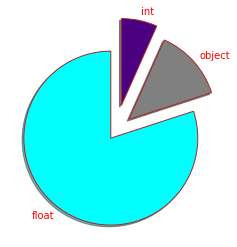

In [ ]:
# Graph with the different types of data

piechart = df_flipkart.dtypes.value_counts()

# Legende
legende = ['float', 'object', 'int']

# Creating explode data 
explode = (0.1, 0.2, 0.3 ) 
  
# Creating color parameters 
colors = ('cyan', 
          'grey', 'indigo') 
  
# Wedge properties 
wp = { 'linewidth' : 1, 'edgecolor' : 'brown' } 

plt.pie(piechart, 
        explode = explode,
        labels = legende, 
        shadow = True, 
        colors = colors, 
        startangle = 90, 
        wedgeprops = wp, 
        textprops = dict(color ='red'))

In [ ]:
df_flipkart.sample(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
458,650e27dff8f645649353743f64e03f77,2016-03-11 11:26:55 +0000,http://www.flipkart.com/hp-v220w-16-gb-pen-dri...,HP v220w 16 GB Pen Drive,"[""Computers >> Storage >> Pen Drives >> HP Pen...",ACCEGF6WWRAUMRPT,750.0,550.0,650e27dff8f645649353743f64e03f77.jpg,False,Specifications of HP v220w 16 GB Pen Drive (S...,No rating available,No rating available,HP,"{""product_specification""=>[{""key""=>""Interface""..."
432,7f2f1f3039d1f5bc23226fc36577eab9,2016-03-11 06:55:07 +0000,http://www.flipkart.com/smartpro-19-5v-3-9a-re...,"Smartpro 19.5v,3.9a Replacement Charger for Va...","[""Computers >> Laptop Accessories >> Adapters ...",ACCEGZ6BUESXR4VH,1499.0,539.0,7f2f1f3039d1f5bc23226fc36577eab9.jpg,False,"Key Features of Smartpro 19.5v,3.9a Replacemen...",No rating available,No rating available,Smartpro,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
946,2cc24452688ed35dfbff566e22e53c95,2016-01-01 13:15:34 +0000,http://www.flipkart.com/organistick-silver-lab...,Organistick Silver Label Lipstick 10 g,"[""Beauty and Personal Care >> Makeup >> Lips >...",LSKE6FWHDDWY7J5T,149.0,149.0,2cc24452688ed35dfbff566e22e53c95.jpg,False,Flipkart.com: Buy Organistick Silver Label Lip...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Organic Ty..."
643,86a39f77de21aa9654e8ea03335244fc,2016-02-28 10:36:58 +0000,http://www.flipkart.com/intel-3-2-ghz-lga-1150...,Intel 3.2 GHz LGA 1150 3250 Processor,"[""Computers >> Computer Components >> Processo...",PSREGFZ8MXRM6FFQ,6100.0,4500.0,86a39f77de21aa9654e8ea03335244fc.jpg,False,Specifications of Intel 3.2 GHz LGA 1150 3250 ...,No rating available,No rating available,Intel,"{""product_specification""=>[{""key""=>""Sales Pack..."
226,f39a2cce8929f5b44087d688995994e4,2015-12-01 12:40:44 +0000,http://www.flipkart.com/tiedribbons-love-mom-g...,Tiedribbons We Love Mom With Green Background ...,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIE6ZSBWP9DTDHZ,1599.0,699.0,f39a2cce8929f5b44087d688995994e4.jpg,False,Buy Tiedribbons We Love Mom With Green Backgro...,No rating available,No rating available,Tiedribbons,"{""product_specification""=>[{""key""=>""Brand"", ""v..."


### Données manquantes - NaN

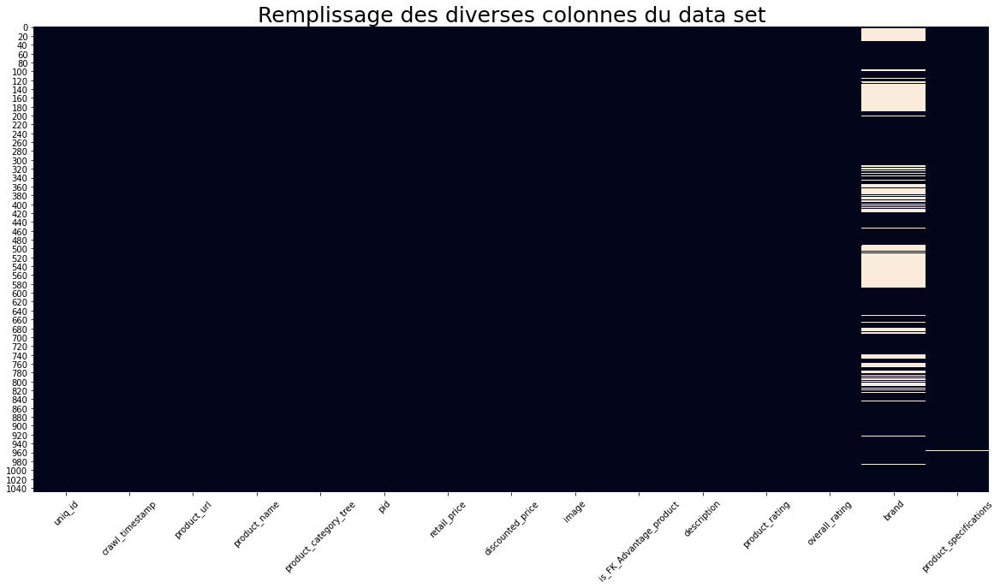

In [ ]:
# Visualisation of missing data in data set 

# Size
plt.figure(figsize=(20,10))

# Title
plt.title('Remplissage des diverses colonnes du data set', size=25)

# Rotation at 45° of xticks
plt.xticks(rotation=45)

sns.heatmap(df_flipkart.isna(), cbar=False)

In [ ]:
# Missing rate per column
missing_rate = df_flipkart.isna().sum()/df_flipkart.shape[0]

# Sort by ascending order
missing_rate.sort_values(ascending=True)

uniq_id                    0.000000
crawl_timestamp            0.000000
product_url                0.000000
product_name               0.000000
product_category_tree      0.000000
pid                        0.000000
image                      0.000000
is_FK_Advantage_product    0.000000
description                0.000000
product_rating             0.000000
overall_rating             0.000000
retail_price               0.000952
discounted_price           0.000952
product_specifications     0.000952
brand                      0.321905
dtype: float64

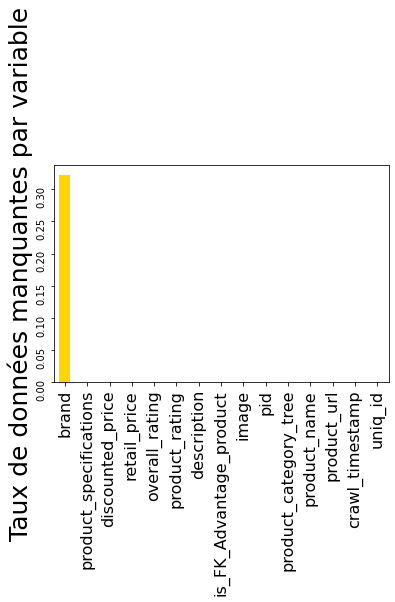

In [ ]:
missing_rate.sort_values(ascending=False).plot.bar(color='gold')

# Title
plt.ylabel('Taux de données manquantes par variable', size=25)
# plt.title()

# Size figure
plt.rcParams['figure.figsize'] = (20,10)

# Size of xlabels
plt.xticks(size=16)

# Rotation at 90° of xticks
plt.yticks(rotation=90)

plt.show()

In [ ]:
# Filling rate per column
filling_rate = 1 - missing_rate

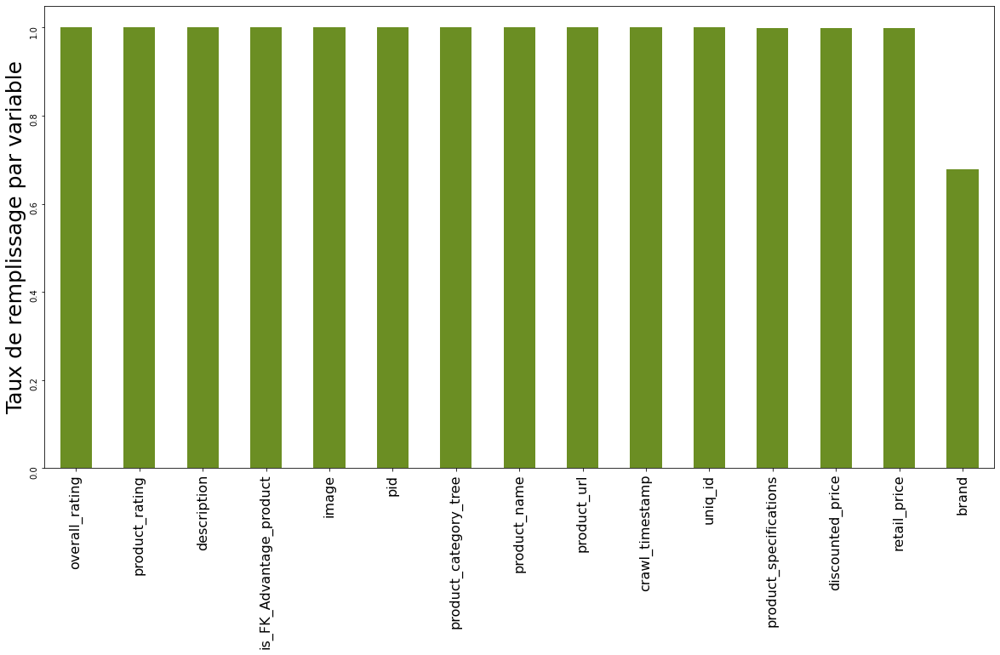

In [ ]:
filling_rate.sort_values(ascending=False).plot.bar(color='olivedrab')

# Title
plt.ylabel('Taux de remplissage par variable', size=25)
# plt.title()

# Size of figure
plt.rcParams['figure.figsize'] = (20,10)

# Size of xlabels
plt.xticks(size=16)

# Rotation at 90° of xticks
plt.yticks(rotation=90)

plt.show()

### Création de Variables

In [ ]:
df_flipkart.sample(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
857,a41371b2f8859b015031f0d5eda5184c,2015-12-29 05:07:38 +0000,http://www.flipkart.com/99gems-smart-otg-conne...,99Gems Smart OTG Connection kit USB USB Cable,"[""Computers >> Laptop Accessories >> USB Gadge...",USGEDSKFXUHKEGME,399.0,199.0,a41371b2f8859b015031f0d5eda5184c.jpg,False,99Gems Smart OTG Connection kit USB USB Cable ...,No rating available,No rating available,99Gems,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
85,61c0139f3d5c97f1615797dbf046cc0c,2016-05-16 22:42:47 +0000,http://www.flipkart.com/smart-wall-guru-medium...,Smart Wall Guru Medium Adhesive Sticker,"[""Home Decor & Festive Needs >> Wall Decor & C...",STIEGPNXUZ7MJHNF,1199.0,299.0,61c0139f3d5c97f1615797dbf046cc0c.jpg,False,Key Features of Smart Wall Guru Medium Adhesiv...,No rating available,No rating available,Smart Wall Guru,"{""product_specification""=>[{""key""=>""Number of ..."
947,4946e2411d24801b9e8f7dbe97ab1b93,2016-01-01 13:15:34 +0000,http://www.flipkart.com/eshoppee-shiv-face-ant...,Eshoppee Shiv face antique color brass idol Sh...,"[""Home Decor & Festive Needs >> Table Decor & ...",SHIEBCZQNHTSFPJG,1499.0,999.0,4946e2411d24801b9e8f7dbe97ab1b93.jpg,False,Buy Eshoppee Shiv face antique color brass ido...,No rating available,No rating available,Eshoppee,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
411,5c7b493625b5fc6689cae49d25e1ae17,2015-12-01 06:13:00 +0000,http://www.flipkart.com/aero-care-blue-4-lady-...,Aero Care Blue 4 Lady Combo Set,"[""Beauty and Personal Care >> Fragrances >> De...",CAGE8PKGVZX5FPZZ,180.0,165.0,5c7b493625b5fc6689cae49d25e1ae17.jpg,False,Flipkart.com: Buy Aero Care Blue 4 Lady Combo ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Number of ..."
488,0d02f4703fde00645704e15bba23e77d,2016-01-07 05:50:25 +0000,http://www.flipkart.com/rega-hp-pavilion-dv6-6...,Rega IT Hp Pavilion DV6-6080SF DV6-6081EI 12 C...,"[""Computers >> Laptop Accessories >> Batteries...",ACCDXFZXSFTHCQCR,4999.0,2499.0,0d02f4703fde00645704e15bba23e77d.jpg,False,Buy Rega IT Hp Pavilion DV6-6080SF DV6-6081EI ...,No rating available,No rating available,Rega IT,"{""product_specification""=>[{""key""=>""In The Box..."


In [ ]:
df_flipkart['product_specifications'].unique()

array(['{"product_specification"=>[{"key"=>"Brand", "value"=>"Elegance"}, {"key"=>"Designed For", "value"=>"Door"}, {"key"=>"Type", "value"=>"Eyelet"}, {"key"=>"Model Name", "value"=>"Abstract Polyester Door Curtain Set Of 2"}, {"key"=>"Model ID", "value"=>"Duster25"}, {"key"=>"Color", "value"=>"Multicolor"}, {"key"=>"Length", "value"=>"213 cm"}, {"key"=>"Number of Contents in Sales Package", "value"=>"Pack of 2"}, {"key"=>"Sales Package", "value"=>"2 Curtains"}, {"key"=>"Material", "value"=>"Polyester"}]}',
       '{"product_specification"=>[{"key"=>"Machine Washable", "value"=>"Yes"}, {"key"=>"Material", "value"=>"Cotton"}, {"key"=>"Design", "value"=>"Self Design"}, {"key"=>"Brand", "value"=>"Sathiyas"}, {"key"=>"Type", "value"=>"Bath Towel"}, {"key"=>"GSM", "value"=>"500"}, {"key"=>"Model Name", "value"=>"Sathiyas cotton bath towel"}, {"key"=>"Ideal For", "value"=>"Men, Women, Boys, Girls"}, {"key"=>"Model ID", "value"=>"asvtwl322"}, {"key"=>"Color", "value"=>"Red, Yellow, Blue"}, {

In [ ]:
df_flipkart['product_category_tree'].unique()

array(['["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]',
       '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]',
       '["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Eurospa Baby Bath Towels >> Eurospa Cotton Terry Face Towel Set (20 PIECE FA..."]',
       '["Home Furnishing >> Bed Linen >> Bedsheets >> SANTOSH ROYAL FASHION Bedsheets >> SANTOSH ROYAL FASHION Cotton Printed King sized ..."]',
       '["Home Furnishing >> Bed Linen >> Bedsheets >> Jaipur Print Bedsheets >> Jaipur Print Cotton Floral King sized Double Bed..."]',
       '["Watches >> Wrist Watches >> Maserati Time Wrist Watches"]',
       '["Watches >> Wrist Watches >> Camerii Wrist Watches"]',
       '["Watches >> Wrist Watches >> T STAR Wrist Watches"]',
       '["Watches >> Wrist Watches >> Alfajr Wrist Watches"]',
       '["Watches >> Wrist Watches >> T

In [ ]:
# Test 
df_flipkart['product_category_tree'].loc[1]

'["Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y..."]'

In [ ]:
# Extract the name of the category of the products

# Delete the first two characters and
# Delete the characters after '>>' 
# for each row of the column 'product_category_tree'
df_flipkart['category'] = df_flipkart['product_category_tree'].apply(lambda x : x[2: x.index('>>')]) 

In [ ]:
# Test 
df_flipkart['category'].loc[1]

'Baby Care '

In [ ]:
df_flipkart['category'].unique()

array(['Home Furnishing ', 'Baby Care ', 'Watches ',
       'Home Decor & Festive Needs ', 'Kitchen & Dining ',
       'Beauty and Personal Care ', 'Computers '], dtype=object)

### Sélection des Variables

In [ ]:
df_flipkart_final = df_flipkart[['uniq_id', 'category', 'description', 'image']]

In [ ]:
df = df_flipkart_final.copy()

## Informations Générales sur le Nouveau Data Set

In [ ]:
# Dimensions of the table 
print(df.shape)
# Informations
print(df.info())
# List columns
print(list(df.columns.values))
# Observe types of data for each column
print(df.dtypes)
# Count the different types of data of the df
print(df.dtypes.value_counts())  

(1050, 4)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   uniq_id      1050 non-null   object
 1   category     1050 non-null   object
 2   description  1050 non-null   object
 3   image        1050 non-null   object
dtypes: object(4)
memory usage: 32.9+ KB
None
['uniq_id', 'category', 'description', 'image']
uniq_id        object
category       object
description    object
image          object
dtype: object
object    4
dtype: int64


## Informations générales

In [ ]:
# Dimensions of the table 
df.shape

(1050, 4)

In [ ]:
# List columns
for  col in df.columns:
    print(col)

uniq_id
category
description
image


([<matplotlib.patches.Wedge at 0x7f340f347710>],
 [Text(-1.1, 1.3471114790620887e-16, 'object')])

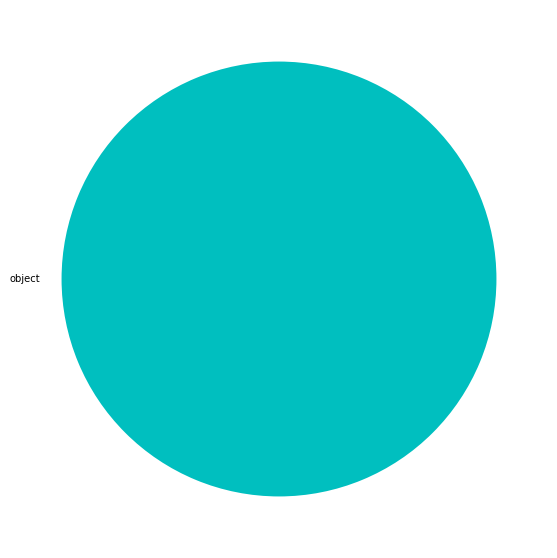

In [ ]:
# Graph with the different types of data

piechart = df.dtypes.value_counts()

# Legende
legende = ['object']

# Creating explode data 
explode = (0.1) 
  
# Creating color parameters 
colors = ('cyan') 
  
# Wedge properties 
wp = { 'linewidth' : 1, 'edgecolor' : 'brown' } 

plt.pie(piechart, 
        #explode = explode,
        labels = legende, 
        #shadow = True, 
        colors = colors, 
        #startangle = 90, 
        #wedgeprops = wp, 
        #textprops = dict(color ='red')
        )

In [ ]:
df.sample(5)

,uniq_id,category,description,image
392,d376da2235096f74600d842b6f5f2d1a,Beauty and Personal Care,"Flipkart.com: Buy Wild Stone Drift,Wave Combo ...",d376da2235096f74600d842b6f5f2d1a.jpg
621,46ca672fdfff8a1b3641642a9795344a,Baby Care,"Key Features of You Got Plan B Baby Boy's, Bab...",46ca672fdfff8a1b3641642a9795344a.jpg
534,4019ad332ca3ce22449ff54fdd49a273,Watches,Timewel 1100-N1685 Analog Watch - For Men - B...,4019ad332ca3ce22449ff54fdd49a273.jpg
75,ae45b64d808a883aa35f2bf4de879cac,Baby Care,Specifications of Vitamins Embroidered Baby Gi...,ae45b64d808a883aa35f2bf4de879cac.jpg
229,caabe6014b914fe2874a9a8d7284f79b,Home Decor & Festive Needs,Buy Surface 180 Elephant Shape Handpainted Woo...,caabe6014b914fe2874a9a8d7284f79b.jpg


## Données manquantes - NaN

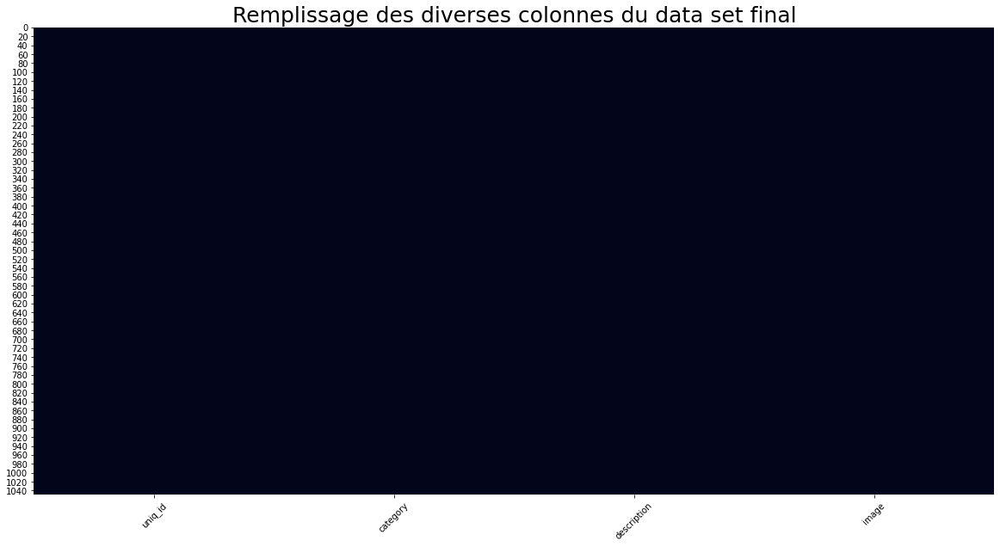

In [ ]:
# Visualisation of missing data in data set 

# Size
plt.figure(figsize=(20,10))

# Title 
plt.title('Remplissage des diverses colonnes du data set final', size=25)

# Rotation at 45° of xticks
plt.xticks(rotation=45)

sns.heatmap(df.isna(), cbar=False)

In [ ]:
# Missing rate per column
missing_rate = df.isna().sum()/df.shape[0]

# Sort by ascending order
missing_rate.sort_values(ascending=True)

uniq_id        0.0
category       0.0
description    0.0
image          0.0
dtype: float64

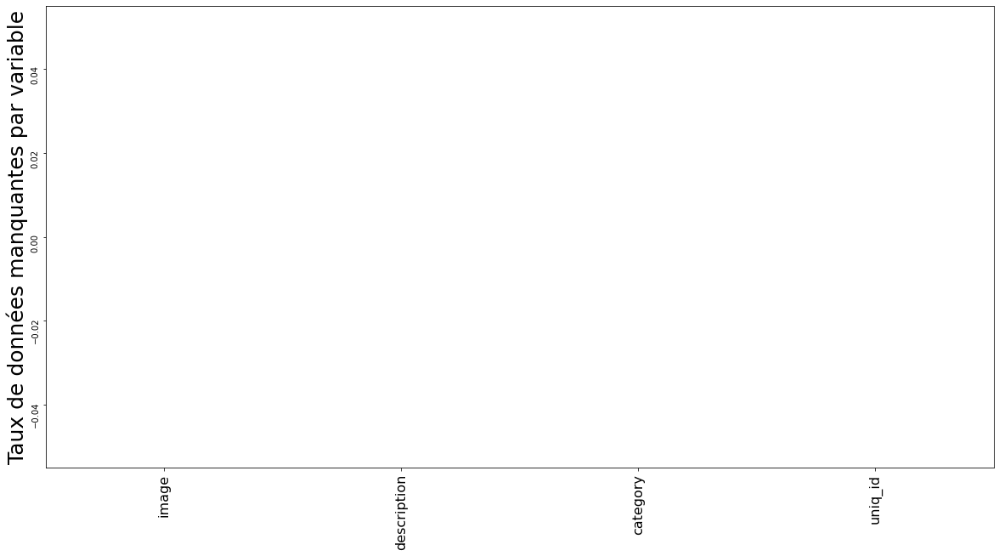

In [ ]:
missing_rate.sort_values(ascending=False).plot.bar(color='gold')

# Title
plt.ylabel('Taux de données manquantes par variable', size=25)
# plt.title()

# Size of figure
plt.rcParams['figure.figsize'] = (20,10)

# Size of xlabels
plt.xticks(size=16)

# Rotation at 90° of xticks
plt.yticks(rotation=90)

plt.show()

In [ ]:
# Filling rate per column
filling_rate = 1 - missing_rate

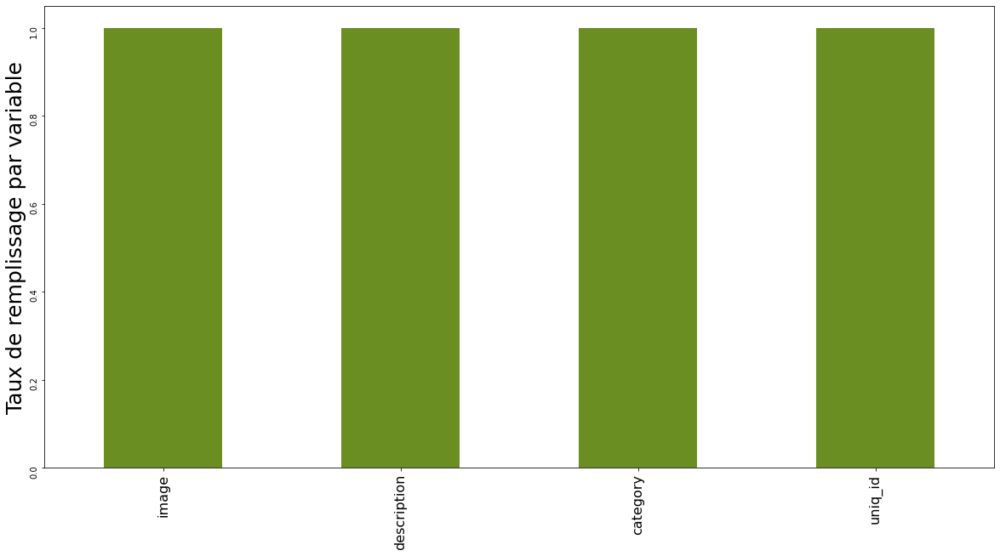

In [ ]:
filling_rate.sort_values(ascending=False).plot.bar(color='olivedrab')

# Title
plt.ylabel('Taux de remplissage par variable', size=25)
# plt.title()

# Size of figure
plt.rcParams['figure.figsize'] = (20,10)

# Size of xlabels
plt.xticks(size=16)

# Rotation at 90° of xticks
plt.yticks(rotation=90)

plt.show()

In [ ]:
df.sample(5)

,uniq_id,category,description,image
955,1738ddb8f47f11ff0cb96fe6cad302c2,Home Decor & Festive Needs,"Buy Digilight 400 inch Red, Yellow Rice Lights...",1738ddb8f47f11ff0cb96fe6cad302c2.jpg
828,952a100cf3a5bdf2d655e9cdca0e9dd5,Computers,Casotec Lightning 272017A USB USB Cable (Purpl...,952a100cf3a5bdf2d655e9cdca0e9dd5.jpg
281,db3e2eeb4fe90d4755f2911d661eae95,Home Furnishing,Bhavya Velvet Sofa Cover (Grey Pack of 10) Pri...,db3e2eeb4fe90d4755f2911d661eae95.jpg
374,df11d370920e09a2985e574ffd9b0ff1,Beauty and Personal Care,"Flipkart.com: Buy Addiction Rio,Hawaii Combo S...",df11d370920e09a2985e574ffd9b0ff1.jpg
450,95feec21a9d076cff084159d61bf9b8e,Baby Care,Specifications of Upside Down Sleeveless Appli...,95feec21a9d076cff084159d61bf9b8e.jpg


In [ ]:
df['category'].value_counts()

Computers                      150
Home Furnishing                150
Baby Care                      150
Home Decor & Festive Needs     150
Watches                        150
Kitchen & Dining               150
Beauty and Personal Care       150
Name: category, dtype: int64

In [ ]:
df.shape

(1050, 4)

## Recherche des doublons

In [ ]:
# Print duplicates for column 'uniq_id'
df[df.duplicated(['uniq_id'], keep=False)]

,uniq_id,category,description,image


In [ ]:
# Print duplicates for column 'description'
df[df.duplicated(['description'], keep=False)]

,uniq_id,category,description,image


In [ ]:
# Print duplicates for column 'image'
df[df.duplicated(['image'], keep=False)]

,uniq_id,category,description,image


## Sauvegarder les données

In [ ]:
# Pickling : writing
with open('df_flipkart_final.pkl', 'wb') as pickle_file:
    pickle.dump(df_flipkart_final, pickle_file)

In [ ]:
files.download('df_flipkart_final.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


# Fonctions servant à la modélisation par clustering



In [3]:
# Define seaborn parameters
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context("notebook", font_scale=1.5,
                rc={"lines.linewidth": 2.5})
RS = 123

In [4]:
"""Determining the optimal number of clusters with the elbow method.

We calculate the sum of square distances
for each possible number of clusters.
"""


range_k = range(2, 20)


def calculate_MiniBatchKMeans(Scaled_Data, range_k, n_init=15):
    sum_of_sq_dist = {}
    for k in range_k:
        km = MiniBatchKMeans(n_clusters=k, init='k-means++',
                    max_iter=1000, n_init=n_init)
        km = km.fit(Scaled_Data)
        sum_of_sq_dist[k] = km.inertia_

    # Plot the graph
    # for the sum of square distance values and number of clusters
    sns.pointplot(x=list(sum_of_sq_dist.keys()),
                  y=list(sum_of_sq_dist.values()))
    plt.xlabel('Nombre de clusters (k)')
    plt.ylabel('Somme des distances au carré')
    plt.title('Détermination du k optimal par la méthode du coude')
    plt.show()

In [5]:
"""Calculating the silhouette score for various clusterings.

We calculate the average silhouette score for various numbers of clusters:
by fixing a range_n_clusters to study.
We visualise the silhouette plot for the various clustering possibilities.
We visualise the clustered data.
"""


range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]


def calculate_silhouette_score(range_n_clusters, Scaled_Data, n_init=30):

    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1
        # but in this example all lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space
        # between silhouette plots of individual clusters,
        # to demarcate them clearly.
        ax1.set_ylim([0, len(Scaled_Data) + (n_clusters+1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = MiniBatchKMeans(n_clusters=n_clusters,
                           n_init=n_init, random_state=10)
        cluster_labels = clusterer.fit_predict(Scaled_Data)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation
        # of the formed clusters
        silhouette_avg = silhouette_score(Scaled_Data, cluster_labels)
        print('Pour n_clusters =', n_clusters,
              ', le silhouette_score moyen est :', silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(Scaled_Data,
                                                      cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i)/n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color,
                              alpha=0.7)

            # Label the silhouette plots with their cluster numbers
            # and center it at the middle
            ax1.text(-0.05, y_lower + 0.5*size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title('Tracé des silhouettes pour les différents clusters')
        ax1.set_xlabel('Valeurs des coefficient de silhouette')
        ax1.set_ylabel('Label du cluster')

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color='red', linestyle='--')

        ax1.set_yticks([])  # Clear the yaxis labels/ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float)/n_clusters)
        ax2.scatter(Scaled_Data[:, 0], Scaled_Data[:, 1], #Scaled_Data.iloc
                    marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax2.set_title('Visualisation du clustering des données')
        ax2.set_xlabel('Espace objet pour la 1ère variable')
        ax2.set_ylabel('Espace objet pour la 2nde variable')

        plt.suptitle(('Analyse de silhouette avec un clustering par la '
                      'méthode des KMeans avec n_clusters = %d' % n_clusters),
                     fontsize=14, fontweight='bold')

In [6]:
"""We create a function to perform the clustering"""


def clustering(Scaled_Data, df, n_clusters):
    # Perform K-Mean Clustering or build the K-Means clustering model
    MiniBatchKMeans_clust = MiniBatchKMeans(n_clusters=n_clusters,
                                            init='k-means++', 
                                            max_iter=1000)
    MiniBatchKMeans_clust.fit(Scaled_Data)

    # Find the clusters for the observation given in the dataset
    df['cluster'] = MiniBatchKMeans_clust.labels_
    return df

In [7]:
"""Utility function to visualize the outputs of PCA and t-SNE"""


def tnse_visualisation(x, colors):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(colors))
    palette = np.array(sns.color_palette("hls", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40, c=palette[colors.astype(np.int)])
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('off')
    ax.axis('tight')


    # add the labels for each digit corresponding to the label
    txts = []

    for i in range(num_classes):

        # Position of each label at median of data points.

        xtext, ytext = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xtext, ytext, str(i), fontsize=24)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)

    return f, ax, sc, txts

# Modélisation à partir du Texte : Méthode de vectorisation Tfidf et BOW

In [11]:
# Unpickling : reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 6/df_flipkart_final.pkl', 'rb') as pickle_file:
    df_flipkart_final = pickle.load(pickle_file)

In [12]:
df = df_flipkart_final.copy()

In [13]:
df.sample(5)

,uniq_id,category,description,image
115,8e8f5dc78f80eff3c77a9714303f59d2,Computers,Filink 310 Black Toner (Black)\r\n ...,8e8f5dc78f80eff3c77a9714303f59d2.jpg
182,3c4ca34c50a5437a1bcc42b72fc1351f,Kitchen & Dining,Printland PMR1902 Ceramic Mug (350 ml)\r\n ...,3c4ca34c50a5437a1bcc42b72fc1351f.jpg
244,0c4718ae90f2889b7021a99ee1cc106c,Kitchen & Dining,"Bergner Kadhai NA L (Aluminium, Non-stick)\r\n...",0c4718ae90f2889b7021a99ee1cc106c.jpg
197,e3c741a05c82c54343b94ed8c1292e2a,Kitchen & Dining,Sam Rolling Pizza Cutter (Steel Pack of 1)\r\n...,e3c741a05c82c54343b94ed8c1292e2a.jpg
336,6634de7b39a5b0658c74ab098450096d,Computers,Buy D-Link DIR-816 Wireless AC750 Dual Band Ro...,6634de7b39a5b0658c74ab098450096d.jpg


In [ ]:
df.shape

(1050, 4)

## Exploration du texte

In [ ]:
# Test
df.description.loc[971]

'Key Features of Sparklings Cotton Geometric Double Bedsheet Best Fit For:-Large Size Double Bed(6.5 ft X 6 ft) Thread Count:160 TC Package Content:1 Double Bedsheet With 2 Pillow Cover,Sparklings Cotton Geometric Double Bedsheet (double bedsheet with pillow covers, Multicolor) Price: Rs. 539 There are days when you don’t want to socialise, and just curl up on your bed, and read, or watch your favourite TV show. For those days, you can jazz up your bedroom décor, by spreading this double bedsheet from SPARKLINGS to pep up your mood. Print that you will Love The blend of abstract and floral prints gives this bedsheet an appealing look. Cotton You wouldn’t want to leave your bedroom anymore, as the bedsheet and two pillow covers are made of cotton to help you relax your body and mind as soon as you hit the bed.,Specifications of Sparklings Cotton Geometric Double Bedsheet (double bedsheet with pillow covers, Multicolor) General Brand Sparklings Machine Washable Yes Type Flat Material Cot

In [ ]:
df.description.loc[67]

'Key Features of Prime Printed 4 Seater Table Cover Length 60 inch/152 cm Width 40 inch/101 cm,Prime Printed 4 Seater Table Cover (Multicolor, PVC) Price: Rs. 499 Prime Center Table Cover Printed 4 Seater,Specifications of Prime Printed 4 Seater Table Cover (Multicolor, PVC) In The Box Number of Contents in Sales Package Pack of 1 General Brand Prime Type Table Cover Model Name 0.281 Material PVC Model ID 281 Color Multicolor Dimensions Weight 250 g Length 60 inch / 152 cm Width 40 inch / 101 cm Seating Capacity 4 Seater'

In [ ]:
# contain('rs')
df.description.str.contains('rs', regex=False)

0        True
1       False
2        True
3       False
4       False
        ...  
1045     True
1046     True
1047    False
1048    False
1049    False
Name: description, Length: 1050, dtype: bool

In [ ]:
df.description.loc[0]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [ ]:
df.description.loc[2]

'Key Features of Eurospa Cotton Terry Face Towel Set Size: small Height: 9 inch GSM: 360,Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Price: Rs. 299 Eurospa brings to you an exclusively designed, 100% soft cotton towels of export quality. All our products have soft texture that takes care of your skin and gives you that enriched feeling you deserve. Eurospa has been exporting its bath towels to lot of renowned brands for last 10 years and is famous for its fine prints, absorbency, softness and durability. NOTE: Our product is 100% cotton, so it is susceptible to shrinkage. Product color may vary from the picture. Size may vary by ±3% WASH CARE: Wash in cold Water, Do not Iron, Do not Bleach, Flat dry, Wash before first use. SIZE- FACE TOWEL - 23 cms X 23 cms.,Specifications of Eurospa Cotton Terry Face Towel Set (20 PIECE FACE TOWEL SET, Assorted) Bath Towel Features Material Cotton Terry Design SHUVAM General Brand Eurospa GSM 360 Type Face Towel Set Model N

In [ ]:
df.description.loc[1045]

'Oren Empower Extra Large Self Adhesive Sticker (Pack of 2)\r\n                         Price: Rs. 999\r\n\t\t\t\t\r\n\t\t\tDouble sticker can be used for the big walls. Two pieces is there that can be arranged alternatively or reflectively. This will d�cor the wall like 3d look. Tree with the green shaded leaves will give the sharp feature of the greenery. Reusable i.e. Can be used again after applied once. Simple remove and re-use the sticker on same or another wall with a different idea\r\n\r\nHow to install?\r\n\r\n1) The surface you wish to attach your decal must be clean \r\nand free from dust, grease or any other contamination.\r\n \r\n2) Simply peel those pre-cut pieces of wall stickers off from \r\nbacking paper and apply them on the desired area.\r\nNOTE: \r\n1. Freshly painted or lacquered \r\nsurfaces must be allowed to completely cure before the decal is applied. We \r\nrecommend waiting for minimum of 2-3 weeks. 2. \r\nWe discourage installation on certain surfaces such a

In [ ]:
df.description.loc[1046]

'Wallmantra Large Vinyl Sticker Sticker (Pack of 1)\r\n                         Price: Rs. 1,896\r\n\t\t\t\t\r\n\t\t\tBring home this exclusive Piece of Wall Art to give your home a refreshing look it deserves !\r\nWall Decals are the latest trend, sweeping the world of interior design, as a quick and easy way to personalise and transform your home. We at Wallmantra use only the highest quality premium self-adhesive vinyl for our products to ensure you receive the best quality product.\r\nThe sizes are in inches (Width x Height), rounded to the nearest inch. The size of the product is the final size that will be up on the walls . \r\nThese are very easy to apply and remove. You can apply these yourself. We send ready to apply Decal/Sticker with 2 practice items with instruction manual. You can also see the how to apply video.\r\nThese are not re-usable.\r\n Contact Wallmantra for more options\r\nBring home this exclusive Piece of Wall Art to give your home a refreshing look it deserves

In [ ]:
df.description.loc[1049]

'Buy Uberlyfe Large Vinyl Sticker for Rs.595 online. Uberlyfe Large Vinyl Sticker at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.'

##### Observation : rs = roupie indienne

In [ ]:
# contain('day')
df.description.str.contains('watch', regex=False)

0       False
1       False
2       False
3       False
4       False
        ...  
1045    False
1046    False
1047    False
1048    False
1049    False
Name: description, Length: 1050, dtype: bool

In [ ]:
df.description.loc[0]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

## Traitement du texte avec NLTK

In [14]:
"Transform the contractions in the text to drop any sign of punctuation"


def decontracted(phrase):
    # specific
    phrase = re.sub(r"won\'t", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [15]:
# Download the necessary modules of nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Define a tokenizer
tokenizer = nltk.RegexpTokenizer(r"\w+")
# Define a stemmer
stemmer = PorterStemmer()
# Define the type of stop words
stop_words = stopwords.words('english')
# Define a lemmatizer
wln = WordNetLemmatizer()

# Transform the text to lower cases
df['description'] = df['description'].apply(lambda x : x.lower())
# Replace contractions in the text
df['description'] = df['description'].apply(lambda x : decontracted(x))
# Tokenise the text
df['description'] = df['description'].apply(lambda x : tokenizer.tokenize(x))
# Drop stopwords in the text 
df['description'] = df['description'].apply(lambda x : [word for word in x if word not in stop_words])
# Extract stems of words
df['description'] = df['description'].apply(lambda x : [stemmer.stem(word) for word in x])
# Lemmatize the words
df['description'] = df['description'].apply(lambda x : [wln.lemmatize(word) for word in x])

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [16]:
# Test
df['description'].loc[971]

['key',
 'featur',
 'sparkl',
 'cotton',
 'geometr',
 'doubl',
 'bedsheet',
 'best',
 'fit',
 'larg',
 'size',
 'doubl',
 'bed',
 '6',
 '5',
 'ft',
 'x',
 '6',
 'ft',
 'thread',
 'count',
 '160',
 'tc',
 'packag',
 'content',
 '1',
 'doubl',
 'bedsheet',
 '2',
 'pillow',
 'cover',
 'sparkl',
 'cotton',
 'geometr',
 'doubl',
 'bedsheet',
 'doubl',
 'bedsheet',
 'pillow',
 'cover',
 'multicolor',
 'price',
 'r',
 '539',
 'day',
 'want',
 'socialis',
 'curl',
 'bed',
 'read',
 'watch',
 'favourit',
 'tv',
 'show',
 'day',
 'jazz',
 'bedroom',
 'décor',
 'spread',
 'doubl',
 'bedsheet',
 'sparkl',
 'pep',
 'mood',
 'print',
 'love',
 'blend',
 'abstract',
 'floral',
 'print',
 'give',
 'bedsheet',
 'appeal',
 'look',
 'cotton',
 'want',
 'leav',
 'bedroom',
 'anymor',
 'bedsheet',
 'two',
 'pillow',
 'cover',
 'made',
 'cotton',
 'help',
 'relax',
 'bodi',
 'mind',
 'soon',
 'hit',
 'bed',
 'specif',
 'sparkl',
 'cotton',
 'geometr',
 'doubl',
 'bedsheet',
 'doubl',
 'bedsheet',
 'pillow',

In [17]:
# Second step : delete the numbers
df['description'] = df['description'].apply(
    lambda x : [word for word in x if not any(map(str.isdigit, word))])

In [18]:
# Test
df.description.loc[971]

['key',
 'featur',
 'sparkl',
 'cotton',
 'geometr',
 'doubl',
 'bedsheet',
 'best',
 'fit',
 'larg',
 'size',
 'doubl',
 'bed',
 'ft',
 'x',
 'ft',
 'thread',
 'count',
 'tc',
 'packag',
 'content',
 'doubl',
 'bedsheet',
 'pillow',
 'cover',
 'sparkl',
 'cotton',
 'geometr',
 'doubl',
 'bedsheet',
 'doubl',
 'bedsheet',
 'pillow',
 'cover',
 'multicolor',
 'price',
 'r',
 'day',
 'want',
 'socialis',
 'curl',
 'bed',
 'read',
 'watch',
 'favourit',
 'tv',
 'show',
 'day',
 'jazz',
 'bedroom',
 'décor',
 'spread',
 'doubl',
 'bedsheet',
 'sparkl',
 'pep',
 'mood',
 'print',
 'love',
 'blend',
 'abstract',
 'floral',
 'print',
 'give',
 'bedsheet',
 'appeal',
 'look',
 'cotton',
 'want',
 'leav',
 'bedroom',
 'anymor',
 'bedsheet',
 'two',
 'pillow',
 'cover',
 'made',
 'cotton',
 'help',
 'relax',
 'bodi',
 'mind',
 'soon',
 'hit',
 'bed',
 'specif',
 'sparkl',
 'cotton',
 'geometr',
 'doubl',
 'bedsheet',
 'doubl',
 'bedsheet',
 'pillow',
 'cover',
 'multicolor',
 'gener',
 'brand',


In [19]:
"""Calculate the number of times a word occur in the text"""


def word_occurence_calculation(df, column):
    
    global common_words

    words_list = {}

    for row in df[column]:
        for word in row:
            words_list[word] = words_list.get(word, 0) + 1
    
    common_words = Counter(words_list).most_common()
    
    return common_words

In [20]:
# Calculate the number of occurences of each word
word_occurence_calculation(df, 'description')    

[('r', 927),
 ('product', 870),
 ('free', 618),
 ('buy', 581),
 ('replac', 570),
 ('ship', 569),
 ('cm', 568),
 ('deliveri', 567),
 ('genuin', 564),
 ('cash', 564),
 ('price', 561),
 ('day', 553),
 ('flipkart', 481),
 ('com', 473),
 ('guarante', 473),
 ('mug', 457),
 ('featur', 408),
 ('design', 401),
 ('onlin', 396),
 ('specif', 380),
 ('color', 380),
 ('watch', 360),
 ('pack', 342),
 ('type', 325),
 ('set', 323),
 ('babi', 321),
 ('materi', 313),
 ('cotton', 299),
 ('box', 297),
 ('gener', 292),
 ('print', 290),
 ('packag', 278),
 ('sale', 262),
 ('analog', 262),
 ('number', 254),
 ('warranti', 252),
 ('brand', 247),
 ('detail', 246),
 ('qualiti', 245),
 ('girl', 242),
 ('laptop', 234),
 ('inch', 231),
 ('best', 230),
 ('model', 226),
 ('key', 224),
 ('gift', 220),
 ('ceram', 219),
 ('fabric', 211),
 ('cover', 209),
 ('showpiec', 207),
 ('use', 206),
 ('size', 203),
 ('perfect', 190),
 ('made', 189),
 ('great', 189),
 ('boy', 184),
 ('india', 180),
 ('dimens', 177),
 ('men', 177),
 (

In [21]:
# Transform list to dictionnary 
dict_common_words = dict(common_words)

print(dict_common_words)

{'r': 927, 'product': 870, 'free': 618, 'buy': 581, 'replac': 570, 'ship': 569, 'cm': 568, 'deliveri': 567, 'genuin': 564, 'cash': 564, 'price': 561, 'day': 553, 'flipkart': 481, 'com': 473, 'guarante': 473, 'mug': 457, 'featur': 408, 'design': 401, 'onlin': 396, 'specif': 380, 'color': 380, 'watch': 360, 'pack': 342, 'type': 325, 'set': 323, 'babi': 321, 'materi': 313, 'cotton': 299, 'box': 297, 'gener': 292, 'print': 290, 'packag': 278, 'sale': 262, 'analog': 262, 'number': 254, 'warranti': 252, 'brand': 247, 'detail': 246, 'qualiti': 245, 'girl': 242, 'laptop': 234, 'inch': 231, 'best': 230, 'model': 226, 'key': 224, 'gift': 220, 'ceram': 219, 'fabric': 211, 'cover': 209, 'showpiec': 207, 'use': 206, 'size': 203, 'perfect': 190, 'made': 189, 'great': 189, 'boy': 184, 'india': 180, 'dimens': 177, 'men': 177, 'skin': 175, 'usb': 174, 'home': 170, 'ideal': 167, 'coffe': 164, 'multicolor': 160, 'content': 159, 'one': 159, 'light': 154, 'make': 153, 'beauti': 153, 'combo': 148, 'water': 

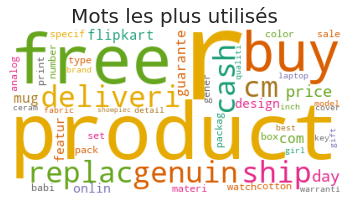

In [22]:
"""Create a map of the most used words"""


wc = WordCloud(#stopwords=stop_words, 
               background_color="white",
               max_words=50, 
               colormap="Dark2",
               max_font_size=150, 
               random_state=42).generate_from_frequencies(dict_common_words)

plt.axis("off")
plt.title('Mots les plus utilisés', size=20)
plt.imshow(wc)


#### Retransformer les listes de mots en strings



In [23]:
# Last step : transform list to strings
df['description'] = df['description'].apply(lambda x : ' '.join([str(elem) for elem in x])) 

In [24]:
# Test
df['description'].loc[971]

'key featur sparkl cotton geometr doubl bedsheet best fit larg size doubl bed ft x ft thread count tc packag content doubl bedsheet pillow cover sparkl cotton geometr doubl bedsheet doubl bedsheet pillow cover multicolor price r day want socialis curl bed read watch favourit tv show day jazz bedroom décor spread doubl bedsheet sparkl pep mood print love blend abstract floral print give bedsheet appeal look cotton want leav bedroom anymor bedsheet two pillow cover made cotton help relax bodi mind soon hit bed specif sparkl cotton geometr doubl bedsheet doubl bedsheet pillow cover multicolor gener brand sparkl machin washabl ye type flat materi cotton model name ideal boy girl model id color multicolor size doubl fabric care first wash separ dark color wash separ cold machin wash use strong deterg bleach tumbl dri iron print soak long time dri shade dimens flat sheet width inch cm fit sheet width cm pillow cover width inch cm pillow cover length inch cm weight g fit sheet depth cm fit sh

#### Faire un word cloud

In [25]:
# Make a word cloud
wc = WordCloud(stopwords=stop_words, background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42, max_words=50)

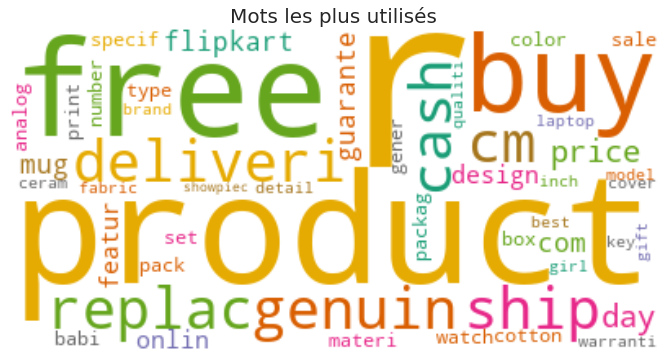

In [26]:
# Reset the output dimensions
plt.rcParams['figure.figsize'] = [16, 6]

wc.generate_from_frequencies(dict_common_words)

plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title('Mots les plus utilisés', size=20)

plt.show()

In [27]:
df['description'].loc[1049]

'buy uberlyf larg vinyl sticker r onlin uberlyf larg vinyl sticker best price free ship cash deliveri genuin product day replac guarante'

### Vectoriser

In [28]:
# Define a vectorizer to transform the text to vectors
#max_df=0.95 lorsqu'on applique filtrage supplémentaire du texte pour la modélisation du texte avec les images
vectorizer = TfidfVectorizer(stop_words='english', min_df=29, max_df=0.95, ngram_range=(1, 2))
# Apply the vectorizer to get the vectors
vectors = vectorizer.fit_transform(df['description'])
# Extract the feature names
feature_names = vectorizer.get_feature_names()
# Get a dense matrix with the vectors
dense = vectors.todense()
# Transform into a list
dense_list = dense.tolist()
# Create a dataframe with the vectors and the features names
df_description = pd.DataFrame(dense_list, columns=feature_names) 

In [29]:
df['description'].iloc[67]

'key featur prime print seater tabl cover length inch cm width inch cm prime print seater tabl cover multicolor pvc price r prime center tabl cover print seater specif prime print seater tabl cover multicolor pvc box number content sale packag pack gener brand prime type tabl cover model name materi pvc model id color multicolor dimens weight g length inch cm width inch cm seat capac seater'

In [30]:
# Test
df_description.brand.iloc[67]

0.06568529540199548

In [31]:
df_description.sample(5)

,abstract,add,addit,addit featur,analog,analog watch,babi,babi boy,babi girl,bath,batteri,beauti,best,best price,black,bleach,blue,bodi,box,box number,box sale,boy,brand,brass,bring,brown,buy,capac,care,case,cash,cash deliveri,casual,ceram,ceram mug,clasp,clean,cm,cm best,cm box,...,sleev,soft,special,specif,stainless,stainless steel,steel,strap,style,style code,stylish,suitabl,summari,time,towel,trait,type,usb,use,vari,warranti,warranti summari,warranti warranti,wash,watch,watch men,watch woman,water,water resist,wear,weight,white,width,width cm,width inch,woman,woman buy,woman onlin,ye,year
85,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.113781,0.0,0.092268,0.0,0.0,0.000000,0.0,0.0,0.0,0.060634,0.090242,0.000000,0.0,0.064599,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.10598,0.200349,0.0,0.00000,...,0.0,0.0,0.0,0.053599,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.062061,0.0,0.081793,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.083466,0.097318,0.0,0.000000,0.0,0.083715,0.099569,0.0,0.0,0.0,0.0,0.182468,0.0
738,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.055197,0.000000,0.082446,0.0,0.058807,0.604393,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00000,0.425559,0.0,0.09881,...,0.0,0.0,0.0,0.048793,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.056496,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.159273,0.0,0.152415,0.181281,0.0,0.0,0.0,0.0,0.000000,0.0
753,0.405213,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.356655,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.156161,0.0,0.0,0.0,0.158213,0.158213,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.00000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
687,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.144629,0.0,0.0,0.0,0.146529,0.146529,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.00000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
456,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.164510,0.0,0.0,0.0,0.166671,0.166671,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0,0.00000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0


In [32]:
df_description.shape

(1050, 254)

In [33]:
df_description.columns

Index(['abstract', 'add', 'addit', 'addit featur', 'analog', 'analog watch',
       'babi', 'babi boy', 'babi girl', 'bath',
       ...
       'weight', 'white', 'width', 'width cm', 'width inch', 'woman',
       'woman buy', 'woman onlin', 'ye', 'year'],
      dtype='object', length=254)

In [34]:
# Pickling : writing
with open('df_description.pkl', 'wb') as pickle_file:
    pickle.dump(df_description, pickle_file)

In [35]:
files.download('df_description.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Version avec Traitement Supplémentaire pour la modélisation du texte avec les images 

In [36]:
# Download the necessary modules of nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Define a tokenizer
tokenizer = nltk.RegexpTokenizer(r"\w+")
# Define a stemmer
stemmer = PorterStemmer()
# Define the type of stop words
stop_words = stopwords.words('english')
# Define a lemmatizer
wln = WordNetLemmatizer()

# Transform the text to lower cases
df['description'] = df['description'].apply(lambda x : x.lower())
# Replace contractions in the text
df['description'] = df['description'].apply(lambda x : decontracted(x))
# Tokenise the text
df['description'] = df['description'].apply(lambda x : tokenizer.tokenize(x))
# Drop stopwords in the text 
df['description'] = df['description'].apply(lambda x : [word for word in x if word not in stop_words])
# Extract stems of words
df['description'] = df['description'].apply(lambda x : [stemmer.stem(word) for word in x])
# Lemmatize the words
df['description'] = df['description'].apply(lambda x : [wln.lemmatize(word) for word in x])

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [37]:
# Second step : delete the numbers
df['description'] = df['description'].apply(
    lambda x : [word for word in x if not any(map(str.isdigit, word))])

In [38]:
# Calculate the number of occurences of each word
word_occurence_calculation(df, 'description')    

[('r', 927),
 ('product', 870),
 ('free', 618),
 ('buy', 581),
 ('replac', 570),
 ('ship', 569),
 ('cm', 568),
 ('deliveri', 567),
 ('genuin', 564),
 ('cash', 564),
 ('price', 561),
 ('day', 553),
 ('flipkart', 481),
 ('com', 473),
 ('guarant', 473),
 ('mug', 457),
 ('featur', 408),
 ('design', 401),
 ('onlin', 396),
 ('specif', 380),
 ('color', 380),
 ('watch', 360),
 ('pack', 342),
 ('type', 325),
 ('set', 323),
 ('babi', 321),
 ('materi', 313),
 ('cotton', 299),
 ('box', 297),
 ('gener', 292),
 ('print', 290),
 ('packag', 278),
 ('sale', 262),
 ('analog', 262),
 ('number', 254),
 ('warranti', 252),
 ('brand', 247),
 ('detail', 246),
 ('qualiti', 245),
 ('girl', 242),
 ('laptop', 234),
 ('inch', 231),
 ('best', 230),
 ('model', 226),
 ('key', 224),
 ('gift', 220),
 ('ceram', 219),
 ('fabric', 211),
 ('cover', 209),
 ('showpiec', 207),
 ('use', 206),
 ('size', 203),
 ('perfect', 190),
 ('made', 189),
 ('great', 189),
 ('boy', 184),
 ('india', 180),
 ('dimen', 177),
 ('men', 177),
 ('s

In [42]:
# Fourth step : create a list with words that are too common and not interesting
too_common_words = ['product',
                    'free',
                    'r',
                    'buy',
                    'replac',
                    'ship',
                    'deliveri',
                    'genuin',
                    'cash',
                    'price',
                    'day',
                    'guarant',
                    'onlin',
                    'cm',
                    'flipkart',
                    'com',
                    ]


In [43]:
# Delete words in the list 
df['description'] = df['description'].apply(
    lambda x : [word for word in x if word not in too_common_words])

In [44]:
# Calculate the number of occurences of each word after a manual filtering 
word_occurence_calculation(df, 'description')

[('mug', 457),
 ('featur', 408),
 ('design', 401),
 ('specif', 380),
 ('color', 380),
 ('watch', 360),
 ('pack', 342),
 ('type', 325),
 ('set', 323),
 ('babi', 321),
 ('materi', 313),
 ('cotton', 299),
 ('box', 297),
 ('gener', 292),
 ('print', 290),
 ('packag', 278),
 ('sale', 262),
 ('analog', 262),
 ('number', 254),
 ('warranti', 252),
 ('brand', 247),
 ('detail', 246),
 ('qualiti', 245),
 ('girl', 242),
 ('laptop', 234),
 ('inch', 231),
 ('best', 230),
 ('model', 226),
 ('key', 224),
 ('gift', 220),
 ('ceram', 219),
 ('fabric', 211),
 ('cover', 209),
 ('showpiec', 207),
 ('use', 206),
 ('size', 203),
 ('perfect', 190),
 ('made', 189),
 ('great', 189),
 ('boy', 184),
 ('india', 180),
 ('dimen', 177),
 ('men', 177),
 ('skin', 175),
 ('usb', 174),
 ('home', 170),
 ('ideal', 167),
 ('coff', 164),
 ('multicolor', 160),
 ('beauti', 160),
 ('content', 159),
 ('one', 159),
 ('light', 154),
 ('make', 153),
 ('combo', 148),
 ('water', 146),
 ('power', 144),
 ('love', 141),
 ('woman', 141),
 

In [45]:
# Transform list to dictionnary 
dict_common_words = dict(common_words)

print(dict_common_words)

{'mug': 457, 'featur': 408, 'design': 401, 'specif': 380, 'color': 380, 'watch': 360, 'pack': 342, 'type': 325, 'set': 323, 'babi': 321, 'materi': 313, 'cotton': 299, 'box': 297, 'gener': 292, 'print': 290, 'packag': 278, 'sale': 262, 'analog': 262, 'number': 254, 'warranti': 252, 'brand': 247, 'detail': 246, 'qualiti': 245, 'girl': 242, 'laptop': 234, 'inch': 231, 'best': 230, 'model': 226, 'key': 224, 'gift': 220, 'ceram': 219, 'fabric': 211, 'cover': 209, 'showpiec': 207, 'use': 206, 'size': 203, 'perfect': 190, 'made': 189, 'great': 189, 'boy': 184, 'india': 180, 'dimen': 177, 'men': 177, 'skin': 175, 'usb': 174, 'home': 170, 'ideal': 167, 'coff': 164, 'multicolor': 160, 'beauti': 160, 'content': 159, 'one': 159, 'light': 154, 'make': 153, 'combo': 148, 'water': 146, 'power': 144, 'love': 141, 'woman': 141, 'x': 138, 'discount': 134, 'wash': 133, 'width': 132, 'adapt': 131, 'black': 129, 'give': 127, 'also': 127, 'batteri': 125, 'comfort': 124, 'care': 122, 'blue': 120, 'pattern': 

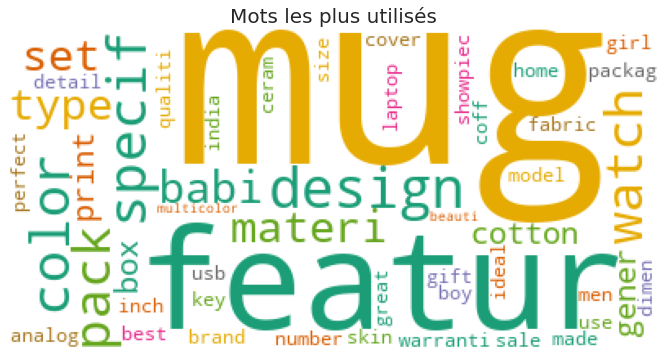

In [46]:
"""Create a map of the most used words"""


wc = WordCloud(#stopwords=stop_words, 
               background_color="white",
               max_words=50, 
               colormap="Dark2",
               max_font_size=150, 
               random_state=42).generate_from_frequencies(dict_common_words)

plt.axis("off")
plt.title('Mots les plus utilisés', size=20)
plt.imshow(wc)


#### Retransformer les listes de mots en strings



In [47]:
# Last step : transform list to strings
df['description'] = df['description'].apply(lambda x : ' '.join([str(elem) for elem in x])) 

In [48]:
# Test
df['description'].loc[971]

'key featur sparkl cotton geometr doubl bedsheet best fit larg size doubl bed ft x ft thread count tc packag content doubl bedsheet pillow cover sparkl cotton geometr doubl bedsheet doubl bedsheet pillow cover multicolor want sociali curl bed read watch favourit tv show jazz bedroom décor spread doubl bedsheet sparkl pep mood print love blend abstract floral print give bedsheet appeal look cotton want leav bedroom anymor bedsheet two pillow cover made cotton help relax bodi mind soon hit bed specif sparkl cotton geometr doubl bedsheet doubl bedsheet pillow cover multicolor gener brand sparkl machin washabl ye type flat materi cotton model name ideal boy girl model id color multicolor size doubl fabric care first wash separ dark color wash separ cold machin wash use strong deterg bleach tumbl dri iron print soak long time dri shade dimen flat sheet width inch fit sheet width pillow cover width inch pillow cover length inch weight g fit sheet depth fit sheet length flat sheet depth flat 

#### Faire un word cloud

In [49]:
# Make a word cloud
wc = WordCloud(stopwords=stop_words, background_color="white", colormap="Dark2",
               max_font_size=150, random_state=42, max_words=50)

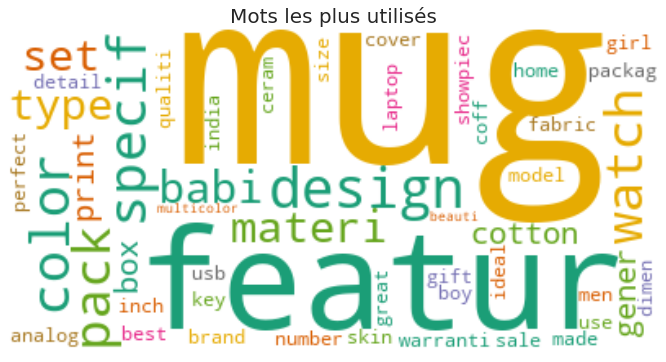

In [50]:
# Reset the output dimensions
plt.rcParams['figure.figsize'] = [16, 6]

wc.generate_from_frequencies(dict_common_words)

plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title('Mots les plus utilisés', size=20)

plt.show()

In [51]:
df['description'].loc[1049]

'uberlyf larg vinyl sticker uberlyf larg vinyl sticker best'

### Vectoriser

In [52]:
# Define a vectorizer to transform the text to vectors
#max_df=0.95 lorsqu'on applique filtrage supplémentaire du texte pour la modélisation du texte avec les images
vectorizer_tttsup = TfidfVectorizer(stop_words='english', min_df=29, max_df=0.95, ngram_range=(1, 2))
# Apply the vectorizer to get the vectors
vectors_tttsup = vectorizer_tttsup.fit_transform(df['description'])
# Extract the feature names
feature_names_tttsup = vectorizer_tttsup.get_feature_names()
# Get a dense matrix with the vectors
dense_tttsup = vectors_tttsup.todense()
# Transform into a list
dense_list_tttsup = dense_tttsup.tolist()
# Create a dataframe with the vectors and the features names
df_description_tttsup = pd.DataFrame(dense_list_tttsup, columns=feature_names_tttsup) 

In [53]:
df['description'].iloc[67]

'key featur prime print seater tabl cover length inch width inch prime print seater tabl cover multicolor pvc prime center tabl cover print seater specif prime print seater tabl cover multicolor pvc box number content sale packag pack gener brand prime type tabl cover model name materi pvc model id color multicolor dimen weight g length inch width inch seat capac seater'

In [54]:
# Test
df_description_tttsup.brand.iloc[67]

0.06795701173920868

In [55]:
df_description_tttsup.sample(5)

,abstract,add,addit,addit featur,analog,analog watch,babi,babi boy,babi girl,bath,batteri,beauti,best,black,bleach,blue,bodi,box,box number,box sale,boy,brand,brass,bring,brown,capac,care,case,casual,ceram,ceram mug,clasp,clean,code,coff,coff mug,color,color multicolor,colour,combo,...,size,skin,sleev,soft,special,specif,stainless,stainless steel,steel,strap,style,style code,stylish,suitabl,summari,time,towel,trait,type,usb,use,vari,warranti,warranti summari,warranti warranti,wash,watch,watch men,watch woman,water,water resist,wear,weight,white,width,width inch,woman,woman india,ye,year
18,0.0,0.0,0.0,0.0,0.371673,0.379231,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.419321,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.353039,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
921,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.165919,0.000000,0.0,0.489301,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.532463,0.0,0.0,0.0,0.0,0.000000,0.0
86,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.260911,0.0,0.000000,0.0,0.173401,0.0,0.259006,0.000000,0.184741,0.0,0.0,0.0,0.306652,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.178086,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.153283,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.354966,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.260911,0.0
1040,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
98,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.470152,0.000000,0.0,0.000000,0.0,0.882585,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0


In [56]:
df_description_tttsup.shape

(1050, 209)

In [57]:
df_description_tttsup.columns

Index(['abstract', 'add', 'addit', 'addit featur', 'analog', 'analog watch',
       'babi', 'babi boy', 'babi girl', 'bath',
       ...
       'water resist', 'wear', 'weight', 'white', 'width', 'width inch',
       'woman', 'woman india', 'ye', 'year'],
      dtype='object', length=209)

In [58]:
# Pickling : writing
with open('df_description_tttsup.pkl', 'wb') as pickle_file:
    pickle.dump(df_description_tttsup, pickle_file)

In [59]:
files.download('df_description_tttsup.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Modélisation du texte

### Version Texte Seul 



In [60]:
text_scaler = StandardScaler()

In [61]:
text_data = text_scaler.fit_transform(df_description)

In [62]:
text_data.shape

(1050, 254)

#### Clustering

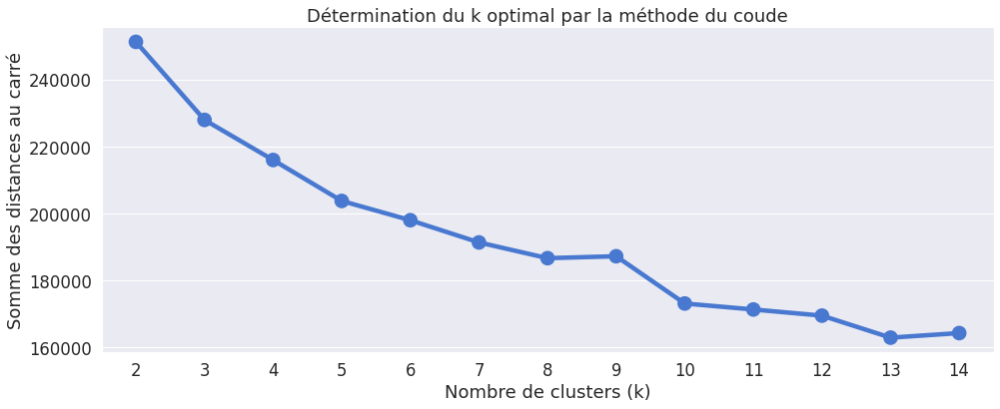

In [63]:
range_k = range(2, 15)

calculate_MiniBatchKMeans(text_data, range_k, n_init=30)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.15609238717141216
Pour n_clusters = 3 , le silhouette_score moyen est : 0.09672760482313428
Pour n_clusters = 4 , le silhouette_score moyen est : 0.11551970278493738
Pour n_clusters = 5 , le silhouette_score moyen est : 0.08999862826276057
Pour n_clusters = 6 , le silhouette_score moyen est : 0.10933482528206241
Pour n_clusters = 7 , le silhouette_score moyen est : 0.12585273639674563
Pour n_clusters = 8 , le silhouette_score moyen est : 0.13903252710756708
Pour n_clusters = 9 , le silhouette_score moyen est : 0.09710509205785732


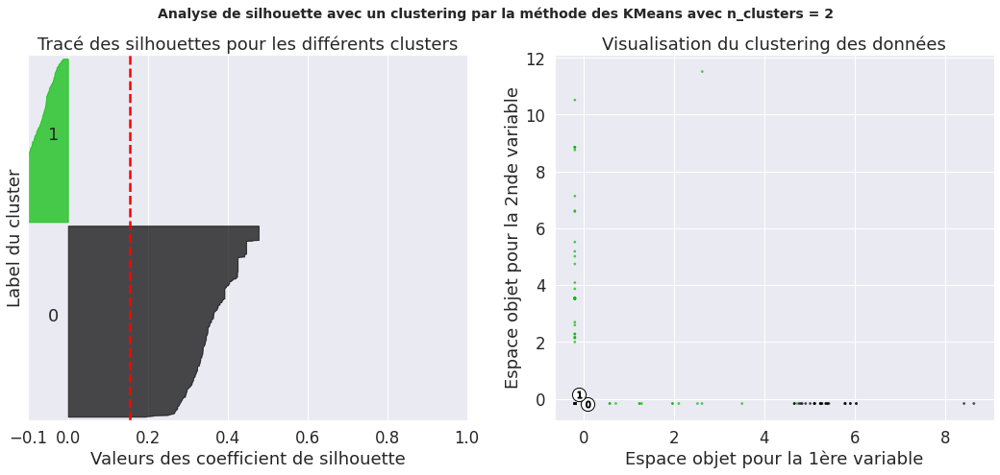

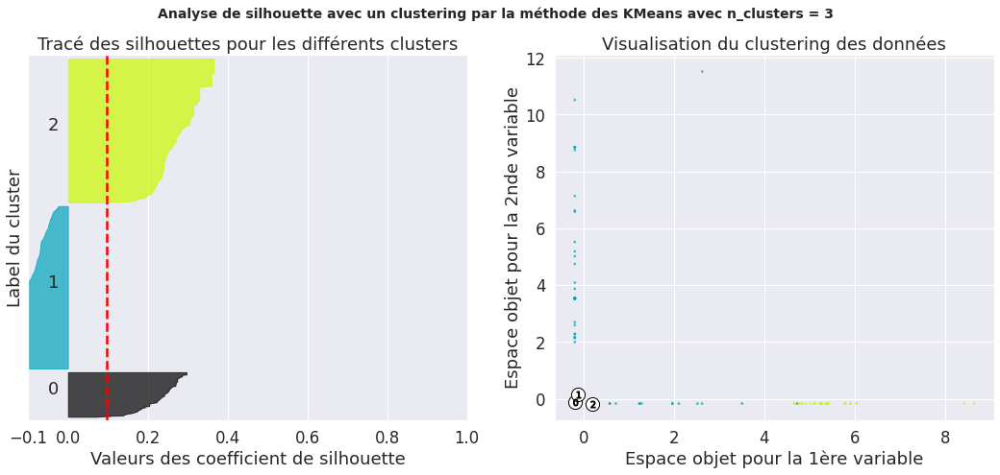

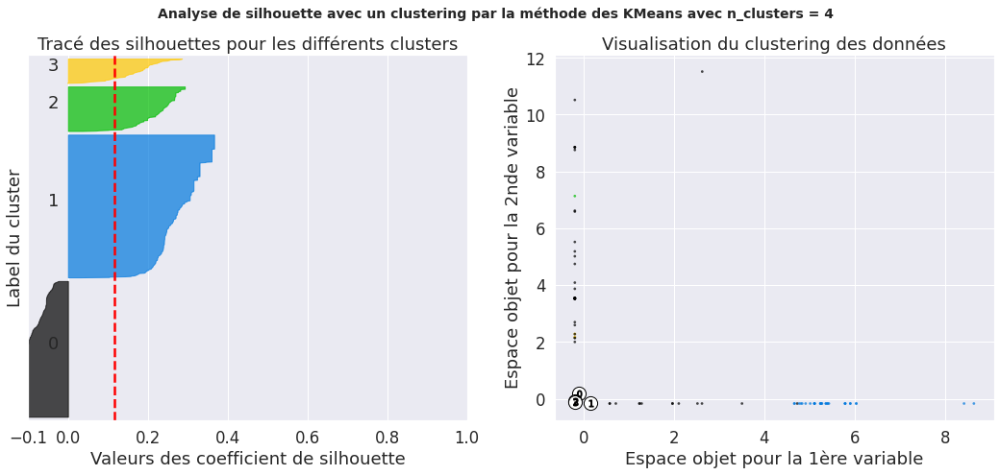

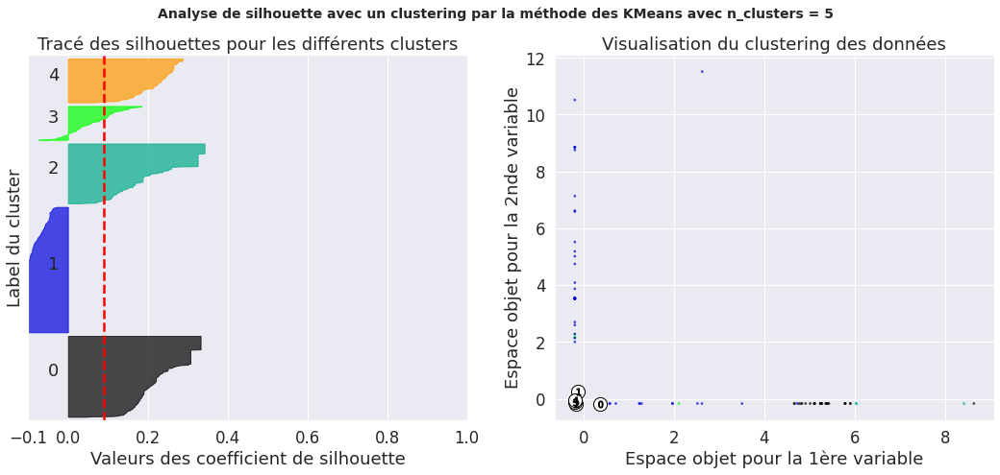

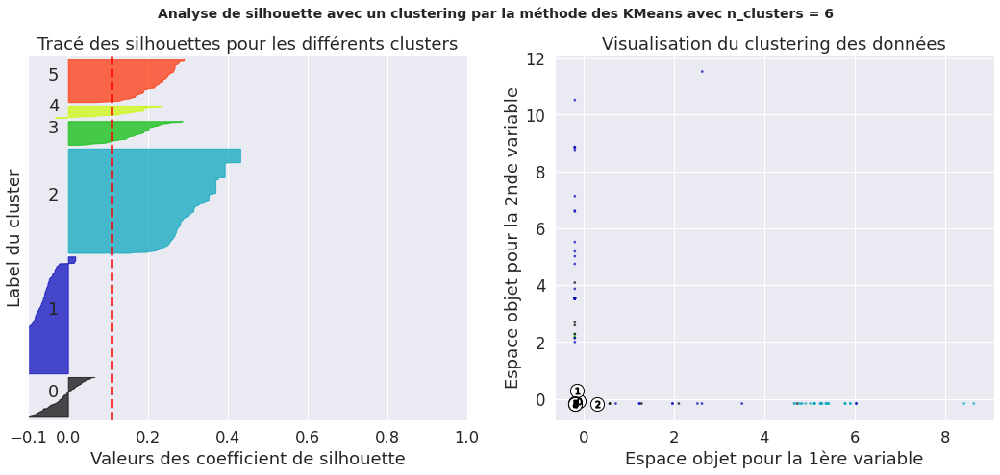

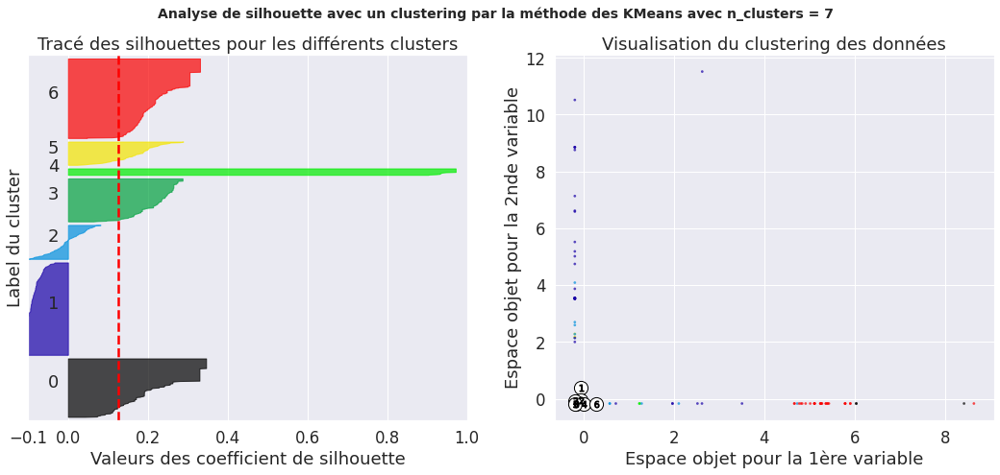

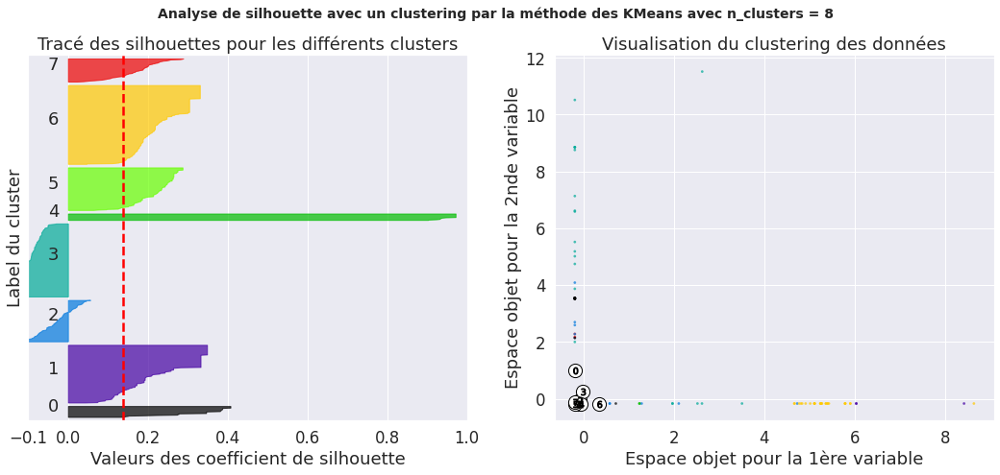

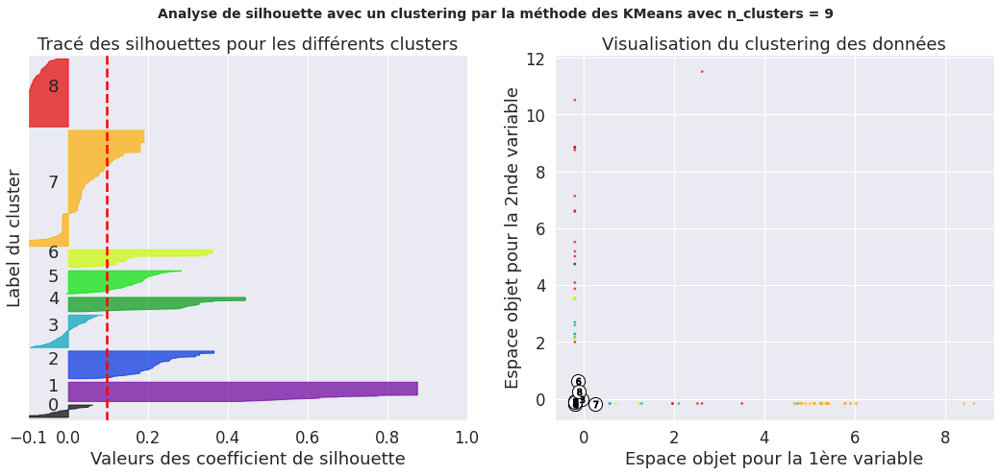

In [64]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9]

calculate_silhouette_score(range_n_clusters, text_data, n_init=30)

In [65]:
clustering(text_data, df, n_clusters=8)
df.head()

,uniq_id,category,description,image,cluster
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,key featur eleg polyest multicolor abstract ey...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,7
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,specif sathiya cotton bath towel bath towel re...,7b72c92c2f6c40268628ec5f14c6d590.jpg,7
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,key featur eurospa cotton terri face towel set...,64d5d4a258243731dc7bbb1eef49ad74.jpg,3
3,d4684dcdc759dd9cdf41504698d737d8,Home Furnishing,key featur santosh royal fashion cotton print ...,d4684dcdc759dd9cdf41504698d737d8.jpg,7
4,6325b6870c54cd47be6ebfbffa620ec7,Home Furnishing,key featur jaipur print cotton floral king siz...,6325b6870c54cd47be6ebfbffa620ec7.jpg,7


In [66]:
df['cluster'].value_counts() 

4    428
3    221
0    134
7    114
5     75
6     36
2     21
1     21
Name: cluster, dtype: int64

In [67]:
# Matrix of confusion
y_true = df['category']
y_pred = df['cluster']

confusion_matrix(y_true, y_pred.values.astype(int).astype(str)) #.values.astype(int).astype(str) ????

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,  24,  34,  75,   1,  16,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,  43, 101,   0,   0,   6,   0,   0,   0,   0,   0,
          0,   0],
       [  0,  11,   0,  41,  93,   0,   0,   5,   0,   0,   0,   0,   0,
       

In [69]:
# Visualisation
fashion_tsne = TSNE(random_state=RS).fit_transform(text_data) 

(<Figure size 576x576 with 1 Axes>,
 [Text(-2.0244522, 47.00125, '0'),
  Text(-7.754211, -23.126547, '1'),
  Text(44.43985, 3.8033118, '2'),
  Text(2.2813356, -2.8404665, '3'),
  Text(6.432127, 3.3089771, '4'),
  Text(-29.248737, -21.477089, '5'),
  Text(28.630438, 7.5799527, '6'),
  Text(-10.797592, -8.406915, '7')])

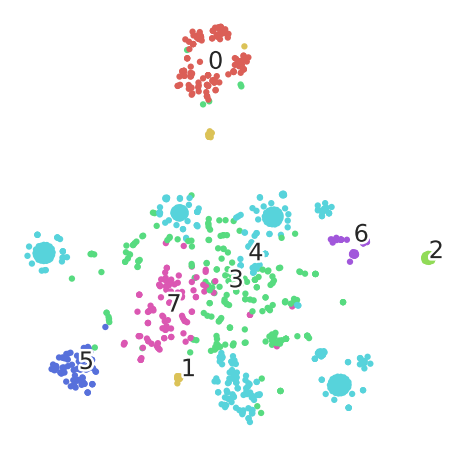

In [70]:
tnse_visualisation(fashion_tsne, df['cluster'])

### Version avec Traitement Supplémentaire


In [78]:
text_scaler_tttsup = StandardScaler()

In [79]:
text_data_tttsup = text_scaler_tttsup.fit_transform(df_description_tttsup)

In [80]:
text_data_tttsup.shape

(1050, 209)

#### Clustering

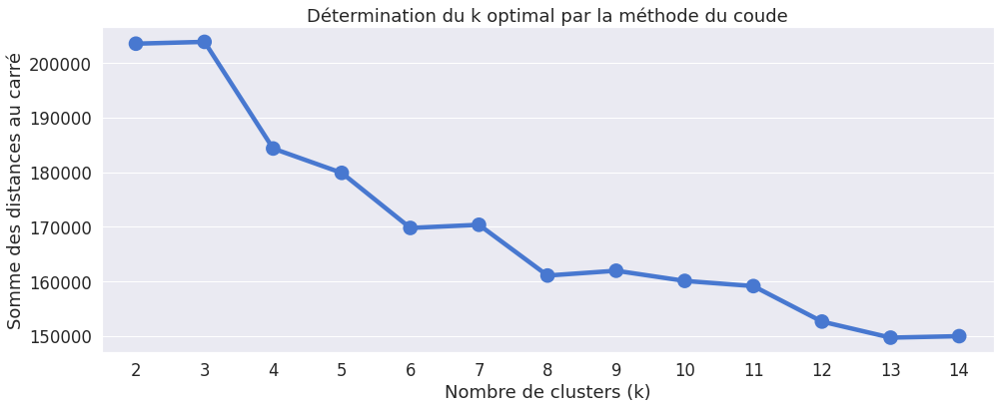

In [81]:
range_k = range(2, 15)

calculate_MiniBatchKMeans(text_data_tttsup, range_k, n_init=30)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.2172294541828653
Pour n_clusters = 3 , le silhouette_score moyen est : 0.0677139606273809
Pour n_clusters = 4 , le silhouette_score moyen est : 0.1292413050803728
Pour n_clusters = 5 , le silhouette_score moyen est : 0.09832614496796561
Pour n_clusters = 6 , le silhouette_score moyen est : 0.12301215303188645
Pour n_clusters = 7 , le silhouette_score moyen est : 0.09957202204819157
Pour n_clusters = 8 , le silhouette_score moyen est : 0.10237813832434897
Pour n_clusters = 9 , le silhouette_score moyen est : 0.1125364662555661


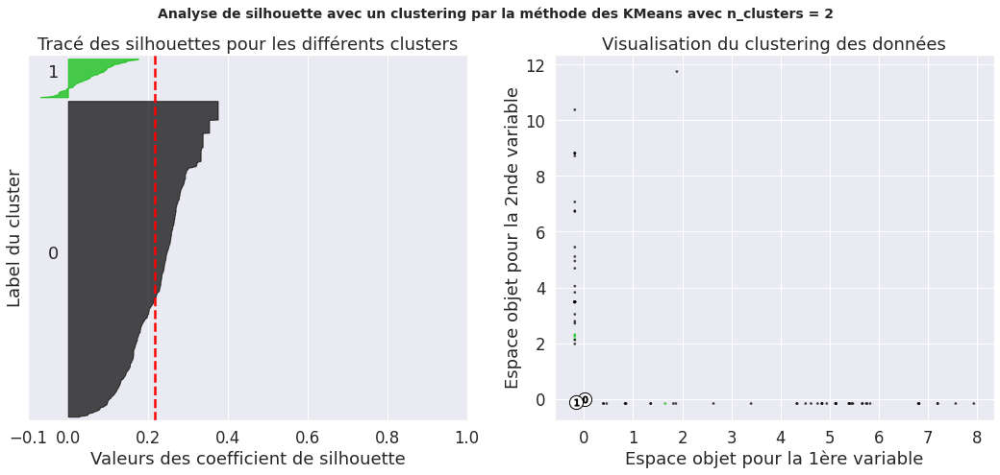

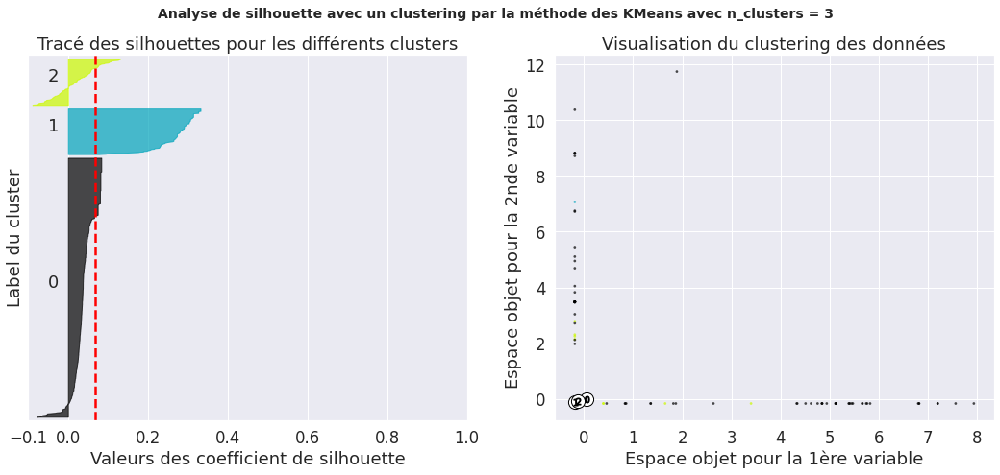

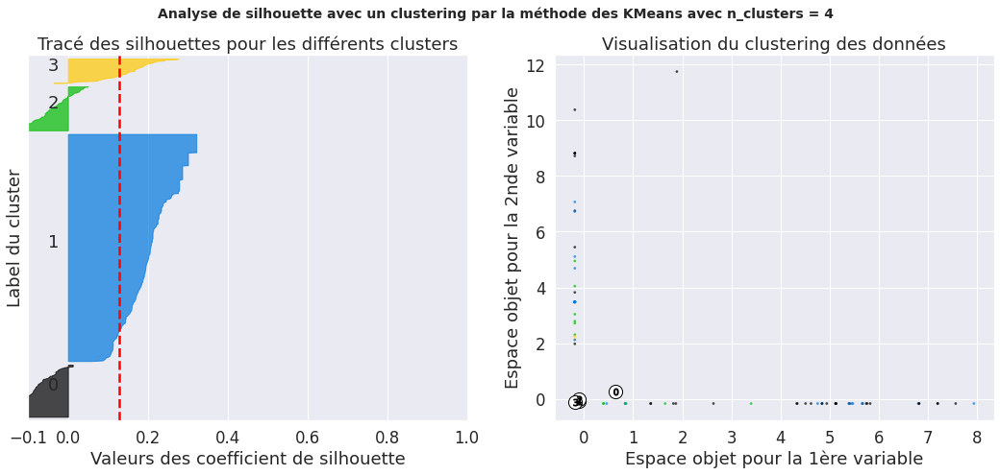

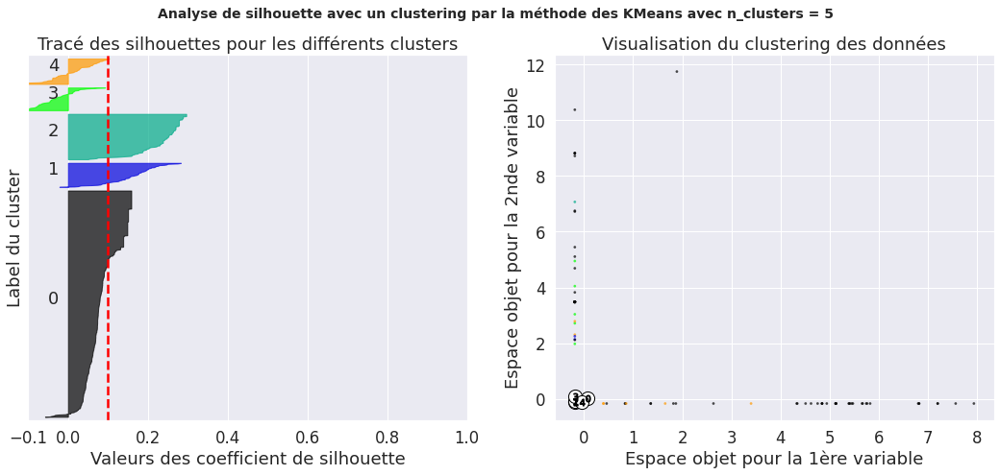

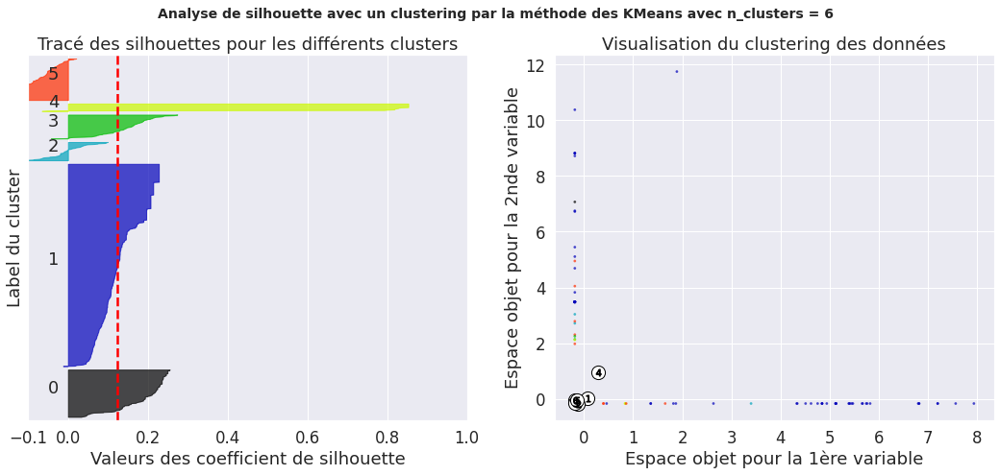

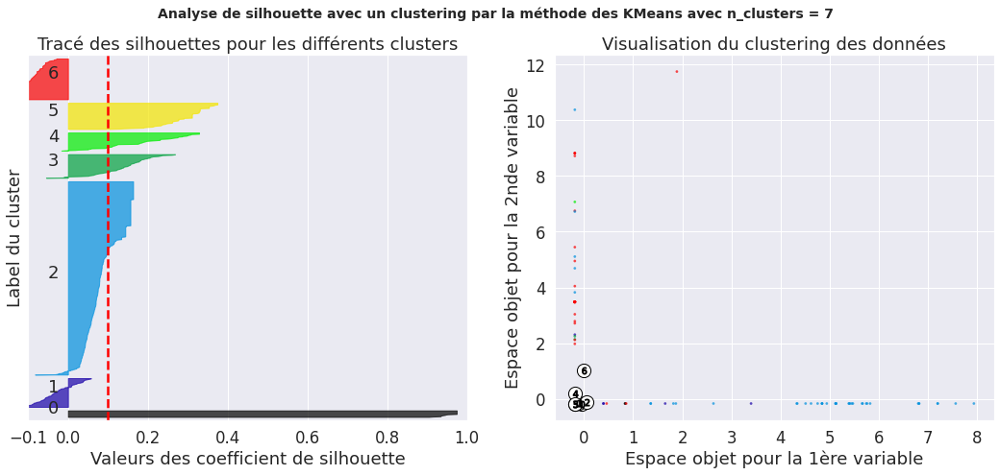

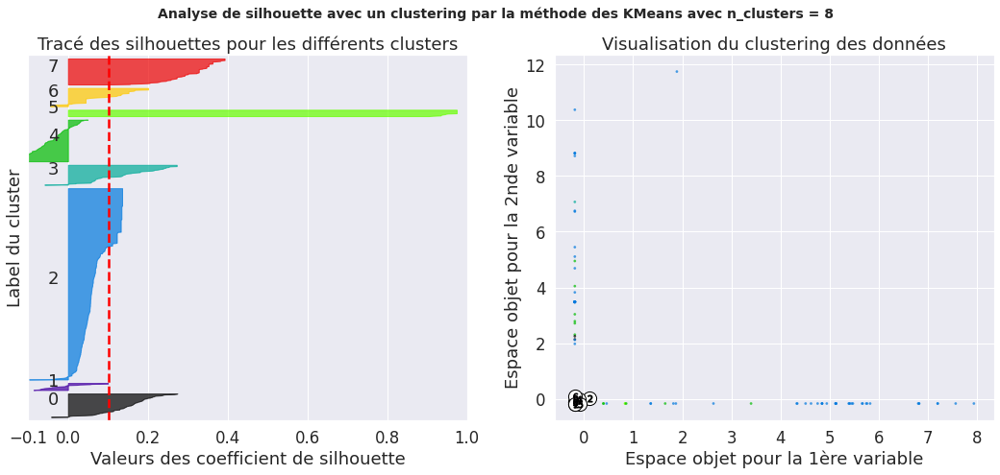

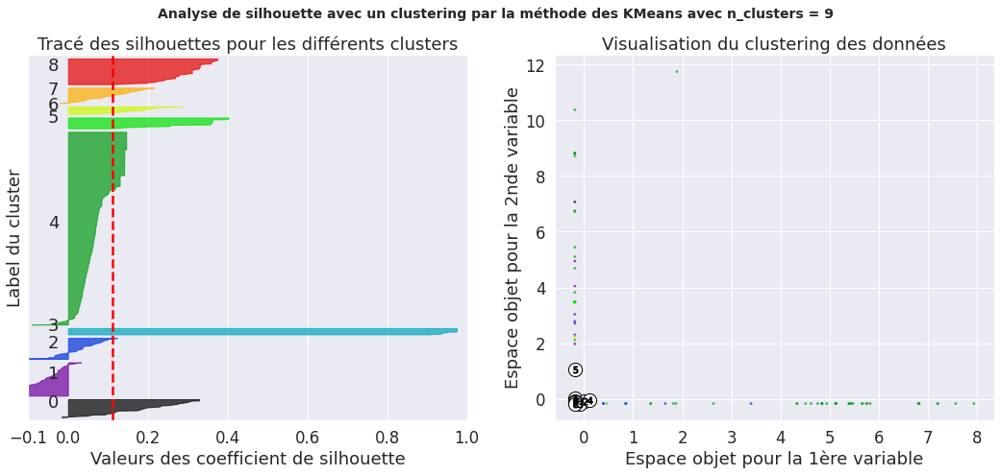

In [82]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9]

calculate_silhouette_score(range_n_clusters, text_data_tttsup, n_init=30)

In [88]:
clustering(text_data_tttsup, df, n_clusters=6)
df.head()

,uniq_id,category,description,image,cluster
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,key featur eleg polyest multicolor abstract ey...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,5
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,specif sathiya cotton bath towel bath towel re...,7b72c92c2f6c40268628ec5f14c6d590.jpg,5
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,key featur eurospa cotton terri face towel set...,64d5d4a258243731dc7bbb1eef49ad74.jpg,5
3,d4684dcdc759dd9cdf41504698d737d8,Home Furnishing,key featur santosh royal fashion cotton print ...,d4684dcdc759dd9cdf41504698d737d8.jpg,5
4,6325b6870c54cd47be6ebfbffa620ec7,Home Furnishing,key featur jaipur print cotton floral king siz...,6325b6870c54cd47be6ebfbffa620ec7.jpg,5


In [89]:
df['cluster'].value_counts() 

3    629
5    138
1    135
2     74
0     53
4     21
Name: cluster, dtype: int64

In [90]:
# Matrix of confusion
y_true = df['category']
y_pred = df['cluster']

confusion_matrix(y_true, y_pred.values.astype(int).astype(str))

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  1,   0,  74,  57,   0,  18,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0, 142,   0,   8,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0, 137,   0,  13,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0, 114,   0,  36,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0, 105,   0,  45,   0,   0,   0,   0,   0,   0,   0],
       [ 52,   0,   0,  60,  21,  17,   0,   0,   0,   0,   0,   0,   0],
       [  0, 135,   0,  14,   0,   1,   0,   0,   0,   0,   0,   0,   0]])

In [91]:
# Visualisation
fashion_tsne = TSNE(random_state=RS).fit_transform(text_data_tttsup) 

(<Figure size 576x576 with 1 Axes>,
 [Text(-6.195242, 30.469414, '0'),
  Text(-43.235573, 10.737163, '1'),
  Text(41.301422, 4.4908385, '2'),
  Text(0.84833986, -3.8641574, '3'),
  Text(19.765848, 44.635643, '4'),
  Text(13.041191, 7.606965, '5')])

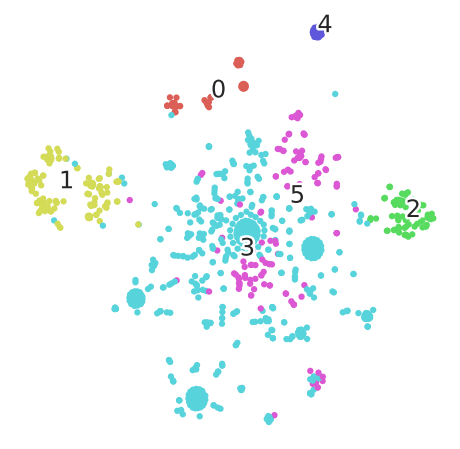

In [92]:
tnse_visualisation(fashion_tsne, df['cluster'])

# Modèles de Classification des Images: Méthode ORB et BOVW
- basée sur les vecteurs descripteurs extraits grâce à ORB

In [ ]:
# Unpickling : reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 6/df_flipkart_final.pkl', 'rb') as pickle_file:
    df_flipkart_final = pickle.load(pickle_file)

In [ ]:
df = df_flipkart_final.copy()

In [ ]:
list_images = []

for row in df['image']:
    list_images.append(row)

list_images

['55b85ea15a1536d46b7190ad6fff8ce7.jpg',
 '7b72c92c2f6c40268628ec5f14c6d590.jpg',
 '64d5d4a258243731dc7bbb1eef49ad74.jpg',
 'd4684dcdc759dd9cdf41504698d737d8.jpg',
 '6325b6870c54cd47be6ebfbffa620ec7.jpg',
 '893aa5ed55f7cff2eccea7758d7a86bd.jpg',
 'f355cc1ccb08bd0d283ed979b7ee7515.jpg',
 'dd0e3470a7e6ed76fd69c2da27721041.jpg',
 '41384da51732c0b4df3de8f395714fbb.jpg',
 '710ed5f2393a4b9e8823aa0029f71f93.jpg',
 '920154acbe49d3202ed7d2ed2df1ea13.jpg',
 '08452abdadb3db1e686b94a9c52fc7b6.jpg',
 '1e8741b5ae27a513546c94b3f3312aee.jpg',
 '189fa66a5fa6f08d2802a62ecf0be298.jpg',
 'bbb8cdc5406ff60ff06ff64630f2ca47.jpg',
 '1120bc768623572513df956172ffefeb.jpg',
 '5479bb7028827d60000720a2c135976a.jpg',
 '733aa1e801a139fa8dc7be9f0eff5ee0.jpg',
 '62c35de4df27437d3597963fac55a8b6.jpg',
 '33d97d63c037078cd3f08033966d6a88.jpg',
 'd7ca2b06b4f4d3b98c61c377b18a2d6b.jpg',
 'f74476ba64365d97a5be7d375cbf4c7a.jpg',
 'fda50982a672ef8835de5c1cc86f8bfc.jpg',
 '4788f5466992da09024b8ffcc8a5cba4.jpg',
 '653826cd53f1d9

In [ ]:
# Extract part of the name of the image from the df column 'image' 
orb = cv2.ORB_create(nfeatures=1500)
# Create list with all descriptors
all_features = []


"""Create a function that: 
- Extract the vectors that describe the images: descriptors ; 
- Create clusters with the 70 features identified (10 per category known = 70) ; 
- Create a matrix with the frequency of apparition of the features in each images."""


def ORB_and_BOVW_method(list_images):

    global df_frequences_visual_bag_words
    
    for elt in list_images:
        # Define the path for images
        path = pathlib.PurePosixPath('/content/gdrive/My Drive/Colab Notebooks/Projet 6/Flipkart_Images/').joinpath(elt)
        # Read image
        image = cv2.imread(str(path))
        # Get keypoints and dsecriptors
        keypoints = orb.detect(image, None)
        keypoints, descriptors = orb.compute(image, keypoints)
        # Show keypoints
        img = cv2.drawKeypoints(image, keypoints, None)

        #all_features.append(descriptors)

        # Append each descriptor to a list 
        if descriptors is None:
            print('No descriptor for this image : ' + str(elt))
        else:
            all_features.append(descriptors)


    # Create clusters with the 70 features identified (10 per category known = 70)
    kmeans = KMeans(n_clusters = 70, n_init=15, init='random') #MiniBatchKMeans

    clusters_with_features=[item for sublist in all_features for item in sublist]
    kmeans.fit(clusters_with_features)#vocabulary


    # Create a matrix with the frequency of apparition of the features in each images
    # Define the number of features
    documents_per_feature=[0] * 70
    
    # Create a list with all features
    all_doc_with_feature=[]
    
    for i in all_features:
        clusters = []
        for u in i:
            cluster = kmeans.predict([u])  
            clusters.append(cluster[0])
            
        nums=pd.Series(clusters).value_counts()
        # Calculate term frequency: tf for each descriptor in the document
        tf=nums.apply(lambda a:a/nums.sum())
        # Append the list with all features
        all_doc_with_feature.append(tf.to_dict())

    for i in all_doc_with_feature:
        for k in i:
            # documents_per_feature : number of documents containing a given feature
            documents_per_feature[k-1]=documents_per_feature[k-1]+1

    # Create a matrix with the frequencies
    df_frequences_visual_bag_words= pd.DataFrame(columns= range(1,71))
    
    for i in all_doc_with_feature:
        row=[0]*70
        totalWords=0
        for k in i:
            idf=m.log(len(all_doc_with_feature)/documents_per_feature[k-1])
            res=i[k]*idf
            row[k]=res
        df_frequences_visual_bag_words=df_frequences_visual_bag_words.append(pd.Series(row, range(1,71)),ignore_index=True )  
    
    df_frequences_visual_bag_words  

    return df_frequences_visual_bag_words

In [ ]:
ORB_and_BOVW_method(list_images)

No descriptor for this image : 9743e6d1c9f3180483825fe4d2e97836.jpg


,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70
0,0.000531,0.000240,0.00112,0.000597,0.00014,0.000268,0.000733,0.000167,0.000163,0.000185,0.000572,0.000359,0.000175,0.000748,0.000450,0.000698,0.000719,0.000469,0.000817,0.000234,0.000207,0.000272,0.001076,0.000197,0.000633,0.000158,0.001919,0.000219,0.000168,0.000257,0.000581,0.00048,0.000463,0.001008,0.002855,0.000127,0.000318,0.000295,0.000419,0.000144,0.000215,0.001169,0.000299,0.000241,0.000102,0.000484,0.000684,0.000283,0.000223,0.000682,0.000180,0.000243,0.00076,0.000347,0.000950,0.000270,0.000532,0.000248,0.000209,0.000145,0.000495,0.001373,0.002237,0.000179,0.000542,0.000234,0.000201,0.000080,0.000186,0.001186
1,0.000370,0.000283,0.00080,0.000554,0.00070,0.000475,0.000581,0.000359,0.000133,0.000265,0.000627,0.000559,0.000404,0.001130,0.000450,0.000614,0.000452,0.000256,0.000261,0.000485,0.000606,0.000218,0.001004,0.000340,0.000417,0.000633,0.001525,0.000439,0.000336,0.000257,0.000760,0.00050,0.000579,0.001039,0.000645,0.000226,0.000418,0.000812,0.000474,0.000311,0.000239,0.000611,0.000658,0.000466,0.000215,0.000387,0.000651,0.000158,0.000708,0.000490,0.000253,0.000485,0.00018,0.000217,0.000991,0.000351,0.000296,0.000268,0.000452,0.000225,0.001115,0.000174,0.000820,0.000152,0.000232,0.000468,0.000370,0.000113,0.000289,0.000237
2,0.000289,0.000099,0.00014,0.000554,0.00018,0.000041,0.000520,0.000180,0.000266,0.000092,0.000436,0.000719,0.000229,0.000278,0.000659,0.000223,0.000770,0.000341,0.000226,0.000084,0.000310,0.000762,0.000143,0.001263,0.000139,0.000475,0.000344,0.003328,0.000093,0.000064,0.000670,0.00042,0.000965,0.000825,0.000552,0.000127,0.000368,0.000591,0.000781,0.001748,0.000718,0.000159,0.000957,0.000434,0.000154,0.000251,0.000195,0.000565,0.000298,0.000213,0.000234,0.000189,0.00042,0.000866,0.000330,0.000351,0.000310,0.001239,0.000243,0.000241,0.000495,0.000435,0.000224,0.000143,0.000329,0.000786,0.000093,0.000273,0.000103,0.000712
3,0.000354,0.000014,0.00070,0.000043,0.00026,0.000620,0.000550,0.000180,0.000163,0.000046,0.000272,0.001598,0.000081,0.000591,0.000386,0.001032,0.000151,0.001322,0.000800,0.000134,0.000059,0.000316,0.001865,0.000116,0.000478,0.000113,0.000935,0.000073,0.000561,0.000547,0.002815,0.00006,0.000232,0.000122,0.002762,0.000028,0.000402,0.002585,0.000195,0.000215,0.000120,0.001329,0.000060,0.000225,0.000225,0.000716,0.001628,0.000150,0.000037,0.000320,0.000072,0.000270,0.00044,0.001863,0.001652,0.000526,0.000222,0.000661,0.000209,0.000209,0.002477,0.000330,0.002833,0.000125,0.000193,0.000301,0.000093,0.000161,0.000971,0.000593
4,0.000515,0.000254,0.00032,0.000725,0.00030,0.000454,0.000244,0.000372,0.000118,0.000369,0.000599,0.000439,0.000364,0.000382,0.000659,0.000614,0.000468,0.000384,0.000330,0.000569,0.000621,0.000261,0.000359,0.000322,0.000355,0.000498,0.000615,0.000475,0.000542,0.000402,0.000626,0.00082,0.000965,0.000886,0.000691,0.000254,0.000569,0.000295,0.000140,0.000335,0.000192,0.000399,0.000508,0.000756,0.000184,0.000832,0.000781,0.000200,0.001415,0.000788,0.000559,0.000229,0.00032,0.000303,0.000372,0.000377,0.000222,0.000268,0.000400,0.000402,0.000702,0.000417,0.000149,0.000090,0.000290,0.000268,0.000571,0.000177,0.000578,0.001186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,0.000177,0.000396,0.00016,0.004648,0.00052,0.000103,0.000153,0.000257,0.000266,0.000185,0.000654,0.000240,0.000283,0.000469,0.000209,0.000140,0.000636,0.000085,0.000261,0.000234,0.000975,0.000359,0.000072,0.000394,0.000293,0.000498,0.000320,0.000988,0.000187,0.000145,0.000089,0.00072,0.001930,0.002261,0.000414,0.000396,0.000318,0.000295,0.000614,0.000455,0.000311,0.0

In [ ]:
df_frequences_visual_bag_words

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70
0,0.000531,0.000240,0.00112,0.000597,0.00014,0.000268,0.000733,0.000167,0.000163,0.000185,0.000572,0.000359,0.000175,0.000748,0.000450,0.000698,0.000719,0.000469,0.000817,0.000234,0.000207,0.000272,0.001076,0.000197,0.000633,0.000158,0.001919,0.000219,0.000168,0.000257,0.000581,0.00048,0.000463,0.001008,0.002855,0.000127,0.000318,0.000295,0.000419,0.000144,0.000215,0.001169,0.000299,0.000241,0.000102,0.000484,0.000684,0.000283,0.000223,0.000682,0.000180,0.000243,0.00076,0.000347,0.000950,0.000270,0.000532,0.000248,0.000209,0.000145,0.000495,0.001373,0.002237,0.000179,0.000542,0.000234,0.000201,0.000080,0.000186,0.001186
1,0.000370,0.000283,0.00080,0.000554,0.00070,0.000475,0.000581,0.000359,0.000133,0.000265,0.000627,0.000559,0.000404,0.001130,0.000450,0.000614,0.000452,0.000256,0.000261,0.000485,0.000606,0.000218,0.001004,0.000340,0.000417,0.000633,0.001525,0.000439,0.000336,0.000257,0.000760,0.00050,0.000579,0.001039,0.000645,0.000226,0.000418,0.000812,0.000474,0.000311,0.000239,0.000611,0.000658,0.000466,0.000215,0.000387,0.000651,0.000158,0.000708,0.000490,0.000253,0.000485,0.00018,0.000217,0.000991,0.000351,0.000296,0.000268,0.000452,0.000225,0.001115,0.000174,0.000820,0.000152,0.000232,0.000468,0.000370,0.000113,0.000289,0.000237
2,0.000289,0.000099,0.00014,0.000554,0.00018,0.000041,0.000520,0.000180,0.000266,0.000092,0.000436,0.000719,0.000229,0.000278,0.000659,0.000223,0.000770,0.000341,0.000226,0.000084,0.000310,0.000762,0.000143,0.001263,0.000139,0.000475,0.000344,0.003328,0.000093,0.000064,0.000670,0.00042,0.000965,0.000825,0.000552,0.000127,0.000368,0.000591,0.000781,0.001748,0.000718,0.000159,0.000957,0.000434,0.000154,0.000251,0.000195,0.000565,0.000298,0.000213,0.000234,0.000189,0.00042,0.000866,0.000330,0.000351,0.000310,0.001239,0.000243,0.000241,0.000495,0.000435,0.000224,0.000143,0.000329,0.000786,0.000093,0.000273,0.000103,0.000712
3,0.000354,0.000014,0.00070,0.000043,0.00026,0.000620,0.000550,0.000180,0.000163,0.000046,0.000272,0.001598,0.000081,0.000591,0.000386,0.001032,0.000151,0.001322,0.000800,0.000134,0.000059,0.000316,0.001865,0.000116,0.000478,0.000113,0.000935,0.000073,0.000561,0.000547,0.002815,0.00006,0.000232,0.000122,0.002762,0.000028,0.000402,0.002585,0.000195,0.000215,0.000120,0.001329,0.000060,0.000225,0.000225,0.000716,0.001628,0.000150,0.000037,0.000320,0.000072,0.000270,0.00044,0.001863,0.001652,0.000526,0.000222,0.000661,0.000209,0.000209,0.002477,0.000330,0.002833,0.000125,0.000193,0.000301,0.000093,0.000161,0.000971,0.000593
4,0.000515,0.000254,0.00032,0.000725,0.00030,0.000454,0.000244,0.000372,0.000118,0.000369,0.000599,0.000439,0.000364,0.000382,0.000659,0.000614,0.000468,0.000384,0.000330,0.000569,0.000621,0.000261,0.000359,0.000322,0.000355,0.000498,0.000615,0.000475,0.000542,0.000402,0.000626,0.00082,0.000965,0.000886,0.000691,0.000254,0.000569,0.000295,0.000140,0.000335,0.000192,0.000399,0.000508,0.000756,0.000184,0.000832,0.000781,0.000200,0.001415,0.000788,0.000559,0.000229,0.00032,0.000303,0.000372,0.000377,0.000222,0.000268,0.000400,0.000402,0.000702,0.000417,0.000149,0.000090,0.000290,0.000268,0.000571,0.000177,0.000578,0.001186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,0.000177,0.000396,0.00016,0.004648,0.00052,0.000103,0.000153,0.000257,0.000266,0.000185,0.000654,0.000240,0.000283,0.000469,0.000209,0.000140,0.000636,0.000085,0.000261,0.000234,0.000975,0.000359,0.000072,0.000394,0.000293,0.000498,0.000320,0.000988,0.000187,0.000145,0.000089,0.00072,0.001930,0.002261,0.000414,0.000396,0.000318,0.000295,0.000614,0.000455,0.000311,0.0

In [ ]:
# Pickling : writing
with open('df_frequences_visual_bag_words.pkl', 'wb') as pickle_file:
    pickle.dump(df_frequences_visual_bag_words, pickle_file)

In [ ]:
files.download('df_frequences_visual_bag_words.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [177]:
# Unpickling : reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 6/df_frequences_visual_bag_words.pkl', 'rb') as pickle_file:
    df_frequences_visual_bag_words = pickle.load(pickle_file)

In [178]:
df_ORB = df_frequences_visual_bag_words.copy()

In [179]:
scaler_ORB = StandardScaler()

In [180]:
ORB_data = scaler_ORB.fit_transform(df_ORB)

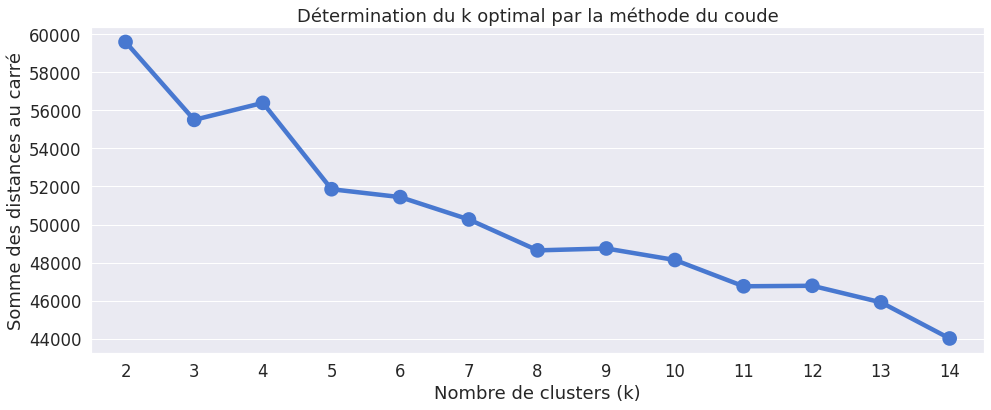

In [181]:
range_k = range(2, 15)

calculate_MiniBatchKMeans(ORB_data, range_k, n_init=30)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.18287058328109226
Pour n_clusters = 3 , le silhouette_score moyen est : 0.1828568840147146
Pour n_clusters = 4 , le silhouette_score moyen est : 0.11545338410707923
Pour n_clusters = 5 , le silhouette_score moyen est : 0.10413636337892691
Pour n_clusters = 6 , le silhouette_score moyen est : 0.09008654460716525
Pour n_clusters = 7 , le silhouette_score moyen est : 0.0646126351663406
Pour n_clusters = 8 , le silhouette_score moyen est : 0.06927523424771669
Pour n_clusters = 9 , le silhouette_score moyen est : 0.06167963611423534


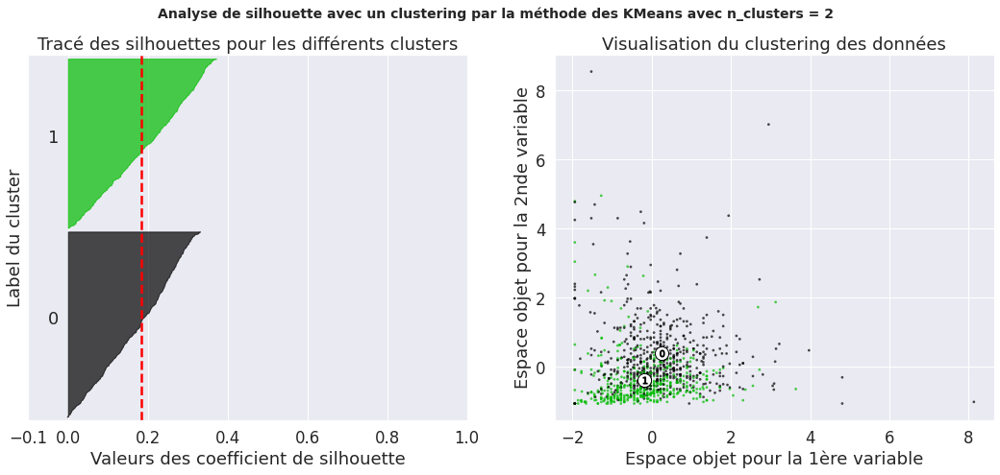

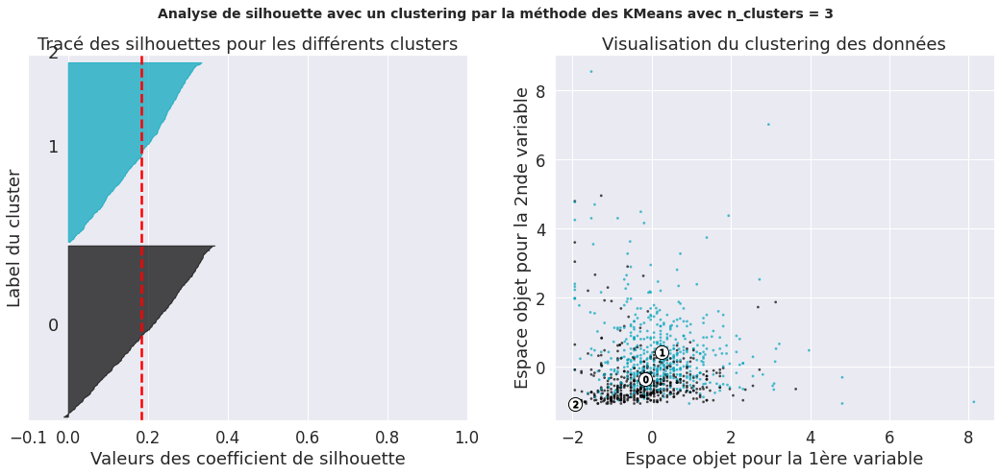

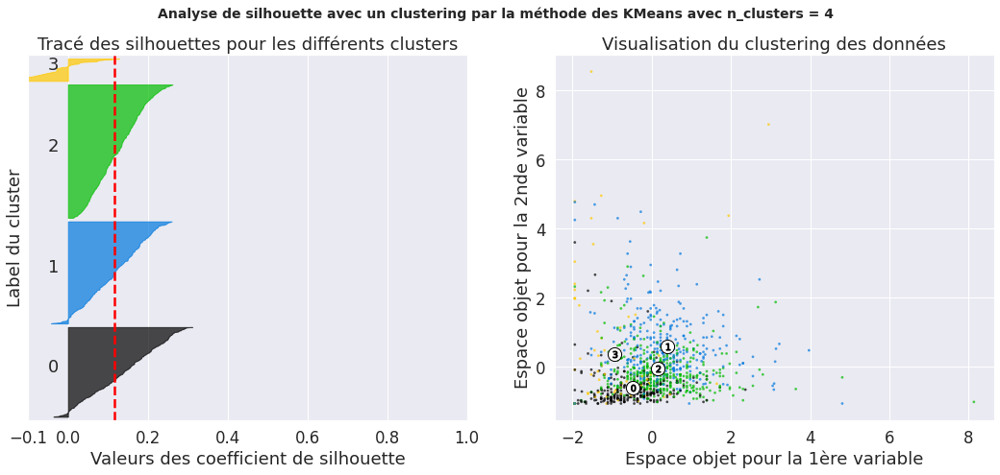

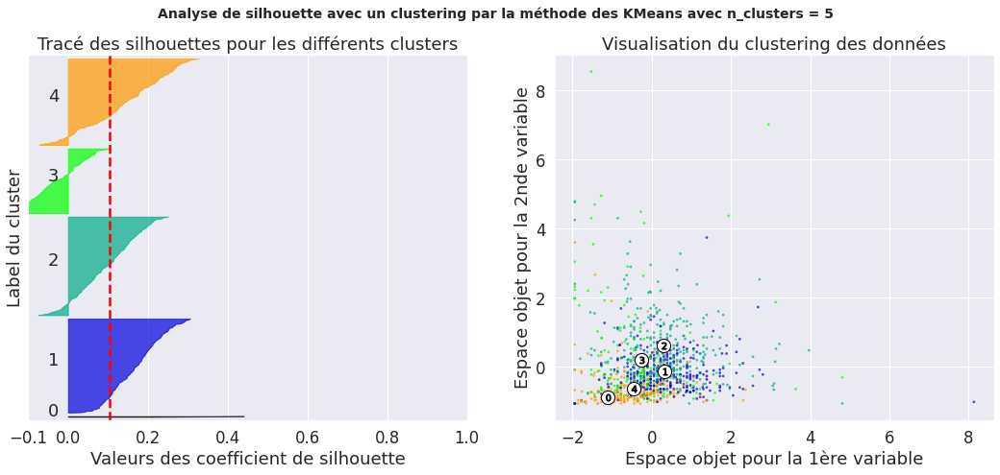

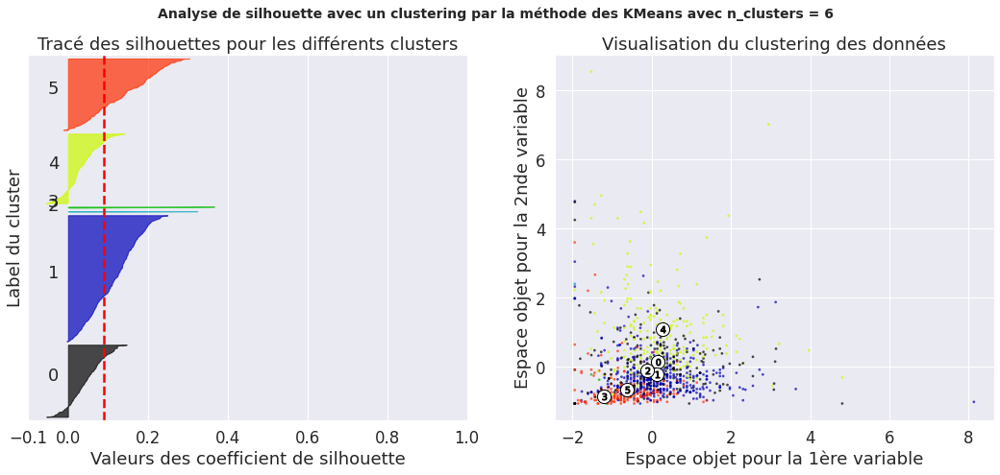

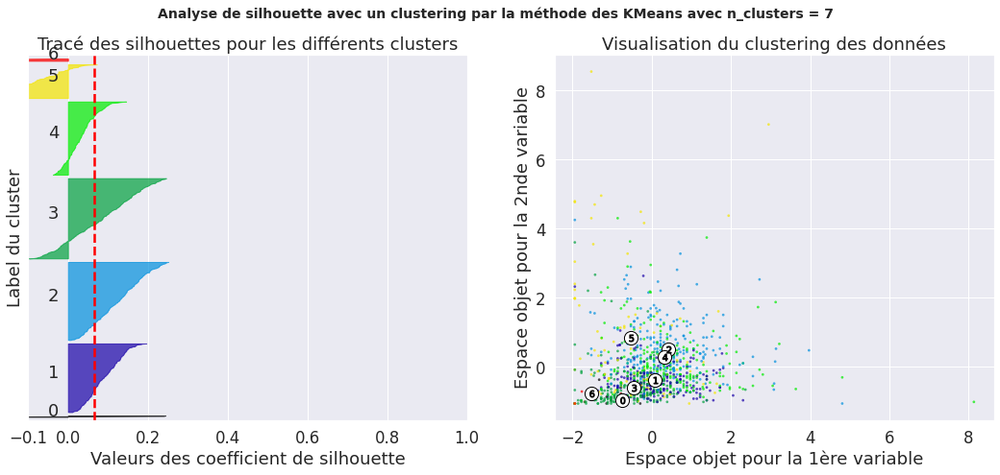

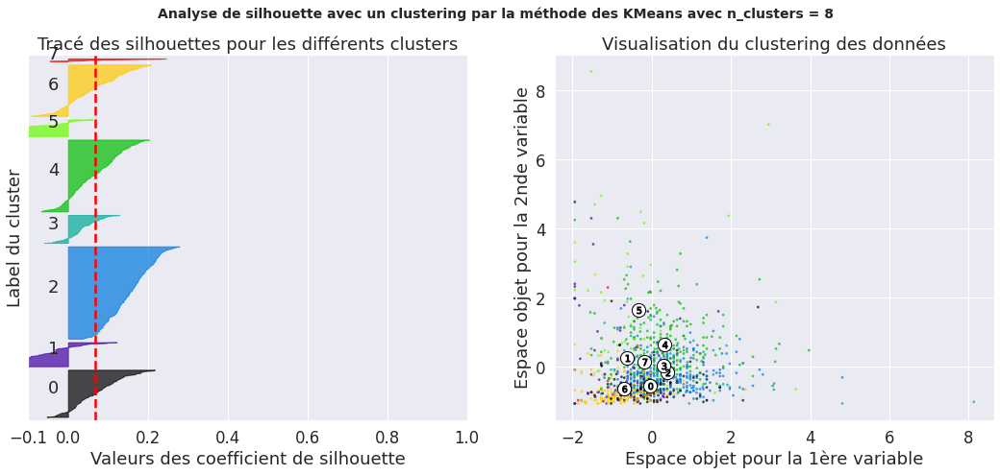

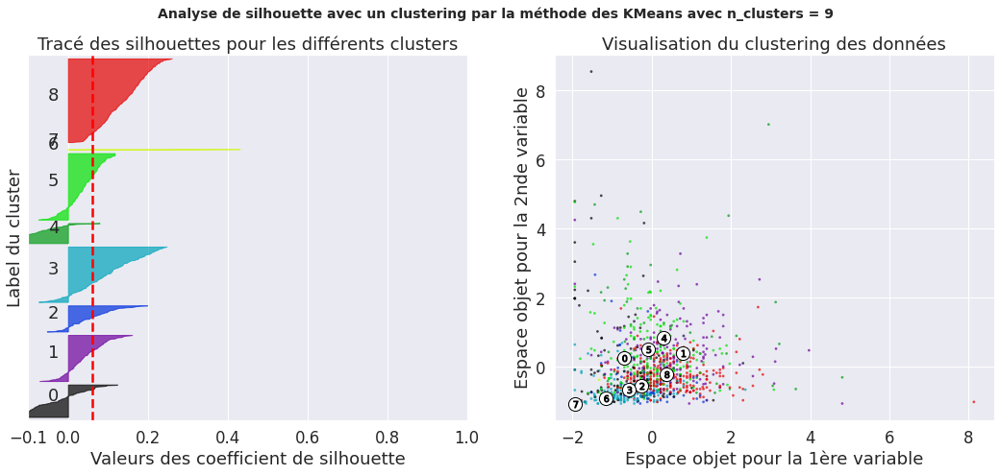

In [182]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9]

calculate_silhouette_score(range_n_clusters, ORB_data, n_init=30)

In [ ]:
#if df['image'] = '9743e6d1c9f3180483825fe4d2e97836.jpg':
#    df['image'].drop


df_clean = df[df['image'] != '9743e6d1c9f3180483825fe4d2e97836.jpg'] 
df_clean.head()

,uniq_id,category,description,image
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg
3,d4684dcdc759dd9cdf41504698d737d8,Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg
4,6325b6870c54cd47be6ebfbffa620ec7,Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg


In [ ]:
df_clean.shape

(1049, 4)

In [ ]:
clustering(ORB_data, df_clean, n_clusters=3)
df.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


,uniq_id,category,description,image
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg
3,d4684dcdc759dd9cdf41504698d737d8,Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg
4,6325b6870c54cd47be6ebfbffa620ec7,Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg


In [ ]:
df_clean['cluster'].unique()

array([2, 0, 1], dtype=int32)

In [ ]:
df_clean['cluster'].value_counts() 

0    479
2    324
1    246
Name: cluster, dtype: int64

In [ ]:
# Encoding 'category' 
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(df_clean['category'])

le.classes_

le.transform(df_clean['category'])

array([4, 0, 0, ..., 0, 0, 0])

In [ ]:
df_clean['category'].unique()

array(['Home Furnishing ', 'Baby Care ', 'Watches ',
       'Home Decor & Festive Needs ', 'Kitchen & Dining ',
       'Beauty and Personal Care ', 'Computers '], dtype=object)

In [ ]:
df_clean['category'] = le.transform(df_clean['category'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df_clean['category'].unique()

array([4, 0, 6, 3, 5, 1, 2])

In [ ]:
df_clean['category'].value_counts()

6    150
5    150
4    150
3    150
1    150
0    150
2    149
Name: category, dtype: int64

In [ ]:
# Matrice de confusion
from sklearn.metrics import confusion_matrix

y_true = df_clean['category']
y_pred = df_clean['cluster']

confusion_matrix(y_true, y_pred)


array([[72, 55, 23,  0,  0,  0,  0],
       [45, 33, 72,  0,  0,  0,  0],
       [50, 44, 55,  0,  0,  0,  0],
       [74, 11, 65,  0,  0,  0,  0],
       [96, 14, 40,  0,  0,  0,  0],
       [90, 31, 29,  0,  0,  0,  0],
       [52, 58, 40,  0,  0,  0,  0]])

In [ ]:
time_start = time.time()

fashion_tsne = TSNE(random_state=RS).fit_transform(ORB_data) 

(<Figure size 576x576 with 1 Axes>,
 [Text(1.1549492, -3.7639802, '0'),
  Text(7.0107546, -32.024925, '1'),
  Text(-6.6959505, 31.252514, '2')])

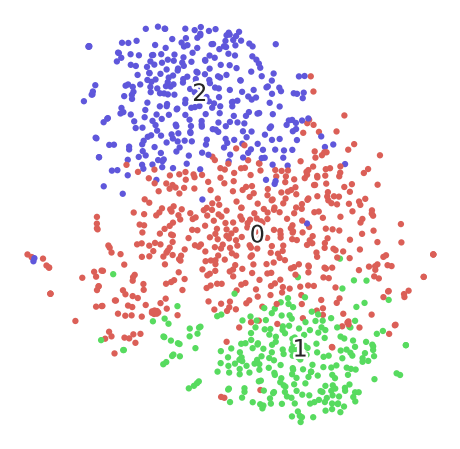

In [ ]:
tnse_visualisation(fashion_tsne, df_clean['cluster'])

Avec Prétraitement des images

In [ ]:
# Extract part of the name of the image from the df column 'image' 
orb = cv2.ORB_create(nfeatures=1500)
# Create list with all descriptors
all_features = []


"""Create a function that: 
- Extract the vectors that describe the images: descriptors ; 
- Create clusters with the 70 features identified (10 per category known = 70) ; 
- Create a matrix with the frequency of apparition of the features in each images."""


def ORB_and_BOVW_method_adding_pretreatment(list_images):

    global df_frequences_visual_bag_words_pretttsss
    
    for elt in list_images:
        # Define the path for images
        path = pathlib.PurePosixPath('/content/gdrive/My Drive/Colab Notebooks/Projet 6/Flipkart_Images/').joinpath(elt)
        # Read image
        image = cv2.imread(str(path))
        # Pretreatment of the images
        # Convert to greyscale
        image1 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        # Apply histogram equalization
        image2 = cv2.equalizeHist(image1)
        # Get keypoints and descriptors
        keypoints = orb.detect(image, None)
        keypoints, descriptors = orb.compute(image2, keypoints)
        # Show keypoints
        img = cv2.drawKeypoints(image, keypoints, None)

        #all_features.append(descriptors)

        # Append each descriptor to a list 
        if descriptors is None:
            print('No descriptor for this image : ' + str(elt))
        else:
            all_features.append(descriptors)


    # Create clusters with the 70 features identified (10 per category known = 70)
    kmeans = KMeans(n_clusters = 70, n_init=15, init='random')
    clusters_with_features=[item for sublist in all_features for item in sublist]
    kmeans.fit(clusters_with_features)


    # Create a matrix with the frequency of apparition of the features in each images
    # Define the number of features
    documents_per_feature=[0] * 70

    # Create a list with all features
    all_doc_with_feature = []

    for i in all_features:
        clusters = []
        for u in i:
            cluster = kmeans.predict([u])  
            clusters.append(cluster[0])
            
        nums = pd.Series(clusters).value_counts()
        # Calculate term frequency: tf for each descriptor in the document
        tf = nums.apply(lambda a:a/nums.sum())
        # Append the list with all features
        all_doc_with_feature.append(tf.to_dict())

    for i in all_doc_with_feature:
        for k in i:
            # documents_per_feature : number of documents containing a given feature
            documents_per_feature[k-1]=documents_per_feature[k-1]+1
    
    # Create a matrix with the frequencies
    df_frequences_visual_bag_words_prettt = pd.DataFrame(columns= range(1,71))
    
    for i in all_doc_with_feature:
        row=[0]*70
        totalWords=0
        for k in i:
            idf=m.log(len(all_doc_with_feature)/documents_per_feature[k-1])
            res=i[k]*idf
            row[k]=res
        df_frequences_visual_bag_words_prettt=df_frequences_visual_bag_words_prettt.append(pd.Series(row, range(1,71)),ignore_index=True )  
    
    df_frequences_visual_bag_words_prettt

    return df_frequences_visual_bag_words_prettt

In [ ]:
ORB_and_BOVW_method_adding_pretreatment(list_images)

No descriptor for this image : 9743e6d1c9f3180483825fe4d2e97836.jpg


,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70
0,0.000384,0.000123,0.000853,0.000907,0.000306,0.000492,0.000988,0.000686,0.000090,0.000308,0.00040,0.000286,0.000256,0.000323,0.000196,0.000067,0.000359,0.001199,0.000417,0.000748,0.000661,0.000174,0.000104,0.004219,0.000177,0.000097,0.000359,0.000154,0.000257,0.000441,0.000391,0.001589,0.000219,0.000162,0.000361,0.000644,0.000565,0.000595,0.000158,0.000243,0.000894,0.000312,0.000730,0.000192,0.000429,0.000290,0.000177,0.000378,0.000430,0.000301,0.000070,0.000204,0.000180,0.000143,0.000499,0.000600,0.000318,0.000125,0.000695,0.000112,0.000150,0.000381,0.000372,0.000134,0.000216,0.00052,0.000184,0.000479,0.000514,0.000289
1,0.000512,0.000494,0.000938,0.000855,0.000257,0.000518,0.000478,0.000571,0.000451,0.000308,0.00066,0.000373,0.000405,0.000215,0.000254,0.000229,0.000538,0.000747,0.000447,0.000102,0.000348,0.000338,0.000452,0.000492,0.000133,0.000256,0.000407,0.000225,0.000338,0.000518,0.000256,0.001196,0.000378,0.000324,0.000126,0.000508,0.000332,0.000577,0.000183,0.000365,0.001137,0.000162,0.001078,0.000176,0.000268,0.000348,0.000322,0.000268,0.000467,0.000535,0.000112,0.000339,0.000343,0.000257,0.000121,0.000628,0.000673,0.000161,0.000384,0.000251,0.000265,0.000327,0.000516,0.000146,0.000293,0.00044,0.000225,0.000742,0.000628,0.000161
2,0.000448,0.000864,0.000341,0.000052,0.000434,0.000156,0.000494,0.000086,0.000307,0.000231,0.00030,0.000132,0.000192,0.000862,0.001650,0.000688,0.000747,0.000317,0.000062,0.000318,0.000330,0.000196,0.000330,0.000492,0.000813,0.000122,0.000072,0.000318,0.000080,0.000181,0.000148,0.000131,0.000402,0.000216,0.000126,0.000305,0.000199,0.000253,0.000125,0.000174,0.000569,0.001004,0.000278,0.000591,0.000321,0.000155,0.000338,0.000097,0.000374,0.000402,0.000084,0.001041,0.000162,0.003171,0.000324,0.000571,0.000093,0.000197,0.000251,0.000558,0.000023,0.000082,0.000165,0.000207,0.000293,0.00036,0.000154,0.000239,0.000600,0.000322
3,0.002048,0.000170,0.001876,0.000467,0.000145,0.001218,0.000478,0.001000,0.000234,0.000231,0.00016,0.000747,0.000895,0.001257,0.000104,0.000121,0.000149,0.000498,0.000555,0.000113,0.000209,0.000131,0.000052,0.003516,0.000325,0.000232,0.000072,0.000020,0.000579,0.000855,0.000539,0.000785,0.000171,0.000067,0.000325,0.000034,0.001396,0.000487,0.000083,0.000122,0.002559,0.000081,0.000608,0.000245,0.002197,0.000658,0.000531,0.000414,0.000112,0.000084,0.000162,0.000249,0.000054,0.000114,0.000270,0.001828,0.000075,0.000116,0.000384,0.001032,0.000150,0.000436,0.000124,0.000475,0.000139,0.00018,0.000123,0.000527,0.000143,0.000113
4,0.000192,0.000663,0.000469,0.000363,0.000868,0.000622,0.000324,0.000314,0.000433,0.000359,0.00040,0.000813,0.000895,0.000180,0.000346,0.000202,0.000538,0.000452,0.000478,0.000215,0.000643,0.000261,0.000400,0.000422,0.000192,0.000353,0.000790,0.000297,0.000354,0.000415,0.000175,0.000430,0.000183,0.000324,0.000361,0.000610,0.000365,0.000343,0.000224,0.000104,0.000569,0.000335,0.000417,0.000146,0.000536,0.000445,0.000370,0.000292,0.000056,0.000402,0.000112,0.000362,0.000541,0.000114,0.000162,0.000343,0.000804,0.000063,0.000650,0.000391,0.000300,0.000272,0.000496,0.000585,0.000324,0.00062,0.000215,0.000287,0.000571,0.000257
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,0.000512,0.000602,0.000171,0.000130,0.000434,0.000285,0.000478,0.000143,0.000397,0.000231,0.00058,0.000198,0.000170,0.000180,0.000312,0.000202,0.001794,0.000339,0.000201,0.000184,0.000209,0.000152,0.000365,0.000211,0.000118,0.000183,0.002490,0.000379,0.000193,0.000337,0.000202,0.000318,0.000256,0.000512,0.000108,0.003627,0.000365,0.000180,0.000150,0.000330,

In [ ]:
df_frequences_visual_bag_words_prettt

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70
0,0.000384,0.000123,0.000853,0.000907,0.000306,0.000492,0.000988,0.000686,0.000090,0.000308,0.00040,0.000286,0.000256,0.000323,0.000196,0.000067,0.000359,0.001199,0.000417,0.000748,0.000661,0.000174,0.000104,0.004219,0.000177,0.000097,0.000359,0.000154,0.000257,0.000441,0.000391,0.001589,0.000219,0.000162,0.000361,0.000644,0.000565,0.000595,0.000158,0.000243,0.000894,0.000312,0.000730,0.000192,0.000429,0.000290,0.000177,0.000378,0.000430,0.000301,0.000070,0.000204,0.000180,0.000143,0.000499,0.000600,0.000318,0.000125,0.000695,0.000112,0.000150,0.000381,0.000372,0.000134,0.000216,0.00052,0.000184,0.000479,0.000514,0.000289
1,0.000512,0.000494,0.000938,0.000855,0.000257,0.000518,0.000478,0.000571,0.000451,0.000308,0.00066,0.000373,0.000405,0.000215,0.000254,0.000229,0.000538,0.000747,0.000447,0.000102,0.000348,0.000338,0.000452,0.000492,0.000133,0.000256,0.000407,0.000225,0.000338,0.000518,0.000256,0.001196,0.000378,0.000324,0.000126,0.000508,0.000332,0.000577,0.000183,0.000365,0.001137,0.000162,0.001078,0.000176,0.000268,0.000348,0.000322,0.000268,0.000467,0.000535,0.000112,0.000339,0.000343,0.000257,0.000121,0.000628,0.000673,0.000161,0.000384,0.000251,0.000265,0.000327,0.000516,0.000146,0.000293,0.00044,0.000225,0.000742,0.000628,0.000161
2,0.000448,0.000864,0.000341,0.000052,0.000434,0.000156,0.000494,0.000086,0.000307,0.000231,0.00030,0.000132,0.000192,0.000862,0.001650,0.000688,0.000747,0.000317,0.000062,0.000318,0.000330,0.000196,0.000330,0.000492,0.000813,0.000122,0.000072,0.000318,0.000080,0.000181,0.000148,0.000131,0.000402,0.000216,0.000126,0.000305,0.000199,0.000253,0.000125,0.000174,0.000569,0.001004,0.000278,0.000591,0.000321,0.000155,0.000338,0.000097,0.000374,0.000402,0.000084,0.001041,0.000162,0.003171,0.000324,0.000571,0.000093,0.000197,0.000251,0.000558,0.000023,0.000082,0.000165,0.000207,0.000293,0.00036,0.000154,0.000239,0.000600,0.000322
3,0.002048,0.000170,0.001876,0.000467,0.000145,0.001218,0.000478,0.001000,0.000234,0.000231,0.00016,0.000747,0.000895,0.001257,0.000104,0.000121,0.000149,0.000498,0.000555,0.000113,0.000209,0.000131,0.000052,0.003516,0.000325,0.000232,0.000072,0.000020,0.000579,0.000855,0.000539,0.000785,0.000171,0.000067,0.000325,0.000034,0.001396,0.000487,0.000083,0.000122,0.002559,0.000081,0.000608,0.000245,0.002197,0.000658,0.000531,0.000414,0.000112,0.000084,0.000162,0.000249,0.000054,0.000114,0.000270,0.001828,0.000075,0.000116,0.000384,0.001032,0.000150,0.000436,0.000124,0.000475,0.000139,0.00018,0.000123,0.000527,0.000143,0.000113
4,0.000192,0.000663,0.000469,0.000363,0.000868,0.000622,0.000324,0.000314,0.000433,0.000359,0.00040,0.000813,0.000895,0.000180,0.000346,0.000202,0.000538,0.000452,0.000478,0.000215,0.000643,0.000261,0.000400,0.000422,0.000192,0.000353,0.000790,0.000297,0.000354,0.000415,0.000175,0.000430,0.000183,0.000324,0.000361,0.000610,0.000365,0.000343,0.000224,0.000104,0.000569,0.000335,0.000417,0.000146,0.000536,0.000445,0.000370,0.000292,0.000056,0.000402,0.000112,0.000362,0.000541,0.000114,0.000162,0.000343,0.000804,0.000063,0.000650,0.000391,0.000300,0.000272,0.000496,0.000585,0.000324,0.00062,0.000215,0.000287,0.000571,0.000257
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,0.000512,0.000602,0.000171,0.000130,0.000434,0.000285,0.000478,0.000143,0.000397,0.000231,0.00058,0.000198,0.000170,0.000180,0.000312,0.000202,0.001794,0.000339,0.000201,0.000184,0.000209,0.000152,0.000365,0.000211,0.000118,0.000183,0.002490,0.000379,0.000193,0.000337,0.000202,0.000318,0.000256,0.000512,0.000108,0.003627,0.000365,0.000180,0.000150,0.000330,

In [ ]:
# Pickling : writing
with open('df_frequences_visual_bag_words_prettt.pkl', 'wb') as pickle_file:
    pickle.dump(df_frequences_visual_bag_words_prettt, pickle_file)

In [ ]:
files.download('df_frequences_visual_bag_words_prettt.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Unpickling : reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 6/df_frequences_visual_bag_words_prettt.pkl', 'rb') as pickle_file:
    df_frequences_visual_bag_words_prettt = pickle.load(pickle_file)

In [ ]:
df_ORB_BIS = df_frequences_visual_bag_words_prettt.copy()

In [ ]:
scaler_ORB_BIS = StandardScaler()

In [ ]:
ORB_data_BIS = scaler_ORB_BIS.fit_transform(df_ORB_BIS)

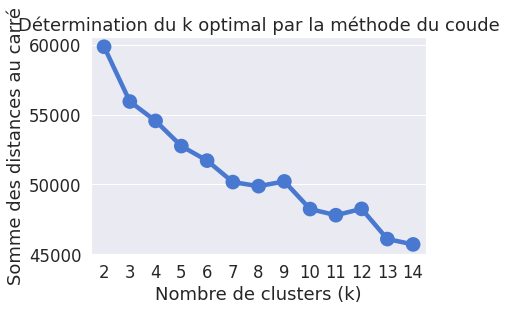

In [ ]:
range_k = range(2, 15)

calculate_MiniBatchKMeans(ORB_data_BIS, range_k, n_init=30)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.17848039050484324
Pour n_clusters = 3 , le silhouette_score moyen est : 0.1811890586396887
Pour n_clusters = 4 , le silhouette_score moyen est : 0.09035062129316386
Pour n_clusters = 5 , le silhouette_score moyen est : 0.10460047901674893
Pour n_clusters = 6 , le silhouette_score moyen est : 0.07387692480606173
Pour n_clusters = 7 , le silhouette_score moyen est : 0.07469329767249945
Pour n_clusters = 8 , le silhouette_score moyen est : 0.06175655394539107
Pour n_clusters = 9 , le silhouette_score moyen est : 0.05298889251042448


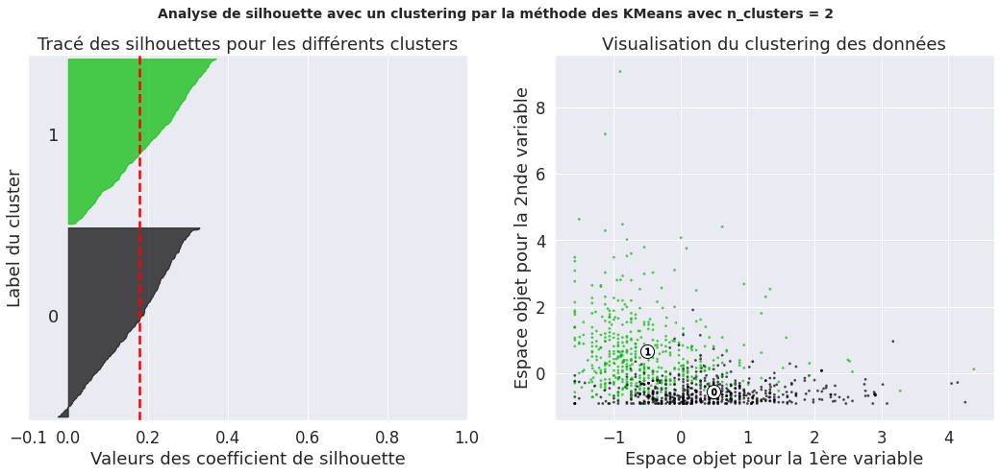

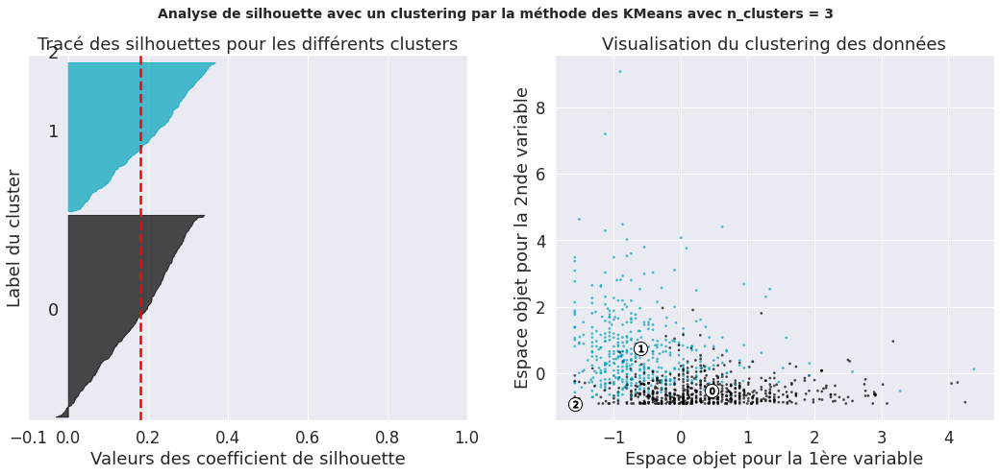

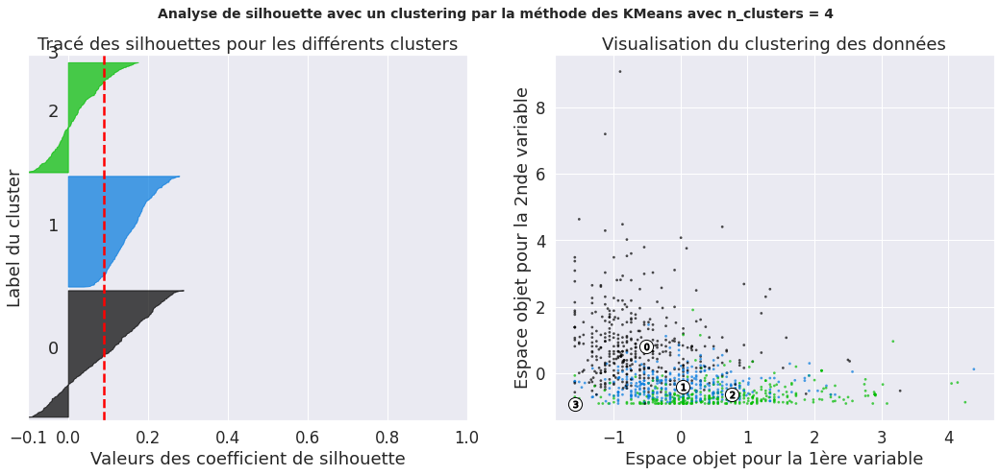

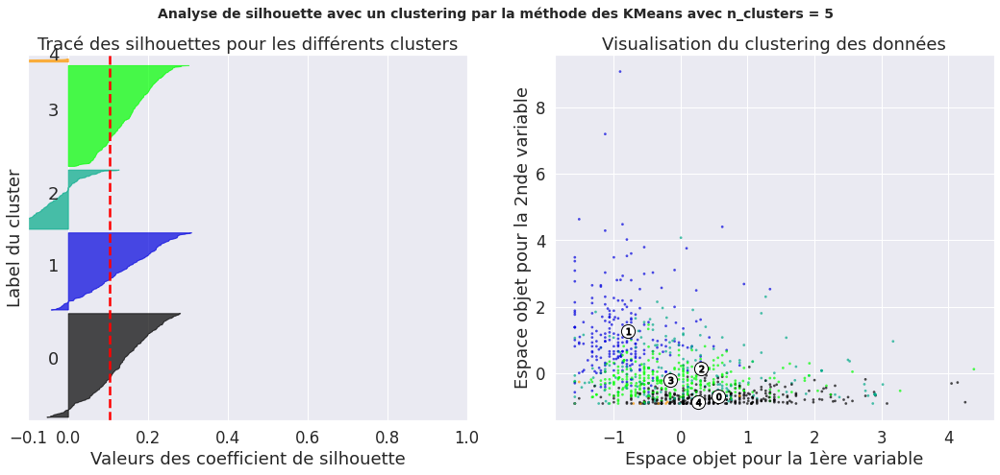

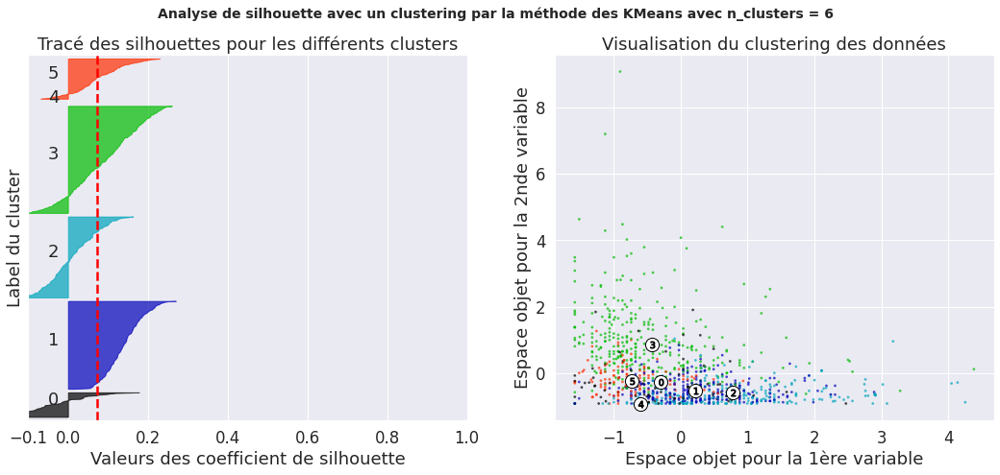

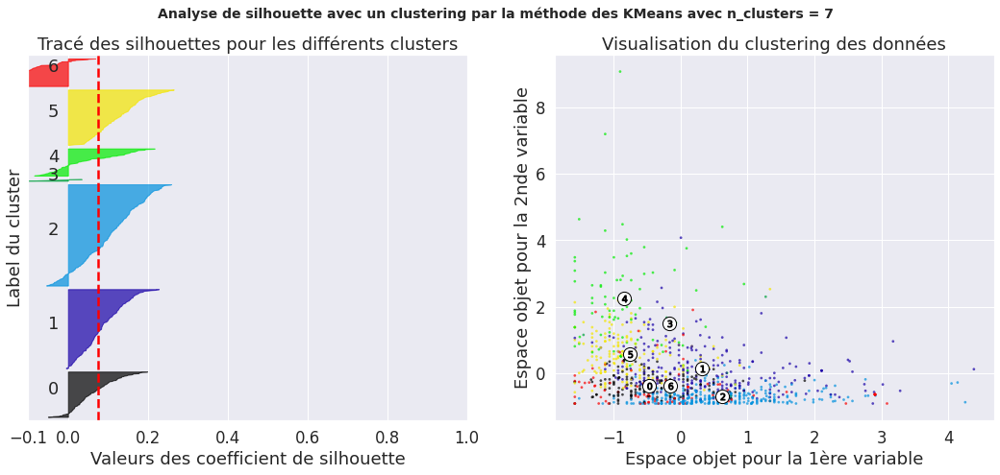

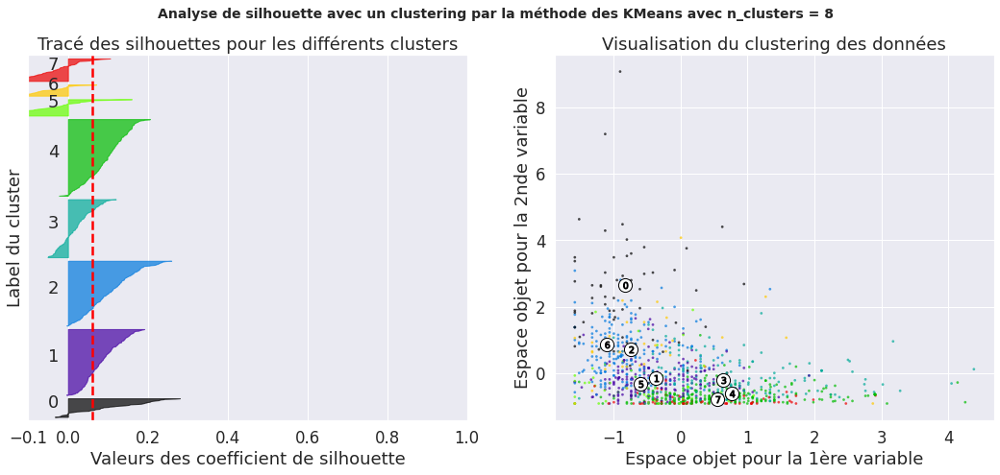

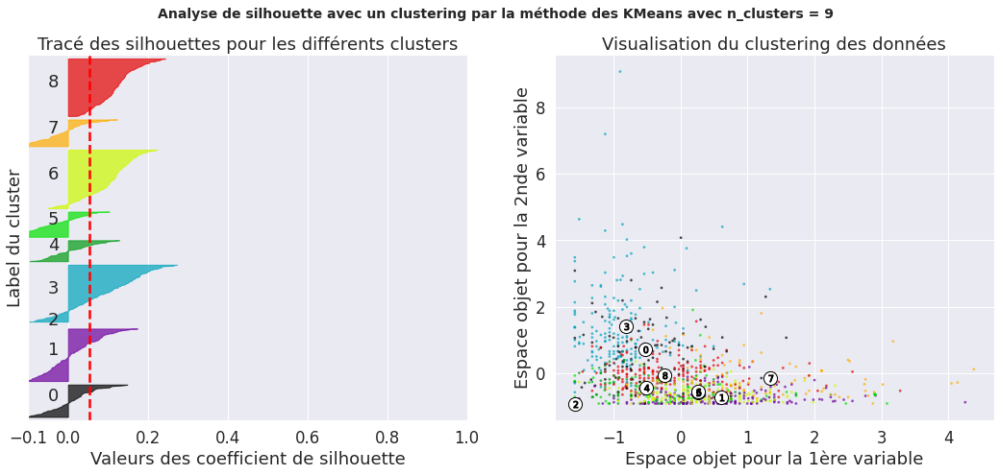

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9]

calculate_silhouette_score(range_n_clusters, ORB_data_BIS, n_init=30)

In [ ]:
#if df['image'] = '9743e6d1c9f3180483825fe4d2e97836.jpg':
#    df['image'].drop


df_clean = df[df['image'] != '9743e6d1c9f3180483825fe4d2e97836.jpg'] 
df_clean.head()

,uniq_id,category,description,image
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg
3,d4684dcdc759dd9cdf41504698d737d8,Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg
4,6325b6870c54cd47be6ebfbffa620ec7,Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg


In [ ]:
df_clean.shape

(1049, 4)

In [ ]:
clustering(ORB_data_BIS, df_clean, n_clusters=3)
df.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


,uniq_id,category,description,image
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg
3,d4684dcdc759dd9cdf41504698d737d8,Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg
4,6325b6870c54cd47be6ebfbffa620ec7,Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg


In [ ]:
df_clean['cluster'].unique()

array([1, 2, 0], dtype=int32)

In [ ]:
df_clean['cluster'].value_counts() 

1    437
2    428
0    184
Name: cluster, dtype: int64

In [ ]:
# Encoding 'category' 
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(df_clean['category'])

le.classes_

le.transform(df_clean['category'])

array([4, 0, 0, ..., 0, 0, 0])

In [ ]:
df_clean['category'].unique()

array([4, 0, 6, 3, 5, 1, 2])

In [ ]:
df_clean['category'] = le.transform(df_clean['category'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df_clean['category'].unique()

array([4, 0, 6, 3, 5, 1, 2])

In [ ]:
df_clean['category'].value_counts()

6    150
5    150
4    150
3    150
1    150
0    150
2    149
Name: category, dtype: int64

In [ ]:
# Matrice de confusion
from sklearn.metrics import confusion_matrix

y_true = df_clean['category']
y_pred = df_clean['cluster']

confusion_matrix(y_true, y_pred)


array([[26, 31, 93,  0,  0,  0,  0],
       [12, 77, 61,  0,  0,  0,  0],
       [55, 65, 29,  0,  0,  0,  0],
       [17, 89, 44,  0,  0,  0,  0],
       [26, 62, 62,  0,  0,  0,  0],
       [33, 58, 59,  0,  0,  0,  0],
       [15, 55, 80,  0,  0,  0,  0]])

In [ ]:
time_start = time.time()

fashion_tsne = TSNE(random_state=RS).fit_transform(ORB_data_BIS) 

(<Figure size 576x576 with 1 Axes>,
 [Text(-8.142324, -19.219635, '0'),
  Text(-5.3342686, 23.991827, '1'),
  Text(7.3953824, -15.258474, '2')])

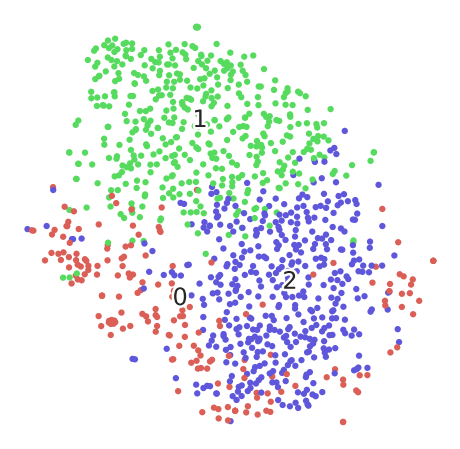

In [ ]:
tnse_visualisation(fashion_tsne, df_clean['cluster'])

# Modèles de Classification des Images: Méthode des Réseaux de Neurones Convolutionnels (CNN)

In [ ]:
# Downloading the model to use
resnet50_model = ResNet50()

102973440/102967424 [==============================] - 3s 0us/step


In [ ]:
resnet50_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [23]:
# Unpickling : reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 6/df_flipkart_final.pkl', 'rb') as pickle_file:
    df_flipkart_final = pickle.load(pickle_file)

In [24]:
df = df_flipkart_final.copy() 

In [ ]:
df.head()

,uniq_id,category,description,image
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg
3,d4684dcdc759dd9cdf41504698d737d8,Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg
4,6325b6870c54cd47be6ebfbffa620ec7,Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg


In [ ]:
# Create a list with the name of the images
list_images = []

for row in df['image']:
    list_images.append(row)
    #print(list_images)
    #row = str(row)

list_images

['55b85ea15a1536d46b7190ad6fff8ce7.jpg',
 '7b72c92c2f6c40268628ec5f14c6d590.jpg',
 '64d5d4a258243731dc7bbb1eef49ad74.jpg',
 'd4684dcdc759dd9cdf41504698d737d8.jpg',
 '6325b6870c54cd47be6ebfbffa620ec7.jpg',
 '893aa5ed55f7cff2eccea7758d7a86bd.jpg',
 'f355cc1ccb08bd0d283ed979b7ee7515.jpg',
 'dd0e3470a7e6ed76fd69c2da27721041.jpg',
 '41384da51732c0b4df3de8f395714fbb.jpg',
 '710ed5f2393a4b9e8823aa0029f71f93.jpg',
 '920154acbe49d3202ed7d2ed2df1ea13.jpg',
 '08452abdadb3db1e686b94a9c52fc7b6.jpg',
 '1e8741b5ae27a513546c94b3f3312aee.jpg',
 '189fa66a5fa6f08d2802a62ecf0be298.jpg',
 'bbb8cdc5406ff60ff06ff64630f2ca47.jpg',
 '1120bc768623572513df956172ffefeb.jpg',
 '5479bb7028827d60000720a2c135976a.jpg',
 '733aa1e801a139fa8dc7be9f0eff5ee0.jpg',
 '62c35de4df27437d3597963fac55a8b6.jpg',
 '33d97d63c037078cd3f08033966d6a88.jpg',
 'd7ca2b06b4f4d3b98c61c377b18a2d6b.jpg',
 'f74476ba64365d97a5be7d375cbf4c7a.jpg',
 'fda50982a672ef8835de5c1cc86f8bfc.jpg',
 '4788f5466992da09024b8ffcc8a5cba4.jpg',
 '653826cd53f1d9

In [ ]:
# Create a list for the features
resnet_features_tot = []

for elt in list_images:
    # Define the path for images
    img_path = pathlib.PurePosixPath('/content/gdrive/My Drive/Colab Notebooks/Projet 6/Flipkart_Images/').joinpath(elt)
    # Change the size for compatibility
    img = image.load_img(img_path, target_size=(224, 224))
    # Transform to array
    img_data = image.img_to_array(img)
    # Expand the shape of the array
    img_data = np.expand_dims(img_data, axis=0)
    # Preprocess the data
    resnet_features = preprocess_input(img_data)
    # Append the list with the features
    resnet_features_tot.append(resnet_features)

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:2766: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


In [ ]:
# Transform the list into an array
resnet_features_np = np.array(resnet_features_tot)
resnet_features_np

array([[[[[  88.061     ,   87.221     ,   82.32      ],
          [  87.061     ,   86.221     ,   81.32      ],
          [  89.061     ,   85.221     ,   81.32      ],
          ...,
          [  53.060997  ,   49.221     ,   51.32      ],
          [  54.060997  ,   50.221     ,   52.32      ],
          [  53.060997  ,   49.221     ,   51.32      ]],

         [[  99.061     ,   91.221     ,   83.32      ],
          [  97.061     ,   89.221     ,   83.32      ],
          [  98.061     ,   90.221     ,   84.32      ],
          ...,
          [  56.060997  ,   52.221     ,   54.32      ],
          [  54.060997  ,   50.221     ,   52.32      ],
          [  55.060997  ,   51.221     ,   53.32      ]],

         [[  99.061     ,   90.221     ,   84.32      ],
          [ 103.061     ,   92.221     ,   86.32      ],
          [ 103.061     ,   92.221     ,   86.32      ],
          ...,
          [  55.060997  ,   51.221     ,   53.32      ],
          [  56.060997  ,   52.221     

In [ ]:
# Shape of the array
resnet_features_np.shape

(1050, 1, 224, 224, 3)

In [ ]:
# Dimensions of the array
resnet_features_np.ndim

5

In [ ]:
# Length of the items in the array
resnet_features_np.itemsize

4

In [ ]:
# Type of data in the array
resnet_features_np.dtype

dtype('float32')

In [ ]:
# Reshape array
array_1 = resnet_features_np.reshape((1050, 1, 50176, 3))

In [ ]:
# Reshape array
array_2 = resnet_features_np.reshape((1050, 1, 150528))

In [ ]:
# Reshape array
array_3 = resnet_features_np.reshape((1050, 150528))

In [ ]:
# Transform array into a data frame
df_CNN_new = pd.DataFrame(array_3)
df_CNN_new.sample(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,150488,150489,150490,150491,150492,150493,150494,150495,150496,150497,150498,150499,150500,150501,150502,150503,150504,150505,150506,150507,150508,150509,150510,150511,150512,150513,150514,150515,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525,150526,150527
261,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,...,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007
698,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,147.061005,136.221008,130.320007,99.060997,106.221001,100.320000,95.060997,107.221001,96.320000,83.060997,91.221001,81.320000,101.060997,101.221001,92.320000,138.061005,130.221008,122.320000,148.061005,137.221008,130.320007,151.061005,138.221008,131.320007,151.061005,...,129.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007
493,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,...,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007
689,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,...,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007
746,151.061005,138.221008,131.320007,151.061005,138.221008,1

In [ ]:
df_CNN_new.shape

(1050, 150528)

In [ ]:
"""We test the normality of the variables"""


data = df_CNN_new
df_normality = pg.normality(data, method='normaltest')
df_normality.head()

,W,pval,normal
0,954.770042,4.724107e-208,False
1,1003.044933,1.554391e-218,False
2,1087.603795,6.758287e-237,False
3,941.367171,3.843405e-205,False
4,992.592315,2.892793e-216,False


In [ ]:
df_normality['normal'].value_counts()

False    150528
Name: normal, dtype: int64

In [ ]:
# Observe the minimal values in the dataframe
df_CNN_new.min().sort_values(ascending=False)

94749    -102.939003
114909   -102.939003
104829   -102.939003
121632   -102.939003
91389    -102.939003
             ...    
75002    -123.680000
75005    -123.680000
75008    -123.680000
75011    -123.680000
75263    -123.680000
Length: 150528, dtype: float64

In [ ]:
"""We apply a log transformation to the variables.

If the variables don't have a normal distribution,
we apply a log transformation.
If the variables have negative and zero values,
we add 1 to have a valid log transformation.
"""


def transformation_log_OK(df):

    global Log_Tfd_Data_new

    # Create a list with all the columns
    list_columns = list(df.columns)#.values)

    print(list_columns)

    def handle_neg_n_zero(num):
        num = num + cst
        return num 

    # Perform Log transformation to bring data into normal or near normal distribution
    # Create a vector with all the min and use it as a constant
    Log_Tfd_Data_new = df[list_columns].apply(lambda x: np.log(x + 1 - min(x)), axis=1).round(3)
 # ou min.x si erreur 
    return Log_Tfd_Data_new

In [ ]:
# Apply a log transformation to the data
transformation_log_OK(df_CNN_new)
Log_Tfd_Data_new.head()

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,150488,150489,150490,150491,150492,150493,150494,150495,150496,150497,150498,150499,150500,150501,150502,150503,150504,150505,150506,150507,150508,150509,150510,150511,150512,150513,150514,150515,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525,150526,150527
0,5.346,5.342,5.318,5.341,5.337,5.313,5.351,5.332,5.313,5.346,5.342,5.318,5.360,5.332,5.313,5.346,5.337,5.323,5.351,5.332,5.313,5.351,5.347,5.323,5.341,5.337,5.313,5.336,5.332,5.308,5.341,5.337,5.313,5.341,5.337,5.313,5.355,5.337,5.318,5.360,...,4.489,4.743,4.109,4.522,4.603,3.910,4.344,4.391,3.254,4.094,4.327,2.991,4.025,4.366,3.254,4.111,4.451,3.494,4.220,4.391,3.329,4.127,4.593,3.890,4.407,4.613,3.826,4.382,4.428,3.398,4.111,4.201,2.557,3.761,4.245,2.766,3.850,4.474,3.523,4.174
1,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,...,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545
2,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,...,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545
3,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,...,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455
4,3.358,3.215,3.045,4.940,4.882,4.898,5.208,5.170,5.170,5.197,5.141,5.147,5.152,5.111,5.112,5.061,5.017,5.017,5.158,5.117,5.118,4.989,4.912,4.934,4.794,4.727,4.745,4.760,4.709,4.673,5.061,5.010,5.024,5.092,5.049,5.050,5.074,5.030,5.030,5.128,...,4.625,4.379,4.453,4.605,4.353,4.453,4.605,4.340,4.441,4.595,4.404,4.465,4.635,4.340,4.406,4.585,4.391,4.465,4.615,4.391,4.465,4.615,4.379,4.453,4.605,4.440,4.532,4.673,4.440,4.532,4.673,4.379,4.476,4.625,4.428,4.542,4.691,4.497,4.594,4.787


In [ ]:
df_CNN_new.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,150488,150489,150490,150491,150492,150493,150494,150495,150496,150497,150498,150499,150500,150501,150502,150503,150504,150505,150506,150507,150508,150509,150510,150511,150512,150513,150514,150515,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525,150526,150527
0,88.060997,87.221001,82.320000,87.060997,86.221001,81.320000,89.060997,85.221001,81.320000,88.060997,87.221001,82.320000,91.060997,85.221001,81.320000,88.060997,86.221001,83.320000,89.060997,85.221001,81.320000,89.060997,88.221001,83.320000,87.060997,86.221001,81.320000,86.060997,85.221001,80.320000,87.060997,86.221001,81.320000,87.060997,86.221001,81.320000,90.060997,86.221001,82.320000,91.060997,...,-32.680000,-6.939003,-60.778999,-29.680000,-21.939003,-71.778999,-44.680000,-40.939003,-95.778999,-61.680000,-45.939003,-101.778999,-65.680000,-42.939003,-95.778999,-60.680000,-35.939003,-88.778999,-53.680000,-40.939003,-93.778999,-59.680000,-22.939003,-72.778999,-39.680000,-20.939003,-75.778999,-41.680000,-37.939003,-91.778999,-60.680000,-54.939003,-108.778999,-78.680000,-51.939003,-105.778999,-74.680000,-33.939003,-87.778999,-56.680000
1,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,...,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007
2,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,...,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007
3,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,...,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007
4,-95.939003,-99.778999,-103.680000,15.060997,7.221001,9.320000,58.060997,51.221001,51.320000,56.06

In [ ]:
# Pickling : writing
with open('df_CNN_new.pkl', 'wb') as pickle_file:
    pickle.dump(df_CNN_new, pickle_file)

In [ ]:
with open('Log_Tfd_Data_new.pkl', 'wb') as pickle_file:
    pickle.dump(Log_Tfd_Data_new, pickle_file)

In [ ]:
files.download('df_CNN_new.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
files.download('Log_Tfd_Data_new.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Unpickling : reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 6/df_CNN_new.pkl', 'rb') as pickle_file:
    df_CNN_new = pickle.load(pickle_file)

In [8]:
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 6/Log_Tfd_Data_new.pkl', 'rb') as pickle_file:
    Log_Tfd_Data_new = pickle.load(pickle_file)

In [ ]:
df_CNN_new.head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,150488,150489,150490,150491,150492,150493,150494,150495,150496,150497,150498,150499,150500,150501,150502,150503,150504,150505,150506,150507,150508,150509,150510,150511,150512,150513,150514,150515,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525,150526,150527
0,88.060997,87.221001,82.320000,87.060997,86.221001,81.320000,89.060997,85.221001,81.320000,88.060997,87.221001,82.320000,91.060997,85.221001,81.320000,88.060997,86.221001,83.320000,89.060997,85.221001,81.320000,89.060997,88.221001,83.320000,87.060997,86.221001,81.320000,86.060997,85.221001,80.320000,87.060997,86.221001,81.320000,87.060997,86.221001,81.320000,90.060997,86.221001,82.320000,91.060997,...,-32.680000,-6.939003,-60.778999,-29.680000,-21.939003,-71.778999,-44.680000,-40.939003,-95.778999,-61.680000,-45.939003,-101.778999,-65.680000,-42.939003,-95.778999,-60.680000,-35.939003,-88.778999,-53.680000,-40.939003,-93.778999,-59.680000,-22.939003,-72.778999,-39.680000,-20.939003,-75.778999,-41.680000,-37.939003,-91.778999,-60.680000,-54.939003,-108.778999,-78.680000,-51.939003,-105.778999,-74.680000,-33.939003,-87.778999,-56.680000
1,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,...,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007
2,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,...,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007
3,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,...,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007,151.061005,138.221008,131.320007
4,-95.939003,-99.778999,-103.680000,15.060997,7.221001,9.320000,58.060997,51.221001,51.320000,56.06

In [ ]:
Log_Tfd_Data_new.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,150488,150489,150490,150491,150492,150493,150494,150495,150496,150497,150498,150499,150500,150501,150502,150503,150504,150505,150506,150507,150508,150509,150510,150511,150512,150513,150514,150515,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525,150526,150527
0,5.346,5.342,5.318,5.341,5.337,5.313,5.351,5.332,5.313,5.346,5.342,5.318,5.360,5.332,5.313,5.346,5.337,5.323,5.351,5.332,5.313,5.351,5.347,5.323,5.341,5.337,5.313,5.336,5.332,5.308,5.341,5.337,5.313,5.341,5.337,5.313,5.355,5.337,5.318,5.360,...,4.489,4.743,4.109,4.522,4.603,3.910,4.344,4.391,3.254,4.094,4.327,2.991,4.025,4.366,3.254,4.111,4.451,3.494,4.220,4.391,3.329,4.127,4.593,3.890,4.407,4.613,3.826,4.382,4.428,3.398,4.111,4.201,2.557,3.761,4.245,2.766,3.850,4.474,3.523,4.174
1,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,...,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545
2,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,...,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545
3,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,...,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455
4,3.358,3.215,3.045,4.940,4.882,4.898,5.208,5.170,5.170,5.197,5.141,5.147,5.152,5.111,5.112,5.061,5.017,5.017,5.158,5.117,5.118,4.989,4.912,4.934,4.794,4.727,4.745,4.760,4.709,4.673,5.061,5.010,5.024,5.092,5.049,5.050,5.074,5.030,5.030,5.128,...,4.625,4.379,4.453,4.605,4.353,4.453,4.605,4.340,4.441,4.595,4.404,4.465,4.635,4.340,4.406,4.585,4.391,4.465,4.615,4.391,4.465,4.615,4.379,4.453,4.605,4.440,4.532,4.673,4.440,4.532,4.673,4.379,4.476,4.625,4.428,4.542,4.691,4.497,4.594,4.787


## Modélisation

In [9]:
# Define a standard scaler
cnn_scaler = StandardScaler()
log_scaler = StandardScaler()

### Réduction de dimension par PCA

#### Données brutes

In [ ]:
cnn_data = cnn_scaler.fit_transform(df_CNN_new)

In [ ]:
cnn_data.shape

(1050, 150528)

In [ ]:
cnn_scaler.mean_.shape

(150528,)

In [ ]:
cnn_data

array([[-1.32004383, -1.13633756, -1.24009474, ..., -3.59791163,
        -4.75173222, -4.36828621],
       [ 0.27247328,  0.26656446,  0.25850476, ...,  0.30877398,
         0.30087839,  0.29123168],
       [ 0.27247328,  0.26656446,  0.25850476, ...,  0.30877398,
         0.30087839,  0.29123168],
       ...,
       [ 0.27247328,  0.26656446,  0.25850476, ..., -1.88741692,
        -1.21937625, -0.65058591],
       [-4.80841422, -5.3175351 , -5.94997815, ..., -3.15445004,
        -3.32090448, -1.04714061],
       [-0.38475612, -0.66870362, -0.26141766, ..., -0.24027387,
        -0.45924901, -0.13010787]])

In [ ]:
cnn_data.shape

(1050, 150528)

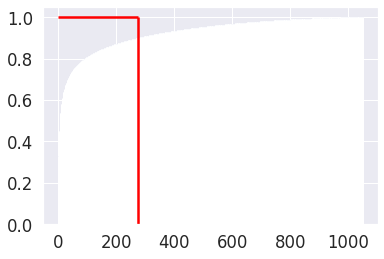

In [ ]:
n_dims = 1049  # X.shape[1] 
model = PCA(n_components=n_dims)
model.fit(cnn_data)

variances = model.explained_variance_ratio_

meilleur_dims = np.argmax(np.cumsum(variances) > 0.90)


plt.bar(range(n_dims), np.cumsum(variances))
plt.hlines(1, 0, meilleur_dims, colors='r') 
plt.vlines(meilleur_dims, 0, 1, colors='r')

In [ ]:
# Shape of matrix of transformation #Ne marche pas pour kernelPCA
model.components_.shape

(1049, 150528)

In [ ]:
# Apply dimension reduction
cnn_data_transformed = model.transform(cnn_data)

# Shape of the new matrix after the PCA
cnn_data_transformed.shape

#### Données transformées au log

In [10]:
log_cnn_data = log_scaler.fit_transform(Log_Tfd_Data_new)

In [11]:
log_cnn_data.shape

(1050, 150528)

In [12]:
log_cnn_data

array([[-0.51602066, -0.41759395, -0.41284765, ..., -2.69100418,
        -4.77019307, -2.93250131],
       [ 0.2816138 ,  0.28890322,  0.26708268, ...,  0.31931548,
         0.30874223,  0.27720949],
       [ 0.2816138 ,  0.28890322,  0.26708268, ...,  0.31931548,
         0.30874223,  0.27720949],
       ...,
       [ 0.2816138 ,  0.28890322,  0.26708268, ..., -0.92424889,
        -0.43487933, -0.09971497],
       [-3.81466282, -4.63200315, -4.86684056, ..., -2.22302435,
        -2.24187974, -0.357241  ],
       [-0.00763826, -0.13806681,  0.06040782, ...,  0.05903457,
        -0.03580243,  0.11567044]])

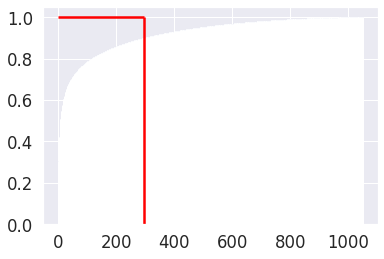

In [13]:
n_dims = 1049  # X.shape[1]
model = PCA(n_components=n_dims)
model.fit(log_cnn_data)

variances = model.explained_variance_ratio_

meilleur_dims = np.argmax(np.cumsum(variances) > 0.90)


plt.bar(range(n_dims), np.cumsum(variances))
plt.hlines(1, 0, meilleur_dims, colors='r')
plt.vlines(meilleur_dims, 0, 1, colors='r')

In [14]:
# Shape of matrix of transformation
model.components_.shape

(1049, 150528)

In [15]:
# Apply dimension reduction
log_cnn_data_transformed = model.transform(log_cnn_data)

# Shape of the new matrix after the PCA
log_cnn_data_transformed.shape

(1050, 1049)

### Clustering

#### Données brutes

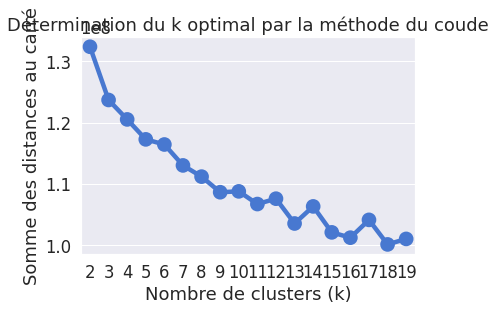

In [ ]:
calculate_MiniBatchKMeans(cnn_data_transformed, range_k, n_init=15)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.20728503797287276
Pour n_clusters = 3 , le silhouette_score moyen est : 0.12161952665811938
Pour n_clusters = 4 , le silhouette_score moyen est : 0.08234959595102927
Pour n_clusters = 5 , le silhouette_score moyen est : 0.10461969556631348
Pour n_clusters = 6 , le silhouette_score moyen est : 0.0973040203687433
Pour n_clusters = 7 , le silhouette_score moyen est : 0.0523269103693402
Pour n_clusters = 8 , le silhouette_score moyen est : 0.05881983941253381
Pour n_clusters = 9 , le silhouette_score moyen est : 0.0734930536420512
Pour n_clusters = 10 , le silhouette_score moyen est : 0.06697549975466587
Pour n_clusters = 11 , le silhouette_score moyen est : 0.07659021351717006
Pour n_clusters = 12 , le silhouette_score moyen est : 0.05820872707662812
Pour n_clusters = 13 , le silhouette_score moyen est : 0.06762699940238666
Pour n_clusters = 14 , le silhouette_score moyen est : 0.07076827343188613
Pour n_clusters = 15 , le silhouette

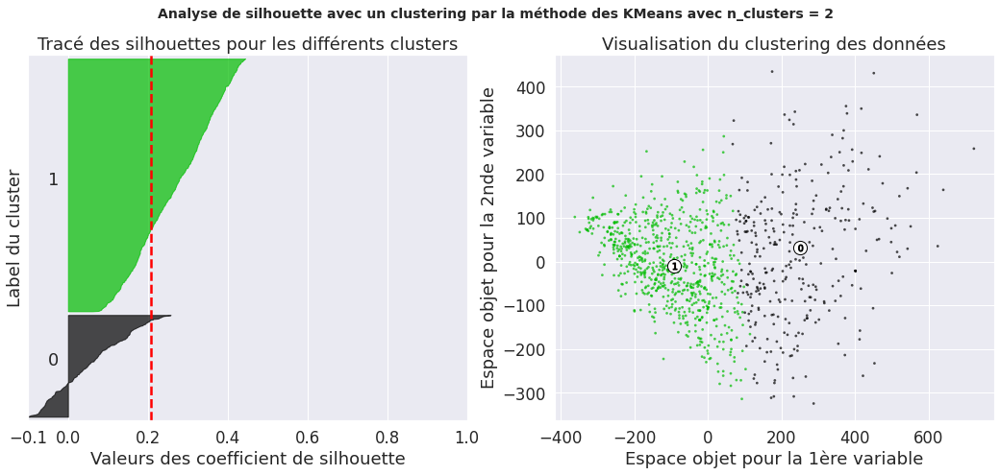

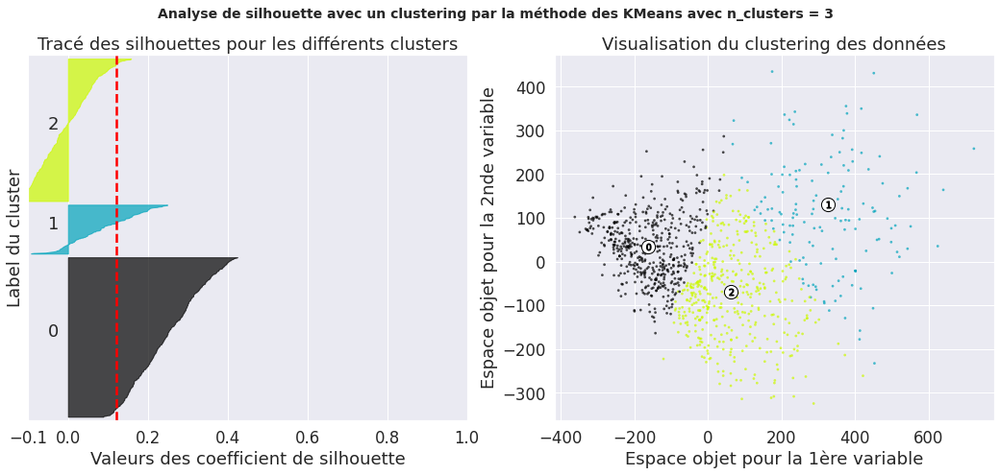

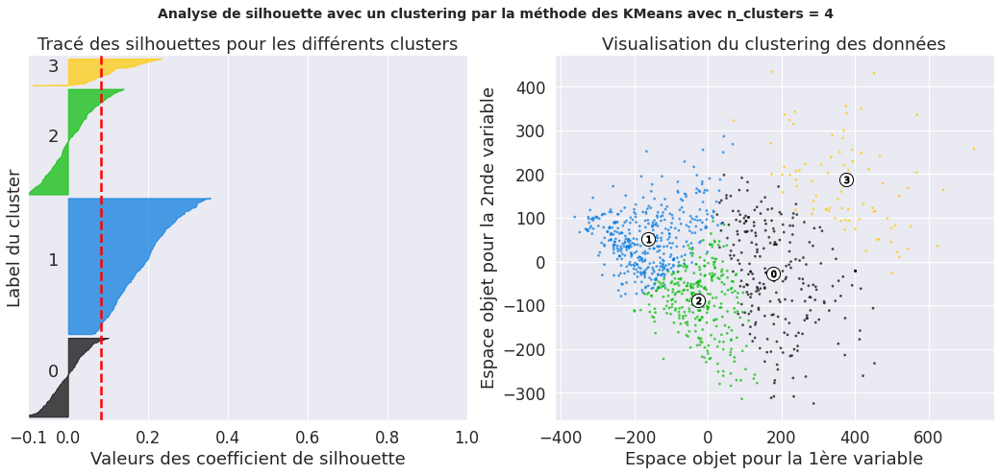

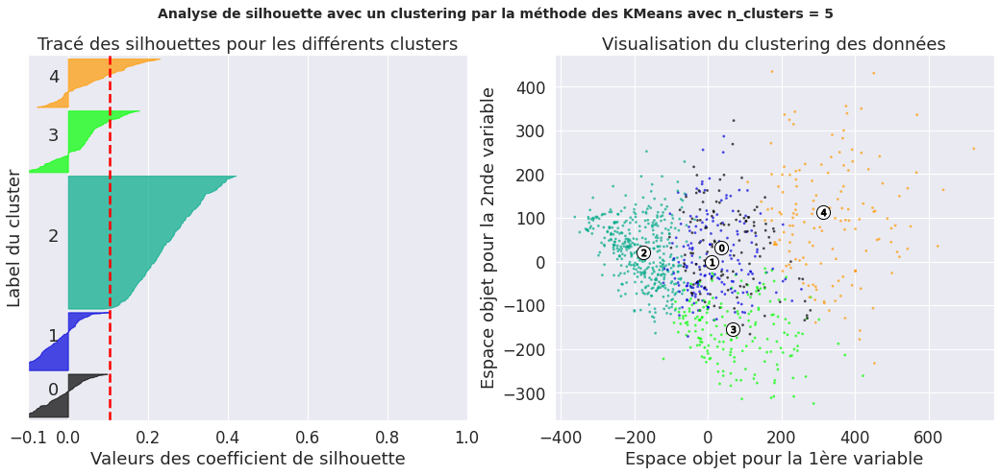

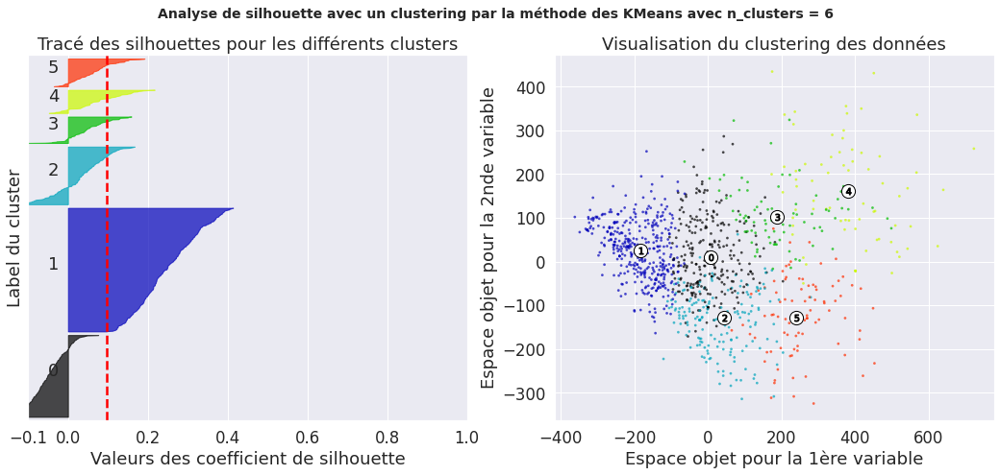

...

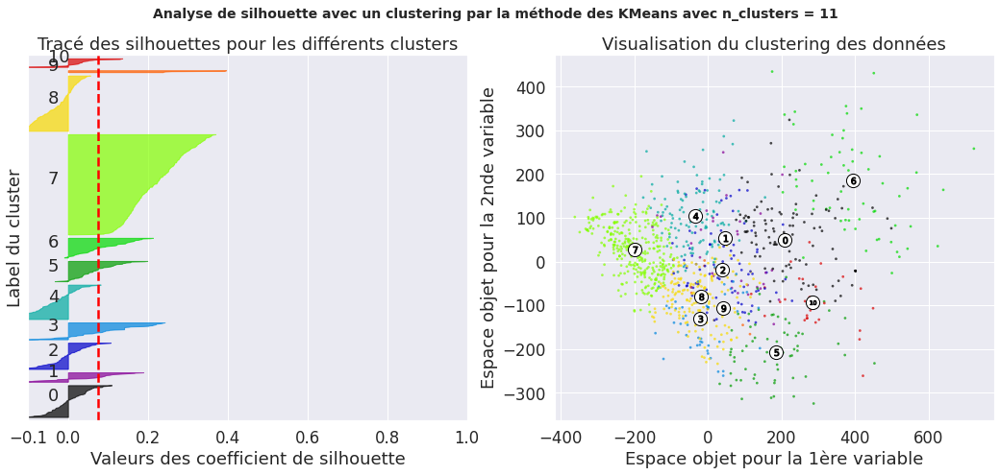

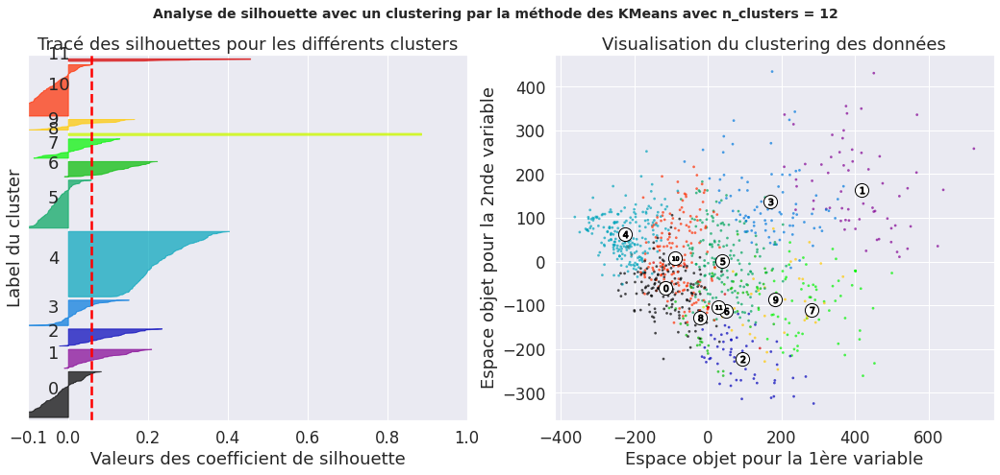

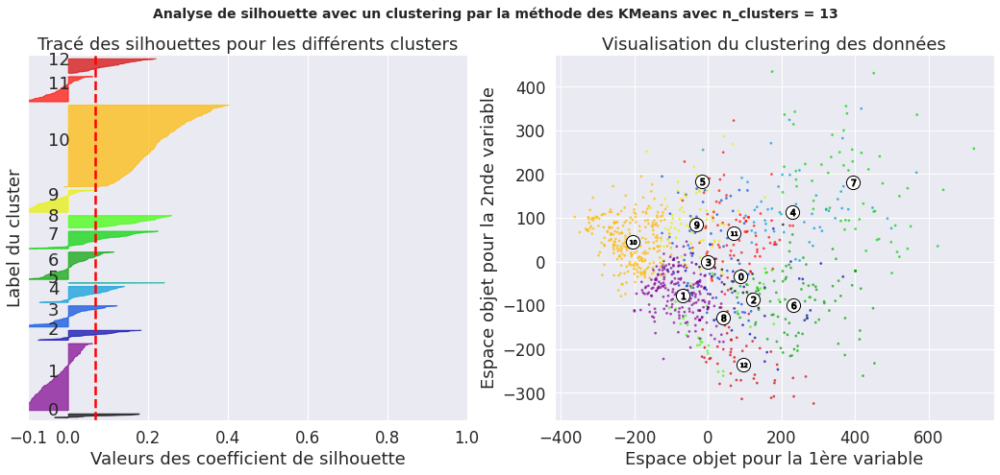

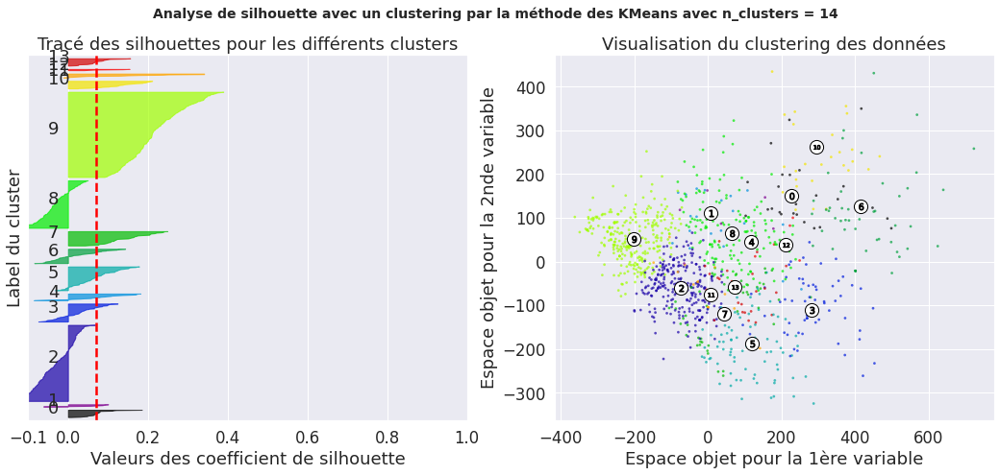

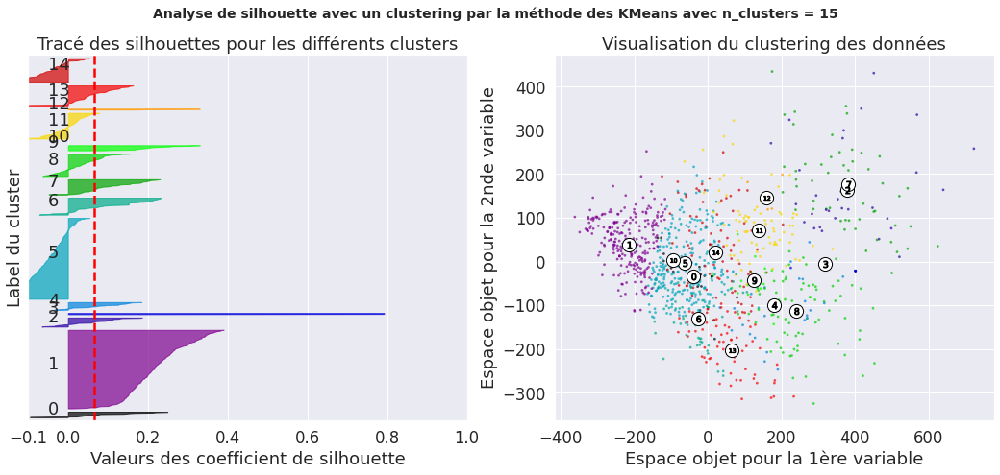

In [ ]:
calculate_silhouette_score(range_n_clusters, cnn_data_transformed, n_init=15)

In [ ]:
clustering(cnn_data_transformed, df, n_clusters=5)
df.head()

,uniq_id,category,description,image,cluster
0,55b85ea15a1536d46b7190ad6fff8ce7,4,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,2
1,7b72c92c2f6c40268628ec5f14c6d590,0,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,3
2,64d5d4a258243731dc7bbb1eef49ad74,0,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,1
3,d4684dcdc759dd9cdf41504698d737d8,4,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,1
4,6325b6870c54cd47be6ebfbffa620ec7,4,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,2


In [ ]:
df['cluster'].unique()

array([2, 3, 1, 4, 0], dtype=int32)

In [ ]:
df['cluster'].value_counts() 

4    384
3    273
2    153
1    128
0    112
Name: cluster, dtype: int64

In [ ]:
# Encoding 'category' 
le = preprocessing.LabelEncoder()
le.fit(df['category'])

le.classes_

le.transform(df['category'])

array([4, 0, 0, ..., 0, 0, 0])

In [ ]:
df['category'].unique()

array([4, 0, 6, 3, 5, 1, 2])

In [ ]:
df['category'] = le.transform(df['category'])

In [ ]:
df['category'].unique()

array([4, 0, 6, 3, 5, 1, 2])

In [ ]:
df['category'].value_counts()

6    150
5    150
4    150
3    150
2    150
1    150
0    150
Name: category, dtype: int64

In [ ]:
# Matrice de confusion
y_true = df['category']
y_pred = df['cluster']

confusion_matrix(y_true, y_pred)

array([[16, 19, 17, 21, 77,  0,  0],
       [17, 39, 41, 18, 35,  0,  0],
       [22,  6, 18, 32, 72,  0,  0],
       [17, 15, 24, 43, 51,  0,  0],
       [27, 38, 34, 20, 31,  0,  0],
       [12,  6,  7, 63, 62,  0,  0],
       [ 1,  5, 12, 76, 56,  0,  0]])

In [ ]:
fashion_tsne = TSNE(random_state=RS).fit_transform(cnn_data_transformed) 

(<Figure size 576x576 with 1 Axes>,
 [Text(-6.2695117, 11.869799, '0'),
  Text(3.6035075, 12.359148, '1'),
  Text(19.715845, 22.30256, '2'),
  Text(13.705963, -6.1978173, '3'),
  Text(-13.587805, -8.599535, '4')])

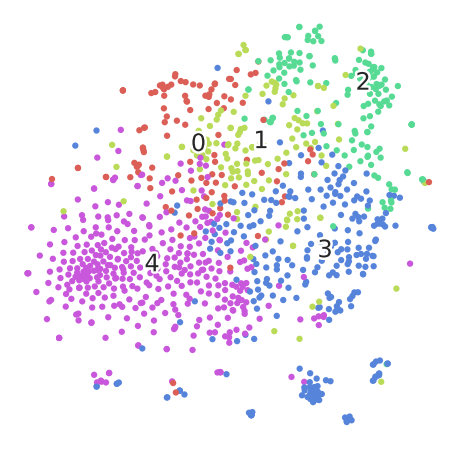

In [ ]:
tnse_visualisation(fashion_tsne, df['cluster']) #y_subset=df['cluster']

#### Données transformées au log

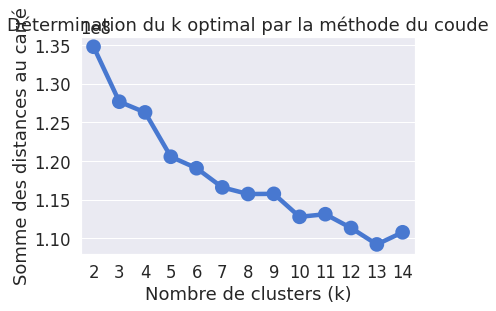

In [34]:
range_k = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

calculate_MiniBatchKMeans(log_cnn_data_transformed, range_k, n_init=15)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.2618638877142364
Pour n_clusters = 3 , le silhouette_score moyen est : 0.15176464017470373
Pour n_clusters = 4 , le silhouette_score moyen est : 0.19103441219725162
Pour n_clusters = 5 , le silhouette_score moyen est : 0.1288427734638383
Pour n_clusters = 6 , le silhouette_score moyen est : 0.13578828641579463
Pour n_clusters = 7 , le silhouette_score moyen est : 0.09769350340081369
Pour n_clusters = 8 , le silhouette_score moyen est : 0.099046949314981
Pour n_clusters = 9 , le silhouette_score moyen est : 0.09523693117625523


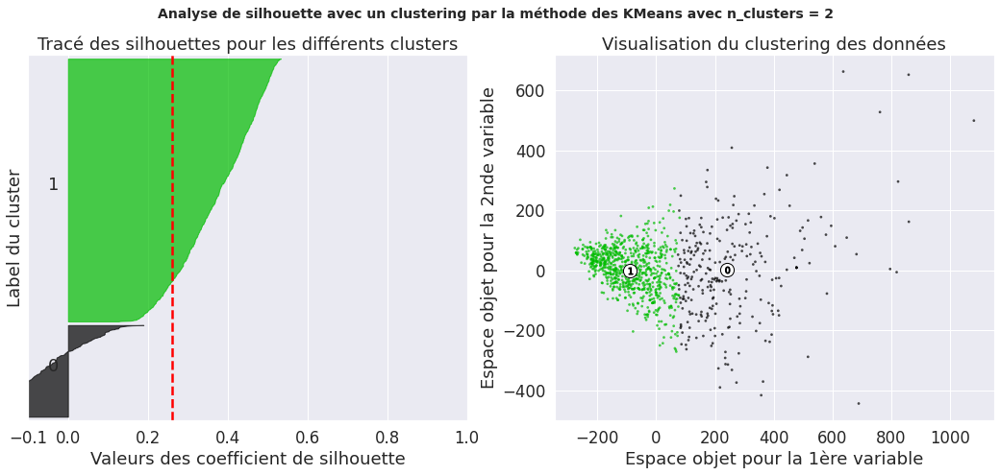

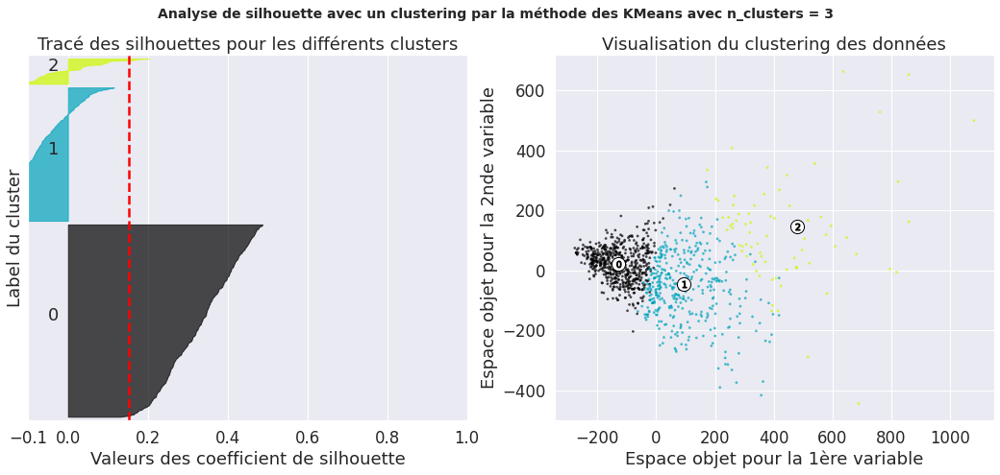

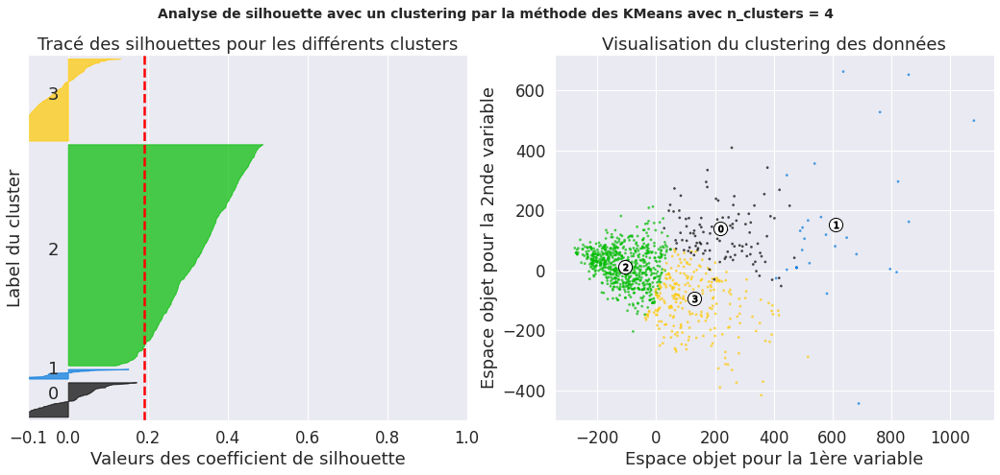

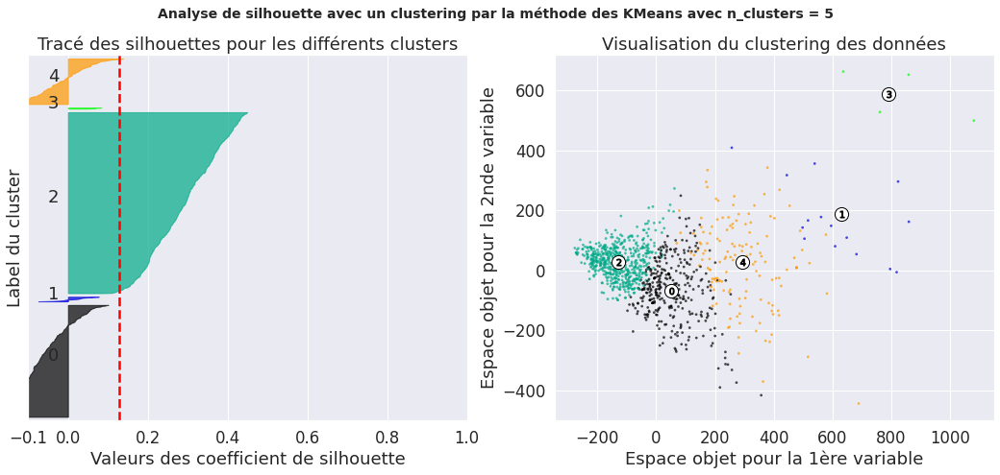

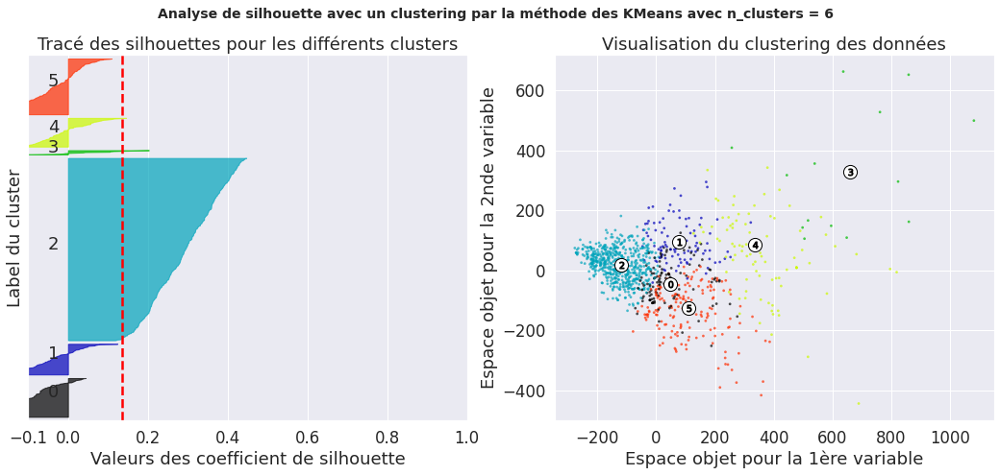

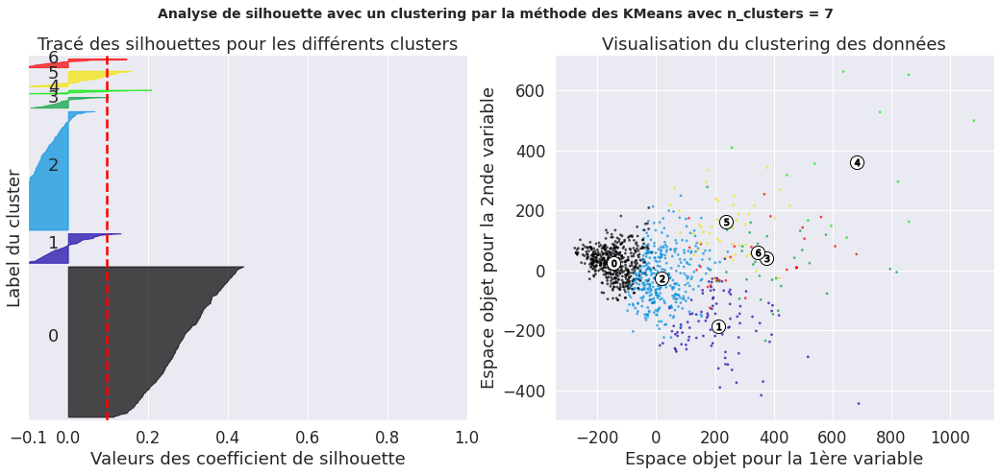

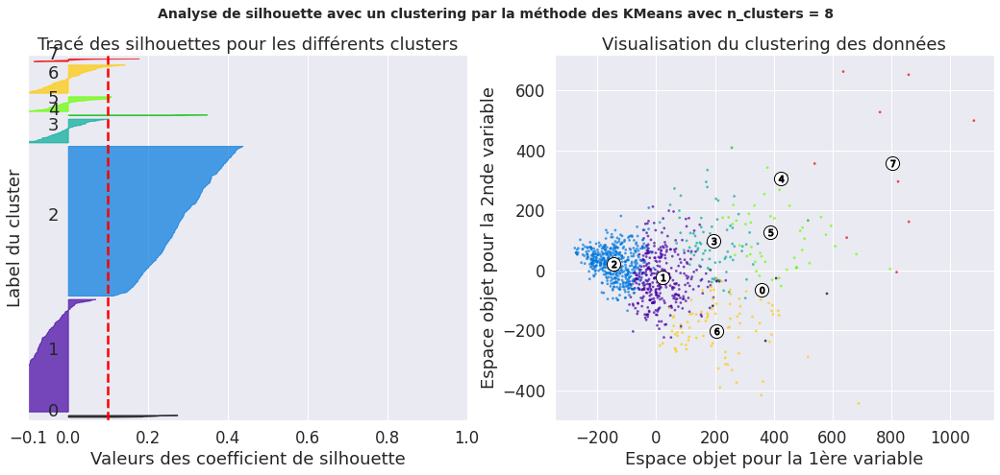

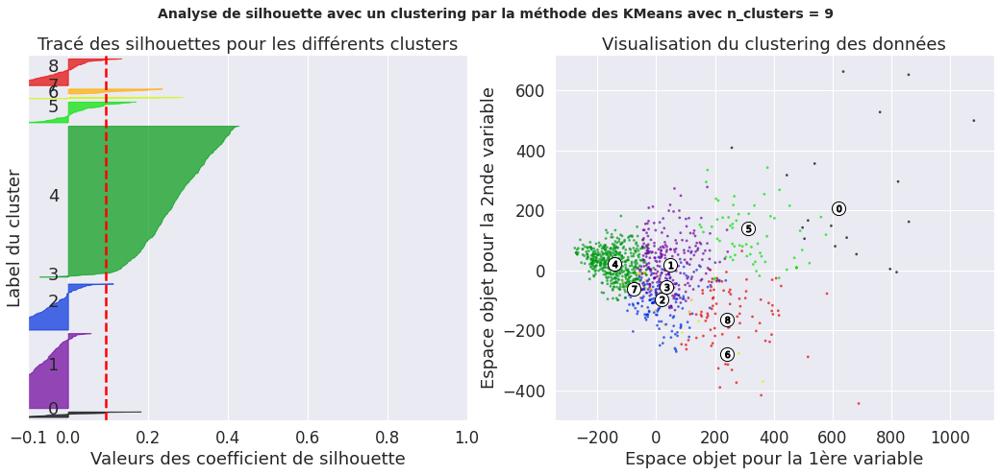

In [35]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9]

calculate_silhouette_score(range_n_clusters, log_cnn_data_transformed, n_init=15)

In [36]:
clustering(log_cnn_data_transformed, df, n_clusters=4)
df.head()

,uniq_id,category,description,image,cluster
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,0
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,1
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,0
3,d4684dcdc759dd9cdf41504698d737d8,Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,0
4,6325b6870c54cd47be6ebfbffa620ec7,Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,0


In [26]:
df['cluster'].unique()

array([3, 0, 1, 2], dtype=int32)

In [37]:
df['cluster'].value_counts() 

1    447
0    443
3    137
2     23
Name: cluster, dtype: int64

In [40]:
# Encoding 'category' 
le = preprocessing.LabelEncoder()
le.fit(df['category'])

le.classes_

le.transform(df['category'])

array([4, 0, 0, ..., 0, 0, 0])

In [41]:
df['category'].unique()

array(['Home Furnishing ', 'Baby Care ', 'Watches ',
       'Home Decor & Festive Needs ', 'Kitchen & Dining ',
       'Beauty and Personal Care ', 'Computers '], dtype=object)

In [42]:
df['category'] = le.transform(df['category'])

In [43]:
df['category'].unique()

array([4, 0, 6, 3, 5, 1, 2])

In [44]:
df['category'].value_counts()

6    150
5    150
4    150
3    150
2    150
1    150
0    150
Name: category, dtype: int64

In [45]:
# Matrice de confusion
y_true = df['category']
y_pred = df['cluster']

confusion_matrix(y_true, y_pred)

array([[47, 89,  0, 14,  0,  0,  0],
       [60, 50,  3, 37,  0,  0,  0],
       [50, 75,  6, 19,  0,  0,  0],
       [65, 59, 11, 15,  0,  0,  0],
       [87, 41,  3, 19,  0,  0,  0],
       [70, 70,  0, 10,  0,  0,  0],
       [64, 63,  0, 23,  0,  0,  0]])

In [38]:
fashion_tsne = TSNE(random_state=RS).fit_transform(log_cnn_data_transformed) 

(<Figure size 576x576 with 1 Axes>,
 [Text(-5.45492, 4.731009, '0'),
  Text(9.842086, -9.807471, '1'),
  Text(1.10772, 27.36431, '2'),
  Text(-7.7144966, 19.55651, '3')])

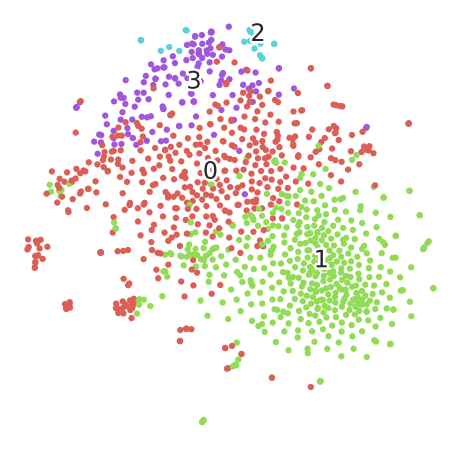

In [39]:
tnse_visualisation(fashion_tsne, df['cluster']) #y_subset=df['cluster']

Observations : Les autres types de Kernel pour une PCA ou la méthode de réduction de dimension TruncatedSVD n'améliorent pas les résultats du clustering. 

# Modèles de Classification du Texte et des Images ensemble

In [145]:
df_description = df_description_tttsup

In [102]:
# Unpickling : reading
with open('/content/gdrive/My Drive/Colab Notebooks/Projet 6/df_description_tttsup.pkl', 'rb') as pickle_file:
    df_description = pickle.load(pickle_file) 

with open('/content/gdrive/My Drive/Colab Notebooks/Projet 6/Log_Tfd_Data_new.pkl', 'rb') as pickle_file:
    df_Log_Tfd_Data_new = pickle.load(pickle_file)

with open('/content/gdrive/My Drive/Colab Notebooks/Projet 6/df_flipkart_final.pkl', 'rb') as pickle_file:
    df_flipkart_final = pickle.load(pickle_file)

In [146]:
df_description.head()

,abstract,add,addit,addit featur,analog,analog watch,babi,babi boy,babi girl,bath,batteri,beauti,best,black,bleach,blue,bodi,box,box number,box sale,boy,brand,brass,bring,brown,capac,care,case,casual,ceram,ceram mug,clasp,clean,code,coff,coff mug,color,color multicolor,colour,combo,...,size,skin,sleev,soft,special,specif,stainless,stainless steel,steel,strap,style,style code,stylish,suitabl,summari,time,towel,trait,type,usb,use,vari,warranti,warranti summari,warranti warranti,wash,watch,watch men,watch woman,water,water resist,wear,weight,white,width,width inch,woman,woman india,ye,year
0,0.365758,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.079895,0.0,0.0,0.000000,0.000000,0.081706,0.053488,0.079607,0.0,0.000000,0.056986,0.0,0.094592,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.054933,0.094034,0.00000,0.0,...,0.000000,0.000000,0.0,0.000000,0.09895,0.047282,0.0,0.0,0.0,0.0,0.077429,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.054748,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.574935,0.0,0.000000,0.0,0.0,0.000000,0.160438,0.000000,0.051064,0.075999,0.0,0.072953,0.054404,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052444,0.000000,0.00000,0.0,...,0.067932,0.000000,0.0,0.000000,0.00000,0.045140,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.570797,0.0,0.052266,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.070502,0.087768,0.075195,0.0,0.076834,0.000000
2,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.132910,0.0,0.000000,0.0,0.0,0.063796,0.000000,0.000000,0.035414,0.052707,0.0,0.050594,0.075460,0.0,0.062628,0.0,0.0,0.097790,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.072742,0.000000,0.00000,0.0,...,0.188449,0.066455,0.0,0.177014,0.00000,0.031305,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.725746,0.0,0.036248,0.0,0.047772,0.13291,0.000000,0.0,0.0,0.156448,0.0,0.0,0.0,0.04875,0.0,0.0,0.051095,0.000000,0.048895,0.060869,0.052149,0.0,0.000000,0.061899
3,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.092883,0.000000,0.000000,0.051561,0.076738,0.0,0.000000,0.054933,0.0,0.000000,0.0,0.0,0.071188,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052954,0.090646,0.00000,0.0,...,0.205778,0.000000,0.0,0.000000,0.00000,0.045579,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.052775,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.075927,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.213564,0.177244,0.000000,0.0,0.077582,0.000000
4,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.081075,0.000000,0.000000,0.045006,0.066982,0.0,0.000000,0.047949,0.0,0.000000,0.0,0.0,0.062138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.046222,0.000000,0.07536,0.0,...,0.239490,0.000000,0.0,0.000000,0.00000,0.039784,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.046066,0.0,0.060711,0.00000,0.070999,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.064933,0.230816,0.186414,0.154711,0.000000,0.0,0.067719,0.000000


In [94]:
df_flipkart_final.head()

,uniq_id,category,description,image
0,55b85ea15a1536d46b7190ad6fff8ce7,Home Furnishing,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,7b72c92c2f6c40268628ec5f14c6d590,Baby Care,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg
2,64d5d4a258243731dc7bbb1eef49ad74,Baby Care,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg
3,d4684dcdc759dd9cdf41504698d737d8,Home Furnishing,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg
4,6325b6870c54cd47be6ebfbffa620ec7,Home Furnishing,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg


In [147]:
df = df_flipkart_final.copy()

## Merge the textual and visual features in one data frame 

In [148]:
# Create a list with the unique IDs of the images
list_id = []

for row in df['uniq_id']:
    list_id.append(row)

list_id

['55b85ea15a1536d46b7190ad6fff8ce7',
 '7b72c92c2f6c40268628ec5f14c6d590',
 '64d5d4a258243731dc7bbb1eef49ad74',
 'd4684dcdc759dd9cdf41504698d737d8',
 '6325b6870c54cd47be6ebfbffa620ec7',
 '893aa5ed55f7cff2eccea7758d7a86bd',
 'f355cc1ccb08bd0d283ed979b7ee7515',
 'dd0e3470a7e6ed76fd69c2da27721041',
 '41384da51732c0b4df3de8f395714fbb',
 '710ed5f2393a4b9e8823aa0029f71f93',
 '920154acbe49d3202ed7d2ed2df1ea13',
 '08452abdadb3db1e686b94a9c52fc7b6',
 '1e8741b5ae27a513546c94b3f3312aee',
 '189fa66a5fa6f08d2802a62ecf0be298',
 'bbb8cdc5406ff60ff06ff64630f2ca47',
 '1120bc768623572513df956172ffefeb',
 '5479bb7028827d60000720a2c135976a',
 '733aa1e801a139fa8dc7be9f0eff5ee0',
 '62c35de4df27437d3597963fac55a8b6',
 '33d97d63c037078cd3f08033966d6a88',
 'd7ca2b06b4f4d3b98c61c377b18a2d6b',
 'f74476ba64365d97a5be7d375cbf4c7a',
 'fda50982a672ef8835de5c1cc86f8bfc',
 '4788f5466992da09024b8ffcc8a5cba4',
 '653826cd53f1d9e2c086c0ac7846ef70',
 '3c74db45cbfc14a78b8466dca494b3bb',
 '4aa047f14885c74f155ce5f973e14dff',
 

In [149]:
# Add a column to df_description (texte data) with the unique IDs of the images
df_description['uniq_id'] = list_id

In [150]:
# Make 'uniq_id' the first column
first_col = df_description.pop('uniq_id')
	
df_description.insert(0, 'uniq_id', first_col)

In [151]:
df_description.head()

,uniq_id,abstract,add,addit,addit featur,analog,analog watch,babi,babi boy,babi girl,bath,batteri,beauti,best,black,bleach,blue,bodi,box,box number,box sale,boy,brand,brass,bring,brown,capac,care,case,casual,ceram,ceram mug,clasp,clean,code,coff,coff mug,color,color multicolor,colour,...,size,skin,sleev,soft,special,specif,stainless,stainless steel,steel,strap,style,style code,stylish,suitabl,summari,time,towel,trait,type,usb,use,vari,warranti,warranti summari,warranti warranti,wash,watch,watch men,watch woman,water,water resist,wear,weight,white,width,width inch,woman,woman india,ye,year
0,55b85ea15a1536d46b7190ad6fff8ce7,0.365758,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.079895,0.0,0.0,0.000000,0.000000,0.081706,0.053488,0.079607,0.0,0.000000,0.056986,0.0,0.094592,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.054933,0.094034,0.00000,...,0.000000,0.000000,0.0,0.000000,0.09895,0.047282,0.0,0.0,0.0,0.0,0.077429,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.054748,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
1,7b72c92c2f6c40268628ec5f14c6d590,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.574935,0.0,0.000000,0.0,0.0,0.000000,0.160438,0.000000,0.051064,0.075999,0.0,0.072953,0.054404,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052444,0.000000,0.00000,...,0.067932,0.000000,0.0,0.000000,0.00000,0.045140,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.570797,0.0,0.052266,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.070502,0.087768,0.075195,0.0,0.076834,0.000000
2,64d5d4a258243731dc7bbb1eef49ad74,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.132910,0.0,0.000000,0.0,0.0,0.063796,0.000000,0.000000,0.035414,0.052707,0.0,0.050594,0.075460,0.0,0.062628,0.0,0.0,0.097790,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.072742,0.000000,0.00000,...,0.188449,0.066455,0.0,0.177014,0.00000,0.031305,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.725746,0.0,0.036248,0.0,0.047772,0.13291,0.000000,0.0,0.0,0.156448,0.0,0.0,0.0,0.04875,0.0,0.0,0.051095,0.000000,0.048895,0.060869,0.052149,0.0,0.000000,0.061899
3,d4684dcdc759dd9cdf41504698d737d8,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.092883,0.000000,0.000000,0.051561,0.076738,0.0,0.000000,0.054933,0.0,0.000000,0.0,0.0,0.071188,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052954,0.090646,0.00000,...,0.205778,0.000000,0.0,0.000000,0.00000,0.045579,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.052775,0.0,0.000000,0.00000,0.000000,0.0,0.0,0.075927,0.0,0.0,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.213564,0.177244,0.000000,0.0,0.077582,0.000000
4,6325b6870c54cd47be6ebfbffa620ec7,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.081075,0.000000,0.000000,0.045006,0.066982,0.0,0.000000,0.047949,0.0,0.000000,0.0,0.0,0.062138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.046222,0.000000,0.07536,...,0.239490,0.000000,0.0,0.000000,0.00000,0.039784,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.046066,0.0,0.060711,0.00000,0.070999,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.064933,0.230816,0.186414,0.154711,0.000000,0.0,0.067719,0.000000


In [152]:
df_description.shape

(1050, 210)

In [153]:
df_Log_Tfd_Data_new.shape

(1050, 150529)

In [154]:
# Add a column to df_Log_Tfd_Data_new (image data) with the unique IDs of the images
df_Log_Tfd_Data_new['uniq_id'] = list_id

In [155]:
# Make 'uniq_id' the first column
first_col = df_Log_Tfd_Data_new.pop('uniq_id')
	
df_Log_Tfd_Data_new.insert(0, 'uniq_id', first_col)

In [156]:
df_Log_Tfd_Data_new.head()

,uniq_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,...,150488,150489,150490,150491,150492,150493,150494,150495,150496,150497,150498,150499,150500,150501,150502,150503,150504,150505,150506,150507,150508,150509,150510,150511,150512,150513,150514,150515,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525,150526,150527
0,55b85ea15a1536d46b7190ad6fff8ce7,5.346,5.342,5.318,5.341,5.337,5.313,5.351,5.332,5.313,5.346,5.342,5.318,5.360,5.332,5.313,5.346,5.337,5.323,5.351,5.332,5.313,5.351,5.347,5.323,5.341,5.337,5.313,5.336,5.332,5.308,5.341,5.337,5.313,5.341,5.337,5.313,5.355,5.337,5.318,...,4.489,4.743,4.109,4.522,4.603,3.910,4.344,4.391,3.254,4.094,4.327,2.991,4.025,4.366,3.254,4.111,4.451,3.494,4.220,4.391,3.329,4.127,4.593,3.890,4.407,4.613,3.826,4.382,4.428,3.398,4.111,4.201,2.557,3.761,4.245,2.766,3.850,4.474,3.523,4.174
1,7b72c92c2f6c40268628ec5f14c6d590,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,...,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545
2,64d5d4a258243731dc7bbb1eef49ad74,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,...,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545
3,d4684dcdc759dd9cdf41504698d737d8,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,...,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455
4,6325b6870c54cd47be6ebfbffa620ec7,3.358,3.215,3.045,4.940,4.882,4.898,5.208,5.170,5.170,5.197,5.141,5.147,5.152,5.111,5.112,5.061,5.017,5.017,5.158,5.117,5.118,4.989,4.912,4.934,4.794,4.727,4.745,4.760,4.709,4.673,5.061,5.010,5.024,5.092,5.049,5.050,5.074,5.030,5.030,...,4.625,4.379,4.453,4.605,4.353,4.453,4.605,4.340,4.441,4.595,4.404,4.465,4.635,4.340,4.406,4.585,4.391,4.465,4.615,4.391,4.465,4.615,4.379,4.453,4.605,4.440,4.532,4.673,4.440,4.532,4.673,4.379,4.476,4.625,4.428,4.542,4.691,4.497,4.594,4.787


In [157]:
# Merge both data frames on 'uniq_id'
df_final = df_description.merge(df_Log_Tfd_Data_new, on=['uniq_id'], how='outer')
df_final.head()

,uniq_id,abstract,add,addit,addit featur,analog,analog watch,babi,babi boy,babi girl,bath,batteri,beauti,best,black,bleach,blue,bodi,box,box number,box sale,boy,brand,brass,bring,brown,capac,care,case,casual,ceram,ceram mug,clasp,clean,code,coff,coff mug,color,color multicolor,colour,...,150488,150489,150490,150491,150492,150493,150494,150495,150496,150497,150498,150499,150500,150501,150502,150503,150504,150505,150506,150507,150508,150509,150510,150511,150512,150513,150514,150515,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525,150526,150527
0,55b85ea15a1536d46b7190ad6fff8ce7,0.365758,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.079895,0.0,0.0,0.000000,0.000000,0.081706,0.053488,0.079607,0.0,0.000000,0.056986,0.0,0.094592,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.054933,0.094034,0.00000,...,4.489,4.743,4.109,4.522,4.603,3.910,4.344,4.391,3.254,4.094,4.327,2.991,4.025,4.366,3.254,4.111,4.451,3.494,4.220,4.391,3.329,4.127,4.593,3.890,4.407,4.613,3.826,4.382,4.428,3.398,4.111,4.201,2.557,3.761,4.245,2.766,3.850,4.474,3.523,4.174
1,7b72c92c2f6c40268628ec5f14c6d590,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.574935,0.0,0.000000,0.0,0.0,0.000000,0.160438,0.000000,0.051064,0.075999,0.0,0.072953,0.054404,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052444,0.000000,0.00000,...,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545
2,64d5d4a258243731dc7bbb1eef49ad74,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.132910,0.0,0.000000,0.0,0.0,0.063796,0.000000,0.000000,0.035414,0.052707,0.0,0.050594,0.075460,0.0,0.062628,0.0,0.0,0.097790,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.072742,0.000000,0.00000,...,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545
3,d4684dcdc759dd9cdf41504698d737d8,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.092883,0.000000,0.000000,0.051561,0.076738,0.0,0.000000,0.054933,0.0,0.000000,0.0,0.0,0.071188,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052954,0.090646,0.00000,...,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455
4,6325b6870c54cd47be6ebfbffa620ec7,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.081075,0.000000,0.000000,0.045006,0.066982,0.0,0.000000,0.047949,0.0,0.000000,0.0,0.0,0.062138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.046222,0.000000,0.07536,...,4.625,4.379,4.453,4.605,4.353,4.453,4.605,4.340,4.441,4.595,4.404,4.465,4.635,4.340,4.406,4.585,4.391,4.465,4.615,4.391,4.465,4.615,4.379,4.453,4.605,4.440,4.532,4.673,4.440,4.532,4.673,4.379,4.476,4.625,4.428,4.542,4.691,4.497,4.594,4.787


In [158]:
# Delete the column 'uniq_id'
df_final.drop(columns='uniq_id', axis = 1, inplace = True)
df_final.head()

,abstract,add,addit,addit featur,analog,analog watch,babi,babi boy,babi girl,bath,batteri,beauti,best,black,bleach,blue,bodi,box,box number,box sale,boy,brand,brass,bring,brown,capac,care,case,casual,ceram,ceram mug,clasp,clean,code,coff,coff mug,color,color multicolor,colour,combo,...,150488,150489,150490,150491,150492,150493,150494,150495,150496,150497,150498,150499,150500,150501,150502,150503,150504,150505,150506,150507,150508,150509,150510,150511,150512,150513,150514,150515,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525,150526,150527
0,0.365758,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.079895,0.0,0.0,0.000000,0.000000,0.081706,0.053488,0.079607,0.0,0.000000,0.056986,0.0,0.094592,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.054933,0.094034,0.00000,0.0,...,4.489,4.743,4.109,4.522,4.603,3.910,4.344,4.391,3.254,4.094,4.327,2.991,4.025,4.366,3.254,4.111,4.451,3.494,4.220,4.391,3.329,4.127,4.593,3.890,4.407,4.613,3.826,4.382,4.428,3.398,4.111,4.201,2.557,3.761,4.245,2.766,3.850,4.474,3.523,4.174
1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.574935,0.0,0.000000,0.0,0.0,0.000000,0.160438,0.000000,0.051064,0.075999,0.0,0.072953,0.054404,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052444,0.000000,0.00000,0.0,...,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545
2,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.132910,0.0,0.000000,0.0,0.0,0.063796,0.000000,0.000000,0.035414,0.052707,0.0,0.050594,0.075460,0.0,0.062628,0.0,0.0,0.097790,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.072742,0.000000,0.00000,0.0,...,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545,5.619,5.572,5.545
3,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.092883,0.000000,0.000000,0.051561,0.076738,0.0,0.000000,0.054933,0.0,0.000000,0.0,0.0,0.071188,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052954,0.090646,0.00000,0.0,...,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455,5.536,5.484,5.455
4,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.081075,0.000000,0.000000,0.045006,0.066982,0.0,0.000000,0.047949,0.0,0.000000,0.0,0.0,0.062138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.046222,0.000000,0.07536,0.0,...,4.625,4.379,4.453,4.605,4.353,4.453,4.605,4.340,4.441,4.595,4.404,4.465,4.635,4.340,4.406,4.585,4.391,4.465,4.615,4.391,4.465,4.615,4.379,4.453,4.605,4.440,4.532,4.673,4.440,4.532,4.673,4.379,4.476,4.625,4.428,4.542,4.691,4.497,4.594,4.787


## Reduce the dimensions : PCA

In [159]:
df_final.shape

(1050, 150737)

In [160]:
# Define a standard scaler
data_final_scaler = StandardScaler()

In [161]:
# Standardise the data
data_final = data_final_scaler.fit_transform(df_final)

In [162]:
data_final.shape

(1050, 150737)

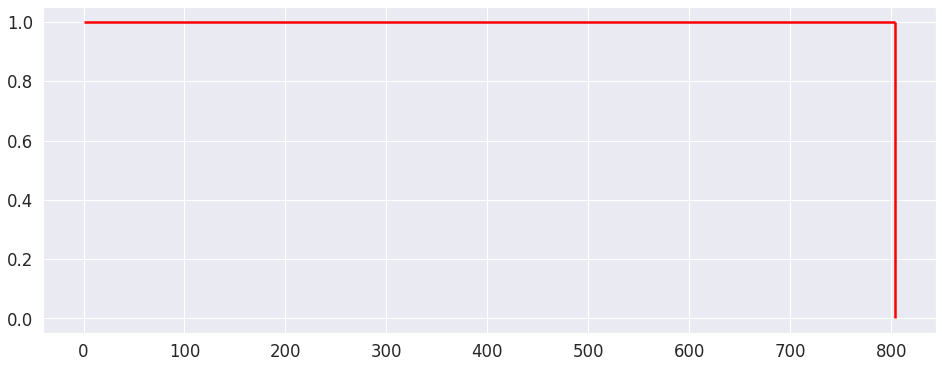

In [163]:
n_dims = 1049  # data.shape[1]
# svd_solver : auto, full, arpack, randomized
#'randomized' : results close to arpack/auto (1050)
#'full': results close to arpack/auto (1050)
#'arpack': same results as auto (1049)
model = PCA(svd_solver='auto')#, n_components=n_dims) 
model.fit(data_final)

variances = model.explained_variance_ratio_

meilleur_dims = np.argmax(np.cumsum(variances) > 0.99)


#plt.bar(range(n_dims), np.cumsum(variances))
plt.hlines(1, 0, meilleur_dims, colors='r')
plt.vlines(meilleur_dims, 0, 1, colors='r')

In [164]:
# Shape of the matrix that does the transformation 
model.components_.shape

(1050, 150737)

In [165]:
# Shape of the matrix with the data
data_final.shape

(1050, 150737)

In [166]:
# Apply the reduction of dimension (PCA)
data_final_transformed = model.transform(data_final)

# Shape of the new matrix after the PCA
data_final_transformed.shape

(1050, 1050)

## Clustering

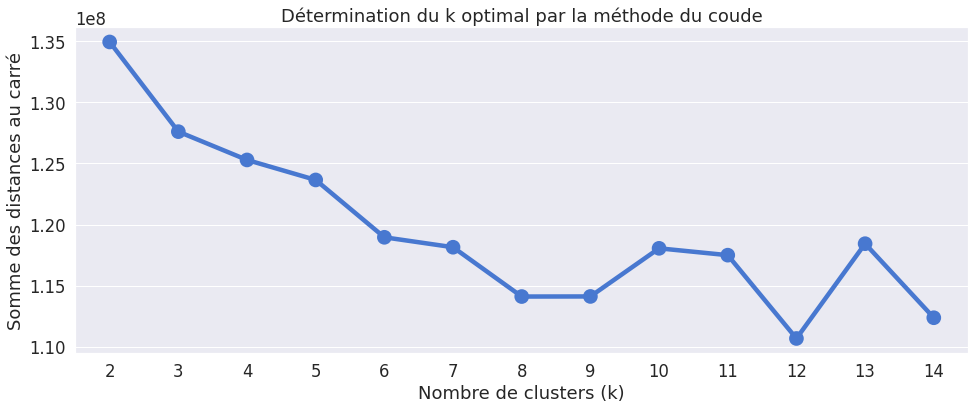

In [123]:
calculate_MiniBatchKMeans(data_final_transformed, range_k, n_init=30)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.2621275948042942
Pour n_clusters = 3 , le silhouette_score moyen est : 0.19486657456164347
Pour n_clusters = 4 , le silhouette_score moyen est : 0.08830422621716384
Pour n_clusters = 5 , le silhouette_score moyen est : 0.12880249510396727
Pour n_clusters = 6 , le silhouette_score moyen est : 0.07624491126278421
Pour n_clusters = 7 , le silhouette_score moyen est : 0.09340844367605422
Pour n_clusters = 8 , le silhouette_score moyen est : 0.07603714206206348
Pour n_clusters = 9 , le silhouette_score moyen est : -0.05367381443366244


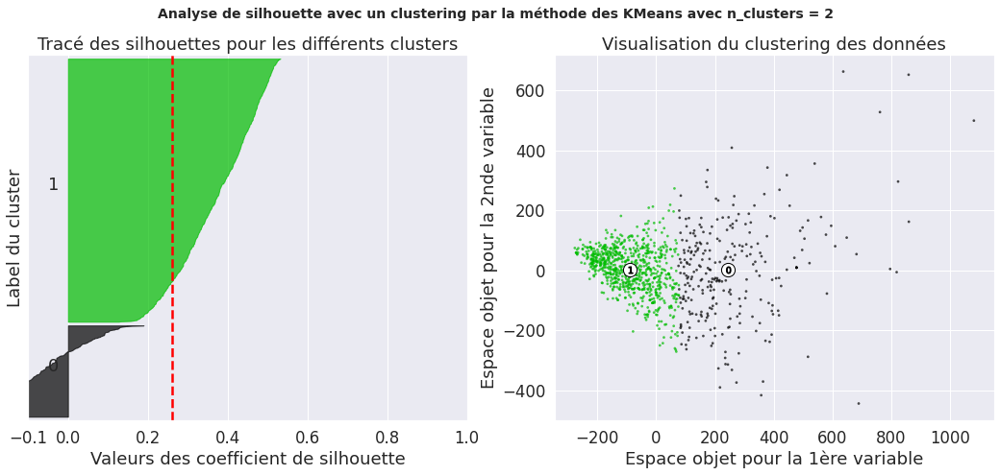

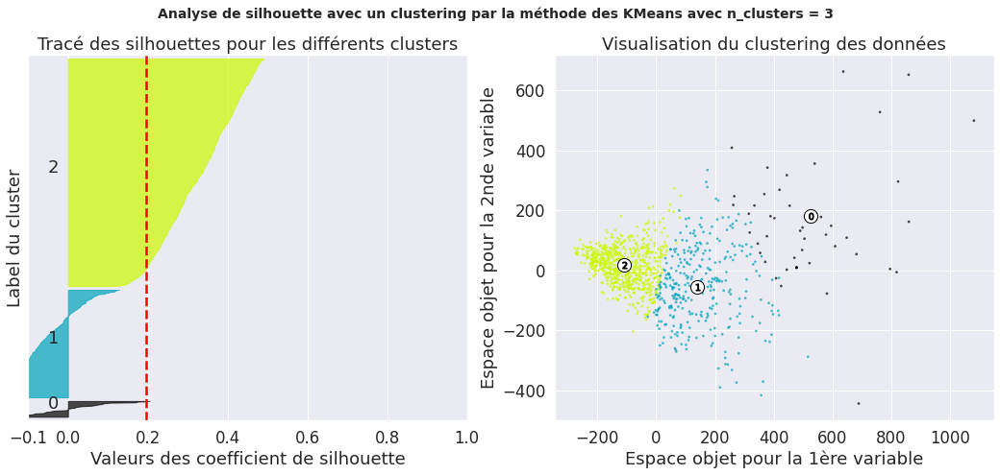

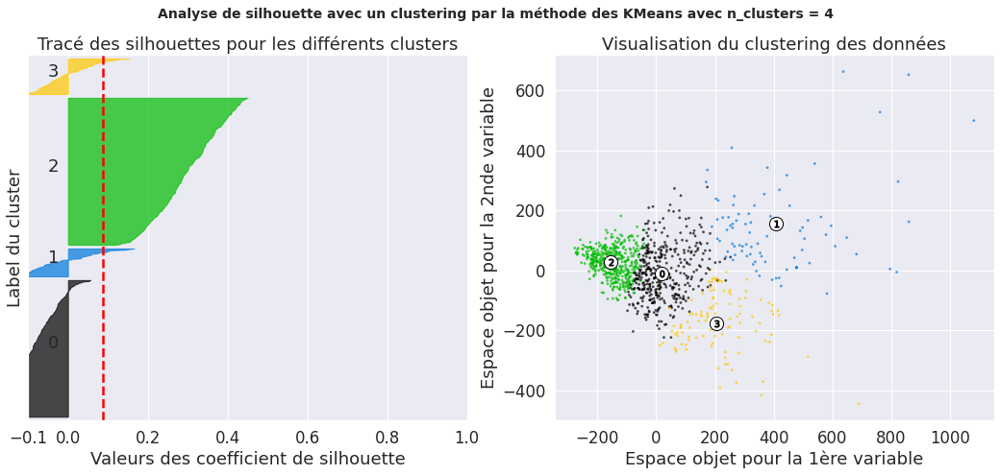

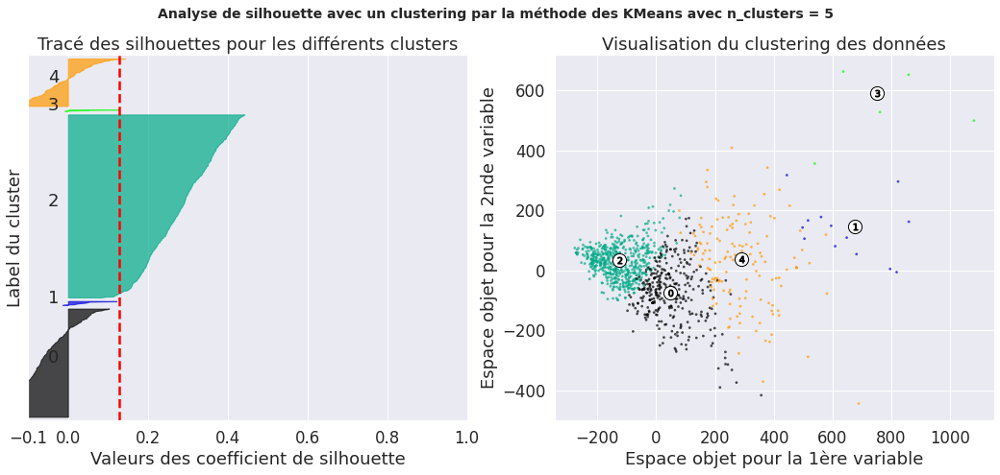

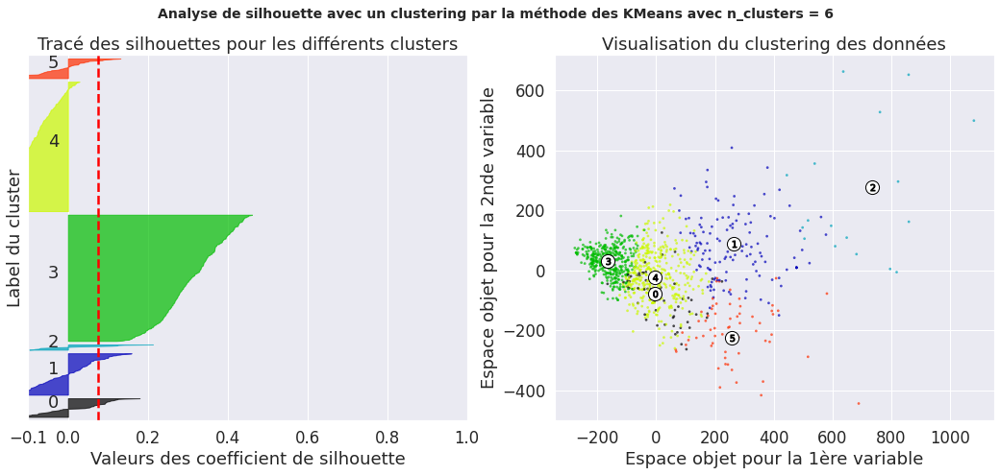

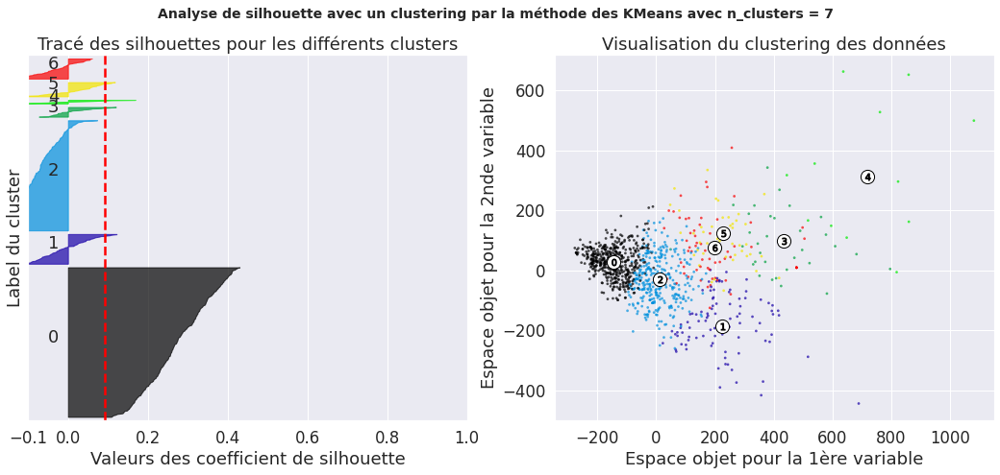

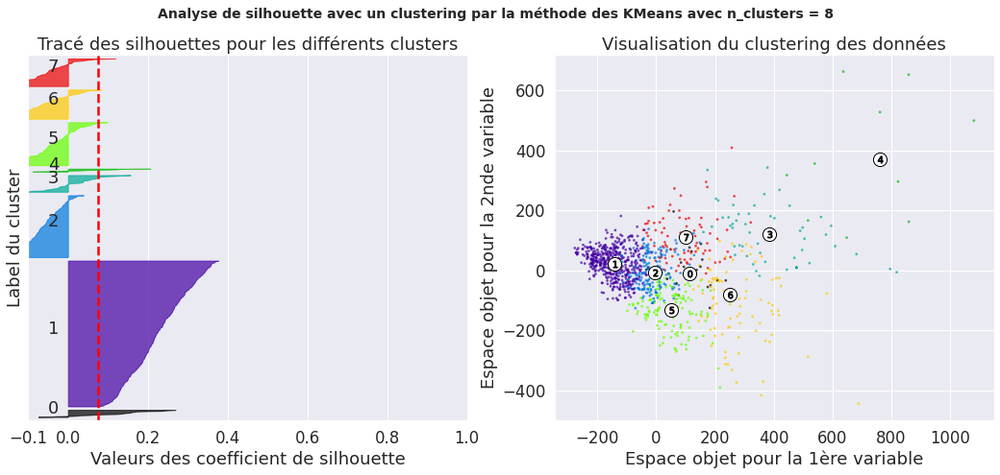

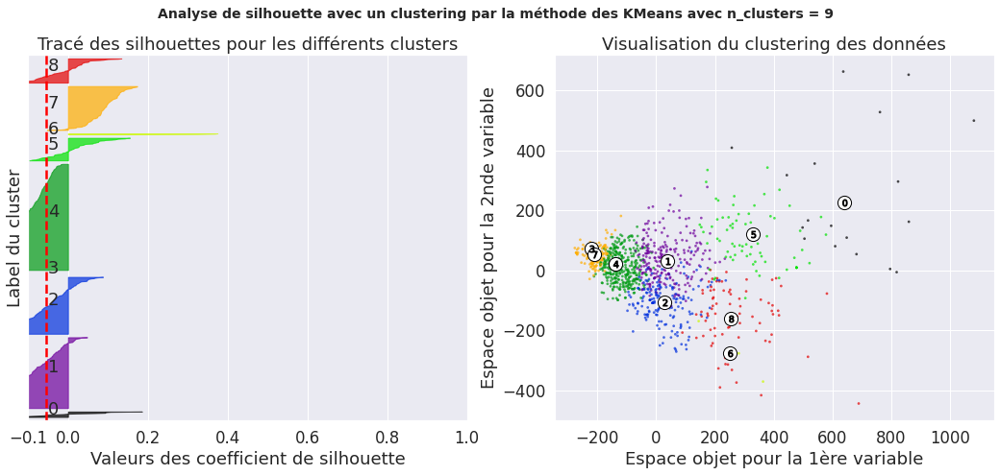

In [124]:
calculate_silhouette_score(range_n_clusters, data_final_transformed, n_init=30)

In [142]:
clustering(data_final_transformed, df, n_clusters=3)
df.head()

,uniq_id,category,description,image,cluster
0,55b85ea15a1536d46b7190ad6fff8ce7,4,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,0
1,7b72c92c2f6c40268628ec5f14c6d590,0,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,2
2,64d5d4a258243731dc7bbb1eef49ad74,0,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,2
3,d4684dcdc759dd9cdf41504698d737d8,4,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,0
4,6325b6870c54cd47be6ebfbffa620ec7,4,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,0


In [129]:
df['cluster'].unique()

array([1, 2, 0], dtype=int32)

In [141]:
df['cluster'].value_counts() 

3    475
1    217
2    163
0    163
4     32
Name: cluster, dtype: int64

In [130]:
# Encoding 'category' 
le = preprocessing.LabelEncoder()
le.fit(df['category'])

le.classes_

le.transform(df['category'])

array([4, 0, 0, ..., 0, 0, 0])

In [131]:
df['category'].unique()

array(['Home Furnishing ', 'Baby Care ', 'Watches ',
       'Home Decor & Festive Needs ', 'Kitchen & Dining ',
       'Beauty and Personal Care ', 'Computers '], dtype=object)

In [132]:
df['category'] = le.transform(df['category'])

In [133]:
df['category'].unique()

array([4, 0, 6, 3, 5, 1, 2])

In [134]:
df['category'].value_counts()

6    150
5    150
4    150
3    150
2    150
1    150
0    150
Name: category, dtype: int64

In [135]:
# Matrice de confusion
y_true = df['category']
y_pred = df['cluster']

confusion_matrix(y_true, y_pred)

array([[ 11,  38, 101,   0,   0,   0,   0],
       [ 35,  58,  57,   0,   0,   0,   0],
       [ 20,  44,  86,   0,   0,   0,   0],
       [ 22,  56,  72,   0,   0,   0,   0],
       [ 18,  76,  56,   0,   0,   0,   0],
       [  6,  71,  73,   0,   0,   0,   0],
       [ 14,  64,  72,   0,   0,   0,   0]])

In [143]:
fashion_tsne = TSNE(random_state=RS).fit_transform(data_final_transformed)

(<Figure size 576x576 with 1 Axes>,
 [Text(0.3795216, 11.070329, '0'),
  Text(-16.721579, 16.186049, '1'),
  Text(2.9313073, -8.567036, '2')])

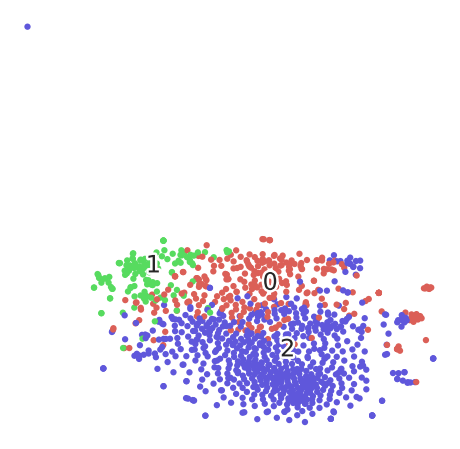

In [144]:
tnse_visualisation(fashion_tsne, df['cluster'])